In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from datetime import datetime,timedelta
import warnings
warnings.filterwarnings('ignore')
from collections import Counter
import time
import re
import pickle
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.ensemble import BaggingClassifier, GradientBoostingClassifier, RandomForestClassifier
import xgboost as xgb
from itertools import product
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import mean_squared_error,accuracy_score,confusion_matrix,classification_report,ndcg_score
from sklearn.metrics import roc_auc_score,roc_curve,auc, precision_score, recall_score, precision_recall_curve
from copy import deepcopy
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from lime.lime_tabular import LimeTabularExplainer
import shap
import wordninja 
from beautifultable import BeautifulTable
from scipy import stats
import itertools
from IPython.display import display

pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

import re
import string
import unicodedata
import pandas as pd
import contractions
from collections import Counter
from spellchecker import SpellChecker
from bs4 import BeautifulSoup
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk import pos_tag
import spacy
from wordsegment import load, segment
from wordcloud import WordCloud


nlp = spacy.load("en_core_web_sm")
nltk.download("punkt")
nltk.download("stopwords")
nltk.download("wordnet")
nltk.download('averaged_perceptron_tagger')
load()

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\91720\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\91720\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\91720\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\91720\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [19]:
data=pd.read_csv('flipitnews-data.csv')

In [20]:
data.head(2)

Category  \
0  Technology   
1    Business   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 

In [21]:
len(data)

2225

In [22]:


import plotly.express as px
category_counts = data['Category'].value_counts().reset_index()
category_counts.columns = ['Category', 'Count']

# Create the bar plot with dynamic blue color scaling
fig = px.bar(category_counts, 
             x='Category', 
             y='Count', 
             color='Count', 
             text='Count', 
             color_continuous_scale='Blues')

# Update layout
fig.update_traces(textposition='outside', textfont=dict(size=12))  # Move labels on top of bars
fig.update_layout(title_text='Distribution Plot column: Category',
                  xaxis_title='Value',
                  yaxis_title='Frequency',
                  template='plotly_white',
                  xaxis=dict(showgrid=False),  
                  yaxis=dict(showgrid=False),
                  coloraxis_showscale=False)  # Hide color scale legend

# Show the figure
fig.show()

display(data.Category.value_counts())



Sports           511
Business         510
Politics         417
Technology       401
Entertainment    386
Name: Category, dtype: int64

#### Dataset is balanced

In [23]:
#pip install wordsegment

In [24]:
#pip install pyspellchecker

In [25]:
#pip install textblob

In [26]:
#pip install wordninja

In [27]:
#pip install wordcloud

In [28]:
special_chars = r"!\"#$%&\'()*+,-/:;<=>?@[\\]^_`{|}~"
escaped_chars = re.escape(special_chars)

class TextPreprocessor:
    def __init__(self, common_threshold=1000, rare_threshold=1):
        self.lemmatizer = WordNetLemmatizer()
        self.spell = SpellChecker()
        self.stop_words = set(stopwords.words("english"))
        self.vocab = Counter()
        self.common_words = set()
        self.rare_words = set()
        self.common_threshold = common_threshold  # absolute count
        self.rare_threshold = rare_threshold  # Absolute count

    def clean_text(self, text):
        """Preprocess text - remove HTML, punctuations, special characters, etc."""
        if not isinstance(text, str):
            return ""

        text = text.lower()
        text = BeautifulSoup(text, "html.parser").get_text()  # Remove HTML tags
        text = re.sub(r"https?://\S+|www\.\S+", "", text)  # Remove URLs
        text = contractions.fix(text)  # Expand contractions
        text = re.sub(r"@[A-Za-z0-9_]+", "", text)  # Remove mentions
        text = re.sub(r"#\S+", "", text)  # Remove hashtags
        text = re.sub(r"\bRT\b", "", text)  # Remove RT
        text = re.sub(r"\S+@\S+", "", text)  # Remove emails
        text = re.sub(r"[0-9]+", "", text)  # Remove numeric vals
        text = self.remove_dots(text)
        text = re.sub(rf"[{escaped_chars}]", "", text)  # Remove punctuation
        text = ''.join(c for c in text if not unicodedata.combining(c))  # Remove accented chars
        text = re.sub(r"\s+", " ", text).strip()  # Remove multiple spaces
        
        tokens = word_tokenize(text)
        tokens = [wordninja.split(word) for word in tokens]   ## breaks any concatenated words like "lookabout" to "look" and "about"
        tokens = [subword for word in tokens for subword in word] 
        
        pos_tags = pos_tag(tokens)
        non_nouns=[]
        for word,tag in pos_tags:     ## only spellcheck non noun words
            if not tag.startswith("NN"):
                non_nouns.append(word)
            
        tokens = [self.spell.correction(word) if (word not in self.spell.known([word])) and\
                  (word in non_nouns) and (self.spell.correction(word) is not None) else word for word in tokens]
        
        return " ".join(tokens)
    
    
    def remove_dots(self, text):
        return re.sub(r'\b([A-Z])(?:\.(?=[A-Z]))+\b', lambda m: m.group(0).replace(".", ""), text)
    def tokenize_and_lemmatize(self, text):
        """Tokenize, spell correct, and lemmatize text."""
        tokens = word_tokenize(text)
        
        tokens = [self.lemmatizer.lemmatize(word) for word in tokens]
        return tokens

    def build_vocab(self, texts):
        """Build vocabulary from a list of tokenized texts."""
        for tokens in texts:
            self.vocab.update(tokens)

        # Identify common words (occurring in more than common_threshold)
        total_docs = len(texts)
        self.common_words = {word for word, count in self.vocab.items() if count > self.common_threshold}

        # Identify rare words (appearing less than rare_threshold times)
        self.rare_words = {word for word, count in self.vocab.items() if count < self.rare_threshold}

    def replace_common_rare(self, tokens):
        """Replace common words with <COMMON> and rare words with <UNK>."""
        return [word for word in tokens if word not in self.rare_words and word not in self.common_words]

    def remove_stopwords(self, tokens):
        """Remove stopwords from tokens."""
        return [word for word in tokens if word not in self.stop_words]

    def preprocess_dataframe(self, df, column="Article"):
        """Preprocess a dataframe column."""
        df = df.copy()
        df[column] = df[column].apply(self.clean_text)
        df["tokens"] = df[column].apply(self.tokenize_and_lemmatize)

        # Build vocab after tokenization
        self.build_vocab(df["tokens"].tolist())

        # Replace common/rare words and remove stopwords
        df["tokens"] = df["tokens"].apply(self.replace_common_rare)
        df["tokens"] = df["tokens"].apply(self.remove_stopwords)

        return df


preprocessor = TextPreprocessor()
data = preprocessor.preprocess_dataframe(data)


In [29]:
def get_noun_phrases_parent(text):
    doc = nlp(text)
    required_nc = []
    
    for chunk in doc.noun_chunks:
        nc_parent = chunk.root.head  # Get parent head word
        new_nc = [token.text for token in chunk if token.pos_ in ["NOUN", "PROPN"]]  # Extract NOUN/PROPN
        
        if new_nc:  # Only add if nouns exist
            new_nc_text = " ".join(new_nc) #+ " -> " + nc_parent.text
            required_nc.append(new_nc_text)
    
    return required_nc


def get_noun_phrases_details(text):
    doc = nlp(text)
    noun_phrases_dep = []  # Stores 'Noun phrase -> dependency type'
    noun_phrases_siblings = []  # Stores 'Noun phrase -> its siblings'
    
    noun_chunks_dict = {}  # Stores noun phrase -> parent head for sibling mapping
    
    # Extract noun phrases, their dependency relations, and parents
    for chunk in doc.noun_chunks:
        np_text = chunk.text
        np_root = chunk.root  # Root word of noun phrase
        np_dep = np_root.dep_  # Dependency type
        np_parent = np_root.head  # Parent of noun phrase root
        
        noun_phrases_dep.append(f"{np_text} -> {np_dep}")
        noun_chunks_dict[np_text] = np_parent  # Store parent for sibling grouping
    
    # Identify noun phrase siblings
    for np, parent in noun_chunks_dict.items():
        siblings = [n for n, p in noun_chunks_dict.items() if p == parent and n != np]  # Find siblings
        if siblings:
            noun_phrases_siblings.append(sorted([np]+list(siblings)))
        else:
            noun_phrases_siblings.append([np])
    
    return noun_phrases_dep, [' '.join(s) for s in noun_phrases_siblings]

In [30]:
data["noun_phrases"] = data["Article"].apply(get_noun_phrases_parent)
data[['noun_phrase_dependency', 'noun_phrase_siblings']] = data['Article'].apply(lambda x: pd.Series(get_noun_phrases_details(x)))



In [31]:
data.head()

Category  \
0     Technology   
1       Business   
2         Sports   
3         Sports   
4  Entertainment   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               

In [32]:


def get_frequent_tokens(data, col):
    # Group by category and analyze noun phrases
    category_groups = data.groupby('Category')[col].sum()  # Aggregate lists

    results = []  # Store category-wise results

    for category, phrases in category_groups.items():
        phrase_counts = Counter(phrases)  # Count occurrences
        total_phrases = sum(phrase_counts.values())  # Total phrases in this category
        
        # Get top 20 phrases
        top_20 = phrase_counts.most_common(20)

        # Convert for WordCloud input format
        wordcloud_text = " ".join([phrase for phrase, _ in top_20])

        # Plot WordCloud
        plt.figure(figsize=(10, 5))
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(wordcloud_text)
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"WordCloud for {category}")
        plt.show()

        # Compute document frequency for each phrase
        doc_counts = data[data["Category"] == category][col].apply(lambda x: set(x))  # Convert to sets per document
        doc_freqs = Counter([phrase for doc in doc_counts for phrase in doc])  # Count documents containing each phrase
        total_docs = len(doc_counts)  # Total documents in category

        # Prepare DataFrame
        top_20_df = pd.DataFrame(top_20, columns=['Noun Phrase', 'Count'])
        top_20_df['% of Documents'] = top_20_df['Noun Phrase'].apply(lambda x: (doc_freqs[x] / total_docs) * 100)
        top_20_df['% of Category Phrases'] = top_20_df['Count'].apply(lambda x: (x / total_phrases) * 100)

        # Store results
        results.append((category, top_20_df))

        # Display results
        print(f"Top 20 Noun Phrases for Category: {category}")
        display(top_20_df)
        print("\n" + "="*50 + "\n")
    
    return results  # Return structured results if needed

# Call the function


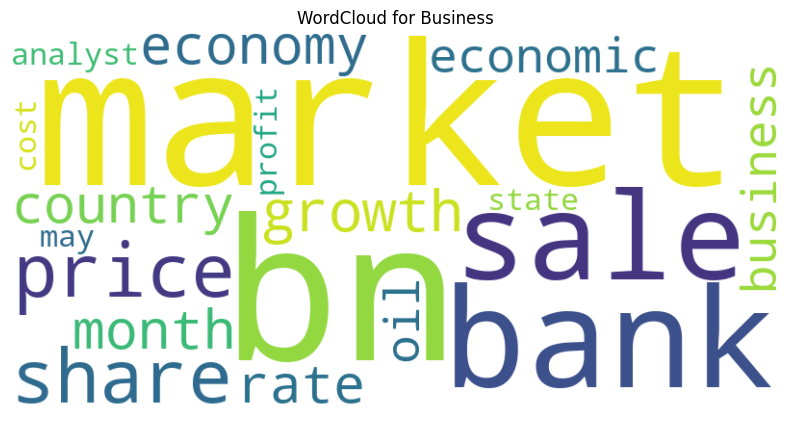

Top 20 Noun Phrases for Category: Business


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,bn,782,48.431373,0.862697
1,market,530,48.627451,0.584692
2,bank,420,28.039216,0.463341
3,sale,416,30.196078,0.458928
4,price,392,30.980392,0.432452
5,share,390,31.960784,0.430245
6,growth,385,33.529412,0.424729
7,economy,383,29.019608,0.422523
8,month,336,41.764706,0.370673
9,country,322,30.588235,0.355228


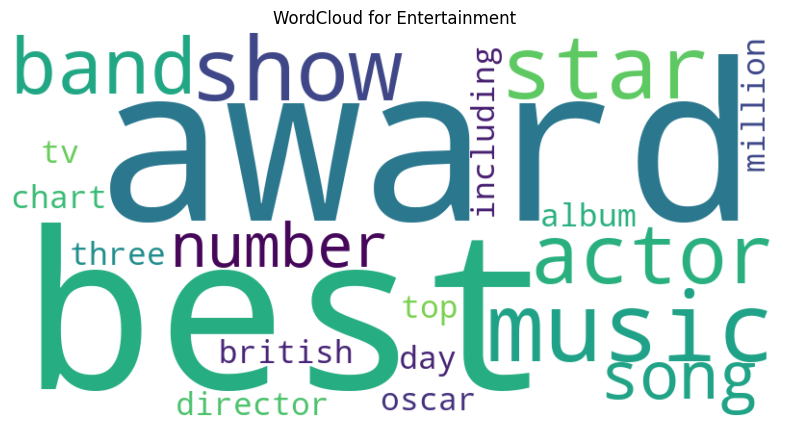

Top 20 Noun Phrases for Category: Entertainment


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,best,602,34.974093,0.884982
1,award,517,39.119171,0.760026
2,music,439,30.310881,0.645360
3,show,413,38.601036,0.607139
4,star,352,47.927461,0.517464
5,actor,252,28.238342,0.370457
6,band,242,18.911917,0.355757
7,song,236,19.948187,0.346936
8,number,235,26.424870,0.345466
9,director,232,30.310881,0.341056


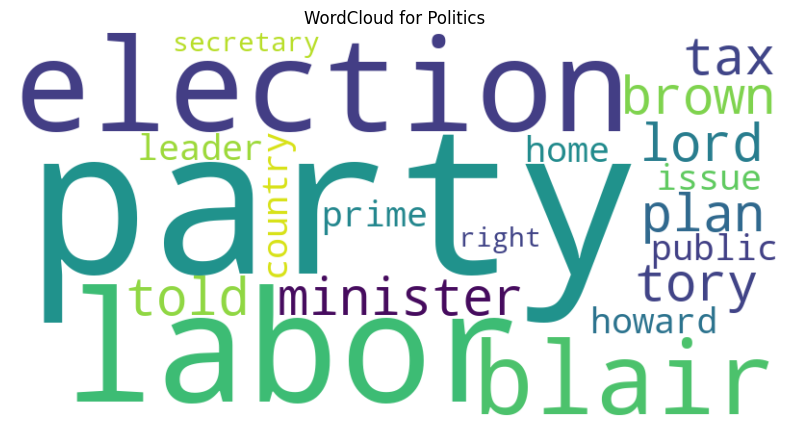

Top 20 Noun Phrases for Category: Politics


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,party,726,51.079137,0.759112
1,labor,713,41.007194,0.745520
2,election,668,46.282974,0.698467
3,blair,581,39.568345,0.607499
4,minister,569,60.191847,0.594952
5,tory,519,44.124700,0.542671
6,plan,409,41.007194,0.427654
7,brown,390,19.904077,0.407788
8,tax,361,19.664269,0.377465
9,lord,360,18.705036,0.376419


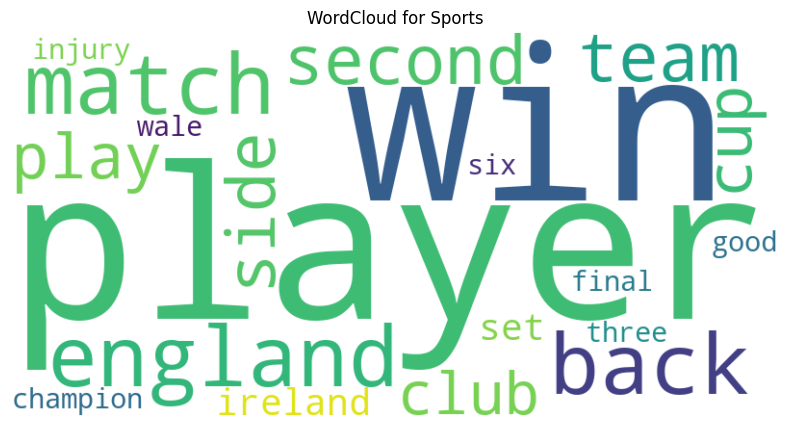

Top 20 Noun Phrases for Category: Sports


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,player,479,45.205479,0.539056
1,win,472,49.706458,0.531179
2,england,461,26.810176,0.518799
3,back,373,42.465753,0.419766
4,match,349,36.594912,0.392757
5,second,338,35.225049,0.380378
6,team,315,34.246575,0.354494
7,side,314,33.855186,0.353369
8,play,312,34.442270,0.351118
9,cup,294,27.984344,0.330861


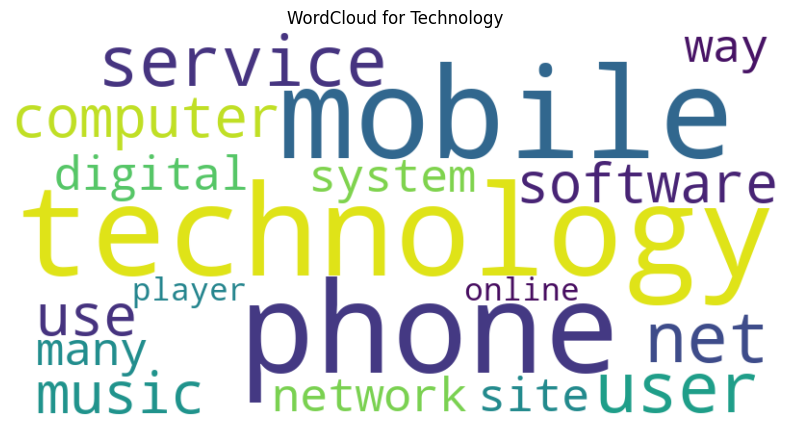

Top 20 Noun Phrases for Category: Technology


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,technology,618,50.623441,0.590049
1,mobile,614,25.187032,0.586230
2,phone,547,25.935162,0.522261
3,service,516,42.144638,0.492663
4,user,476,46.384040,0.454472
5,net,443,35.660848,0.422964
6,computer,426,42.394015,0.406733
7,music,389,28.179551,0.371406
8,use,381,48.628429,0.363768
9,software,374,31.920200,0.357085


In [33]:
results = get_frequent_tokens(data, 'tokens')

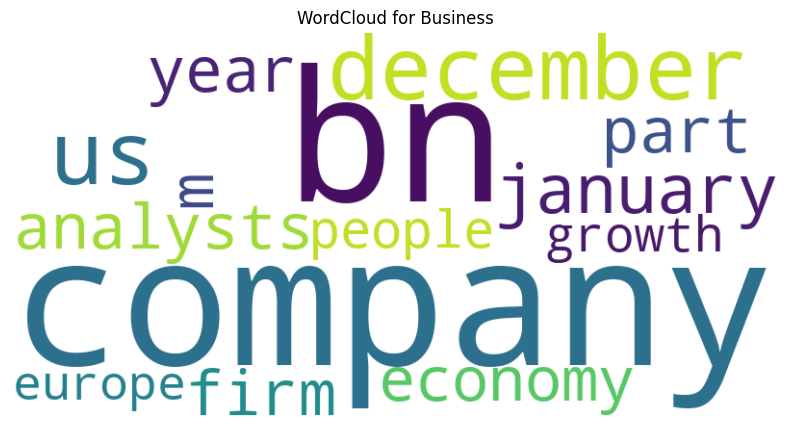

Top 20 Noun Phrases for Category: Business


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,it,295,57.843137,0.835386
1,he,161,31.568627,0.455923
2,we,136,26.666667,0.385127
3,they,115,22.549020,0.325659
4,the company,115,22.549020,0.325659
5,i,111,21.764706,0.314332
6,bn,111,21.764706,0.314332
7,december,89,17.450980,0.252032
8,the us,86,16.862745,0.243536
9,who,77,15.098039,0.218050


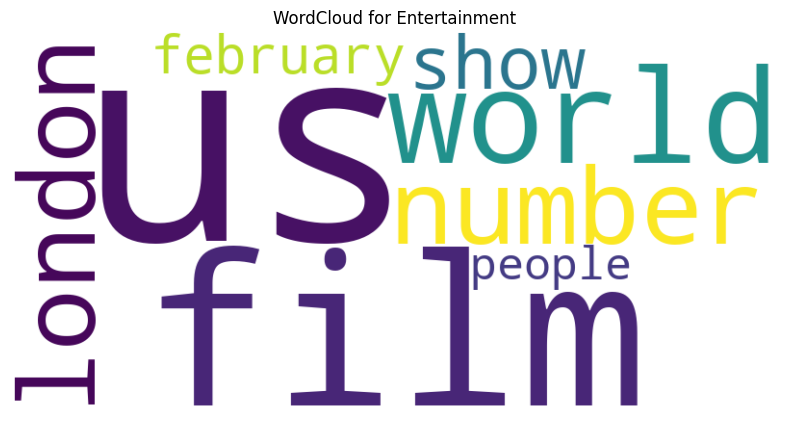

Top 20 Noun Phrases for Category: Entertainment


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,it,208,53.886010,0.771828
1,he,158,40.932642,0.586293
2,i,136,35.233161,0.504657
3,who,135,34.974093,0.500946
4,they,97,25.129534,0.359939
5,we,95,24.611399,0.352518
6,she,88,22.797927,0.326543
7,you,66,17.098446,0.244907
8,the us,60,15.544041,0.222643
9,the film,59,15.284974,0.218932


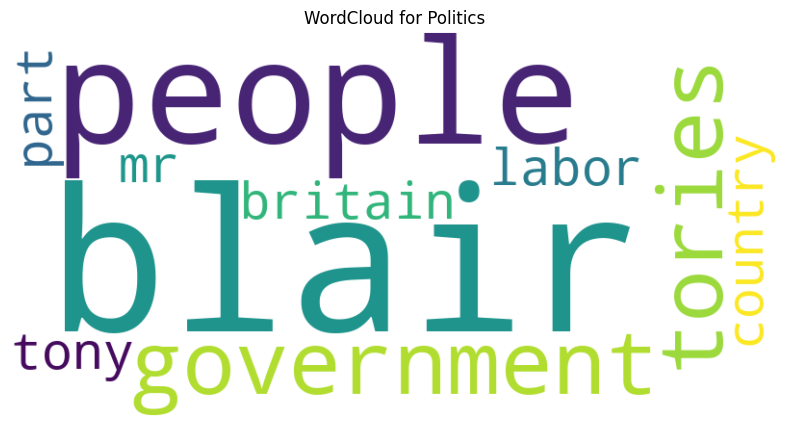

Top 20 Noun Phrases for Category: Politics


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,it,273,65.467626,0.723658
1,he,265,63.549161,0.702452
2,they,209,50.119904,0.554009
3,i,173,41.486811,0.458582
4,we,170,40.767386,0.450630
5,people,154,36.930456,0.408217
6,who,151,36.211031,0.400265
7,them,116,27.817746,0.307488
8,what,100,23.980815,0.265076
9,the government,98,23.501199,0.259775


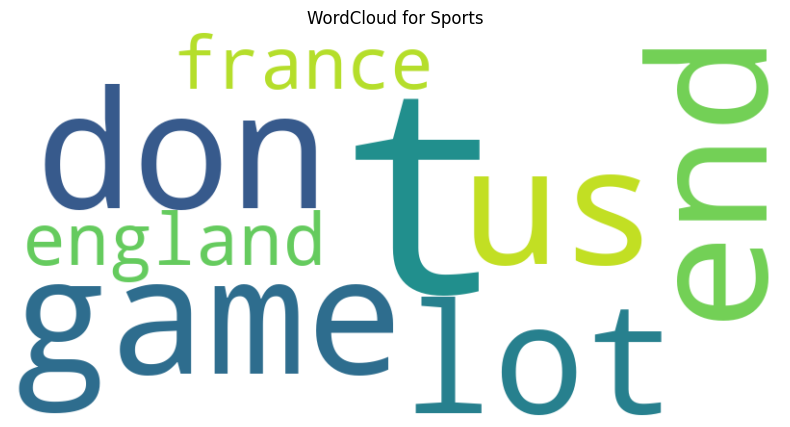

Top 20 Noun Phrases for Category: Sports


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,i,301,58.904110,0.880993
1,he,281,54.990215,0.822455
2,it,234,45.792564,0.684891
3,we,183,35.812133,0.535620
4,they,151,29.549902,0.441960
5,who,149,29.158513,0.436106
6,him,123,24.070450,0.360007
7,you,119,23.287671,0.348299
8,me,107,20.939335,0.313177
9,them,100,19.569472,0.292689


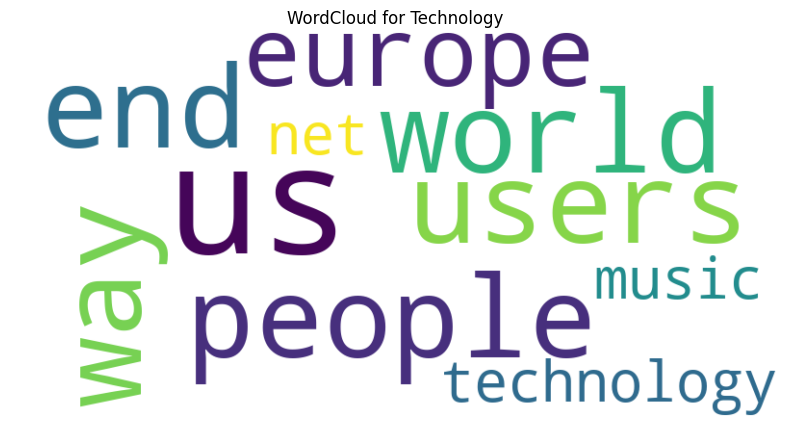

Top 20 Noun Phrases for Category: Technology


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,it,258,64.339152,0.636864
1,he,206,51.371571,0.508504
2,they,180,44.887781,0.444324
3,people,175,43.640898,0.431981
4,them,161,40.149626,0.397423
5,we,140,34.912718,0.345585
6,i,100,24.937656,0.246847
7,what,86,21.446384,0.212288
8,who,84,20.947631,0.207351
9,you,82,20.448878,0.202414


In [34]:
results = get_frequent_tokens(data, 'noun_phrase_siblings')


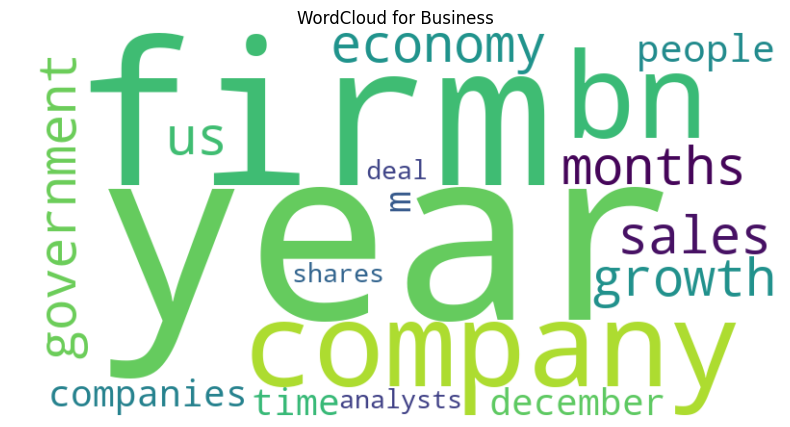

Top 20 Noun Phrases for Category: Business


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,year,278,35.294118,0.734148
1,company,247,31.372549,0.652283
2,bn,235,25.686275,0.620593
3,growth,220,23.725490,0.580981
4,government,204,22.745098,0.538728
5,years,201,30.784314,0.530805
6,economy,200,19.215686,0.528164
7,firm,165,22.156863,0.435736
8,us,163,20.980392,0.430454
9,months,160,24.901961,0.422531


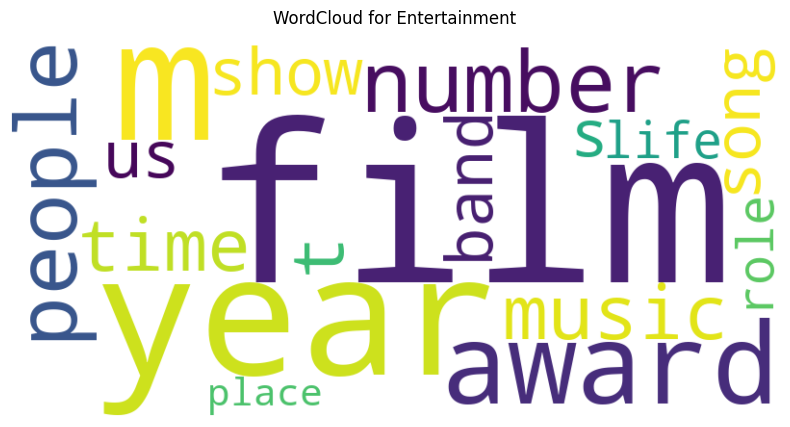

Top 20 Noun Phrases for Category: Entertainment


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,film,330,34.715026,1.199695
1,people,178,25.388601,0.647108
2,years,163,24.093264,0.592576
3,number,160,22.538860,0.581670
4,music,160,13.212435,0.581670
5,films,145,20.984456,0.527139
6,time,137,26.165803,0.498055
7,t,130,16.580311,0.472607
8,show,126,17.875648,0.458065
9,year,125,23.575130,0.454430


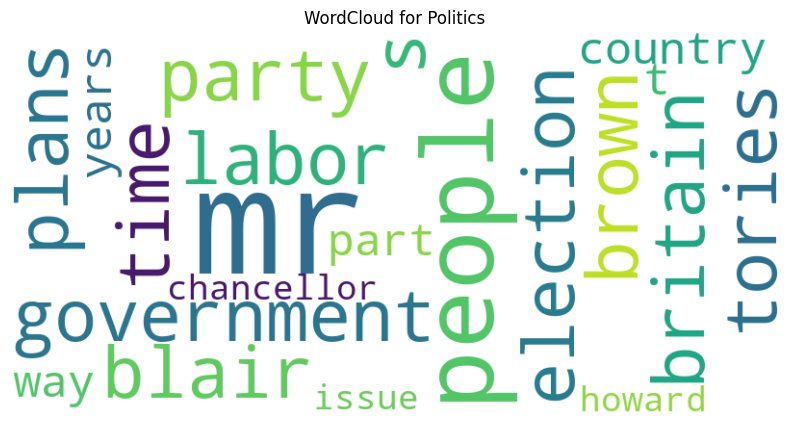

Top 20 Noun Phrases for Category: Politics


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,people,566,57.074341,1.392511
1,government,452,49.640288,1.112041
2,election,332,39.328537,0.816809
3,party,286,29.016787,0.703636
4,mr blair,270,23.980815,0.664272
5,labor,249,27.098321,0.612606
6,tories,215,27.338129,0.528957
7,mr brown,194,13.908873,0.477292
8,britain,183,25.659472,0.450229
9,plans,174,23.261391,0.428086


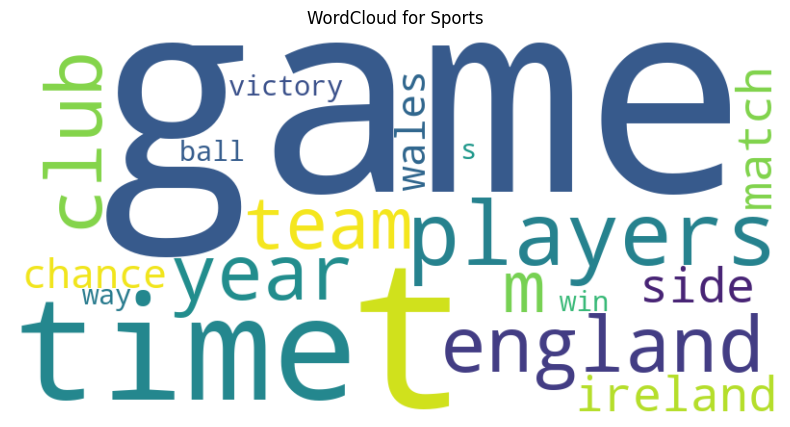

Top 20 Noun Phrases for Category: Sports


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,game,352,37.377691,1.025283
1,t,280,36.203523,0.815566
2,time,258,35.225049,0.751485
3,players,256,29.158513,0.745660
4,england,198,17.612524,0.576721
5,year,165,22.309198,0.480601
6,club,162,15.459883,0.471863
7,team,157,23.287671,0.457299
8,m,155,14.090020,0.451474
9,ireland,139,12.720157,0.404870


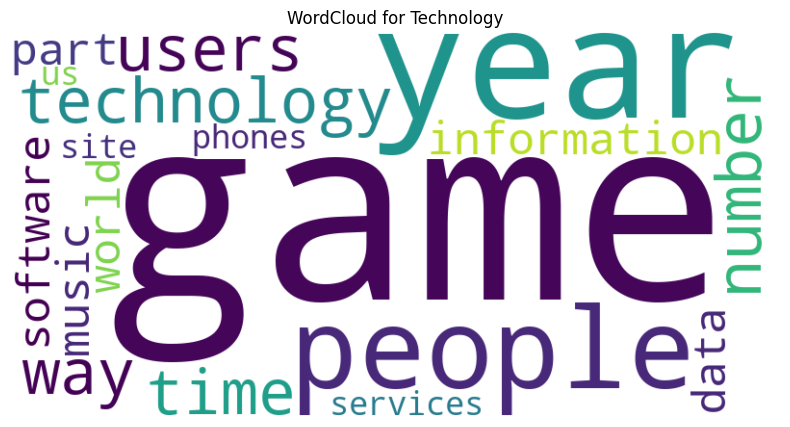

Top 20 Noun Phrases for Category: Technology


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,people,886,71.072319,2.034396
1,technology,269,30.673317,0.617667
2,users,254,30.673317,0.583224
3,way,239,39.900249,0.548782
4,time,238,35.910224,0.546486
5,games,201,14.463840,0.461528
6,number,179,30.922693,0.411012
7,information,179,23.192020,0.411012
8,software,168,20.199501,0.385755
9,world,164,25.436409,0.376570


In [35]:
results = get_frequent_tokens(data, 'noun_phrases')

In [36]:
def filter_numeric(data,coll):
    enum_coll=list(enumerate(coll))
    cols=data.select_dtypes(include=['number']).columns
    cc=[]
    for col in cols:
        if (data[col].nunique(dropna=True)>2) or\
        ((sorted(list(data[col].dropna().unique()))!=[0,1]) and\
        (sorted(list(data[col].dropna().unique()))!=[0]) and\
        (sorted(list(data[col].dropna().unique()))!=[1])):
            cc.append(col)

    cols=cc
    numeric_cols=list(set(cols).intersection(set(coll)))
    li=[sett[1] for sett in enum_coll if sett[1] in numeric_cols]
    return li

def standardize_data(d,cols,strategy='standard'):
    if strategy=='standard':
        scalar=StandardScaler()
    else:
        scalar=MinMaxScaler()
    data=d.copy()
    cols=filter_numeric(data,cols)
    #print(cols)
    data.loc[:,cols]=pd.DataFrame(scalar.fit_transform(data[cols]),columns=cols,index=data.index)

    return data,scalar,cols

def transform_standardize_data(d,cols,scalar):
    data=d.copy()
    data.loc[:,cols]=pd.DataFrame(scalar.transform(data[cols]),columns=cols,index=data.index)
    return data

def revtransform_standardize_data(d,cols,scalar):
    data=d.copy()
    data.loc[:,cols]=pd.DataFrame(scalar.inverse_transform(data[cols]),columns=cols,index=data.index)
    return data

In [37]:

def train_test(dd,x_cols,y_col,stratify_col=None):
    d=dd.copy()
    d=d.sample(frac=1,random_state=0)
    random_sample_index_map={i:j for i,j in list(enumerate(list(d.index)))}
    d.reset_index(drop=True,inplace=True)
    xtrain,xtest,ytrain,ytest=train_test_split(d.loc[:,x_cols]
                                               ,d.loc[:,y_col]
                                               ,test_size=0.20  #20% val_size
                                               ,random_state=0,stratify=stratify_col)
    return xtrain,xtest,ytrain,ytest,random_sample_index_map


def train_vectorizer(train_data, col, method="tfidf", max_features=5000, ngram_range=(1,1)):
    dd=train_data.copy()
    dd[col] = dd[col].apply(lambda x: " ".join(x))
    
    if method == "tfidf":
        vectorizer = TfidfVectorizer(max_features=max_features, ngram_range=ngram_range)
    else:
        vectorizer = CountVectorizer(max_features=max_features, ngram_range=ngram_range)
    
    train_vectors = vectorizer.fit_transform(dd[col])
    
    #print(train_vectors.shape,vectorizer.get_feature_names_out())
    return vectorizer, pd.DataFrame(train_vectors.toarray(),columns=vectorizer.get_feature_names_out())


def transform_test(test_data, col, vectorizer):
    dd=test_data.copy()
    dd[col] = dd[col].apply(lambda x: " ".join(x))
    test_vectors = vectorizer.transform(dd[col])
    return pd.DataFrame(test_vectors.toarray(),columns=vectorizer.get_feature_names_out())



xtrain,xtest,ytrain,ytest,random_sample_index_map=train_test(data,['tokens'],'Category',data['Category'])
xtrain_index_dict={i:random_sample_index_map[j] for i,j in list(enumerate(list(xtrain.index)))}
xtest_index_dict={i:random_sample_index_map[j] for i,j in list(enumerate(list(xtest.index)))}


xtrain.reset_index(drop=True,inplace=True)
xtest.reset_index(drop=True,inplace=True)
ytrain.reset_index(drop=True,inplace=True)
ytest.reset_index(drop=True,inplace=True)

## tf-idf vectorize
vectorizer, xtrain = train_vectorizer(xtrain, col='tokens', method="tfidf", max_features=5000, ngram_range=(1,1))

xtest=transform_test(xtest, col='tokens', vectorizer=vectorizer)

## Standard scale the columns
xtrain,scalar,numeric_cols=standardize_data(xtrain,xtrain.columns)
xtest=transform_standardize_data(xtest,numeric_cols,scalar)


In [38]:
target_encode={t:ind for ind,t in enumerate(data['Category'].unique())}
rev_target_encode={ind:t for ind,t in enumerate(data['Category'].unique())}

ytrain=ytrain.map(target_encode)
ytest=ytest.map(target_encode)

In [39]:
def itertool_comb(params,estimator_pkl,key_to_ignore=['regressor','classifier']):
    param_list=[]
    for param in params:
        estimator=[value[0] for key,value in param.items() if key in key_to_ignore]
        keys=[key.split('__')[1] for key,value in param.items() if key not in key_to_ignore]
        values=[value for key,value in param.items() if key not in key_to_ignore]
        values=list(product(*values))
        iter_list=[]
        for i in range(len(values)):
            iter_dict=dict()
            for j in range(len(values[i])):
                iter_dict[keys[j]]=values[i][j]
            iter_list.append([estimator[0],iter_dict])
        for l in iter_list:
            param_list.append(l)

    par_dict={
        'param_grid':param_list,
        'checkpoint_index':0,  ##from param_list
        'best_param_index':None,
        'best_estimator':None,

        'best_val_accuracy':0,
        'best_val_ndcg': 0

        
    }

    pickle.dump(par_dict,open(estimator_pkl,'wb'))

def calculate_ndcg_score(y_true, y_pred_prob, k=10):
    ndcg_scores = []
    
    for i in range(len(y_true)):
        true_index = y_true[i]  # Use integer index directly
        
        # Sort indices by descending predicted probabilities
        sorted_indices = np.argsort(y_pred_prob.iloc[i].values)[::-1]
        
        # Relevance scores: 1 if true class is in the top k, else 0
        relevance_scores = (sorted_indices[:k] == true_index).astype(int)
        
        # Calculate DCG
        dcg = sum(rel / np.log2(j + 2) for j, rel in enumerate(relevance_scores))
        
        # Calculate IDCG (Ideal DCG)
        idcg = 1 / np.log2(2)  # True label at the top is optimal
        
        # Normalize DCG by IDCG to get NDCG
        ndcg = dcg / idcg if idcg > 0 else 0
        ndcg_scores.append(ndcg)
    
    return np.mean(ndcg_scores)

def accuracy_checks(y_true, y_pred_prob):
    
    y_true_labels = y_true.idxmax(axis=1).map({col: idx for idx, col in enumerate(y_true.columns)}).values
    y_pred= y_pred_prob.idxmax(axis=1).map({col: idx for idx, col in enumerate(y_pred_prob.columns)}).values
    
    accuracy = accuracy_score(y_true_labels, y_pred)
    conf_matrix = confusion_matrix(y_true_labels, y_pred)
    
    labels=[rev_target_encode[yy] for yy in y_true.columns]
    plt.figure(figsize=(10, 7))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", 
                xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()
    
    # Print classification report
    print('Classification Report:')
    print(classification_report(y_true_labels, y_pred, target_names=labels))
    ndcg_score = calculate_ndcg_score(y_true_labels, y_pred_prob, k=2)
    


    print('Accuracy: {}\nNDCG score with 1st 2 relevant ranks: {}'.format(accuracy,ndcg_score))
    return accuracy,ndcg_score



def training(xtrain,ytrain,estimator_pkl,n_splits=5):

    param_dict=pickle.load(open(estimator_pkl,'rb'))
    param_grid=param_dict['param_grid']
    checkpoint_index=param_dict['checkpoint_index']  ##one already covered
    best_param_index=param_dict['best_param_index']

    best_val_accuracy=param_dict['best_val_accuracy']
    best_val_ndcg=param_dict['best_val_ndcg']
    

    ind=0
    if (checkpoint_index!=0) and (checkpoint_index!=len(param_grid)-1):
        ind=checkpoint_index+1

    while ind<len(param_grid):
        start_time=time.time()
        estimator=param_grid[ind][0]
        parameters=param_grid[ind][1]
        estimator.set_params(**parameters)

        skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
        #smote = SMOTE(random_state=42)

        stratify_col=ytrain.astype(str)


        # Perform Stratified K-Fold Cross-Validation
        fold = 0
        accuracies = []
        ndcgs=[]


        print('Iteration:',ind+1)
        print(str(estimator))
        print('=========================Training in Folds===========================')
        for train_index, test_index in skf.split(xtrain, stratify_col):
            fold += 1
            print('============Fold {}============='.format(fold))
            X_train, X_val = xtrain.iloc[train_index], xtrain.iloc[test_index]
            y_train, y_val = ytrain.iloc[train_index], ytrain.iloc[test_index]
            X_train.reset_index(drop=True,inplace=True)
            X_val.reset_index(drop=True,inplace=True)
            y_train.reset_index(drop=True,inplace=True)
            y_val.reset_index(drop=True,inplace=True)


            X_train_resampled, y_train_resampled = X_train, y_train #smote.fit_resample(X_train, y_train)

            estimator.fit(X_train_resampled,y_train_resampled)
            ypred_train_prob=pd.DataFrame(estimator.predict_proba(X_train_resampled),columns=estimator.classes_)
            ypred_val_prob=pd.DataFrame(estimator.predict_proba(X_val),columns=estimator.classes_)
            
            y_train_encoded = pd.get_dummies(y_train_resampled).astype(int)
            y_test_encoded = pd.get_dummies(y_val).astype(int)
            
            print('==========================Train metrics================================')
            _,_=accuracy_checks(y_train_encoded,ypred_train_prob)
            
            print('==========================Val metrics================================')
            val_accuracy,val_ndcg=accuracy_checks(y_test_encoded,ypred_val_prob)

            accuracies.append(val_accuracy)
            ndcgs.append(val_ndcg)
            



        print('==========================End of Folds================================')
        acc=sum(accuracies)/n_splits
        ndcg=sum(ndcgs)/n_splits
        


        if ndcg>best_val_ndcg:
            param_dict['best_param_index']=ind
            param_dict['best_estimator']=deepcopy(estimator)

            param_dict['best_val_accuracy']=acc
            param_dict['best_val_ndcg']=ndcg
            



        param_dict['checkpoint_index']=ind
        print('========================================================================')
        print('time taken(mins): ',(time.time()-start_time)/60)
        print("param_dict[best_estimator]: ",param_dict['best_estimator'])
        print("param_dict[best_val_accuracy]: ",param_dict['best_val_accuracy'])
        print("param_dict[best_val_ndcg]: ",param_dict['best_val_ndcg'])

        print('========================================================================')

        pickle.dump(param_dict,open(estimator_pkl,'wb'))

        checkpoint_index=param_dict['checkpoint_index']
        best_param_index=param_dict['best_param_index']
        best_val_accuracy=param_dict['best_val_accuracy']
        best_val_ndcg=param_dict['best_val_ndcg']


        ind+=1
        
def find_best_model(estimator_pkl,xtrain,ytrain,xtest,ytest,n_splits,is_first):

    ##creating pickle file first time
    if is_first:
        itertool_comb(param,estimator_pkl)

    training(xtrain,ytrain,estimator_pkl,n_splits)

Iteration: 1
RandomForestClassifier(max_depth=3, n_estimators=200, oob_score=True)
=========================Training in Folds===========================
============Fold 1=============
==========================Train metrics================================


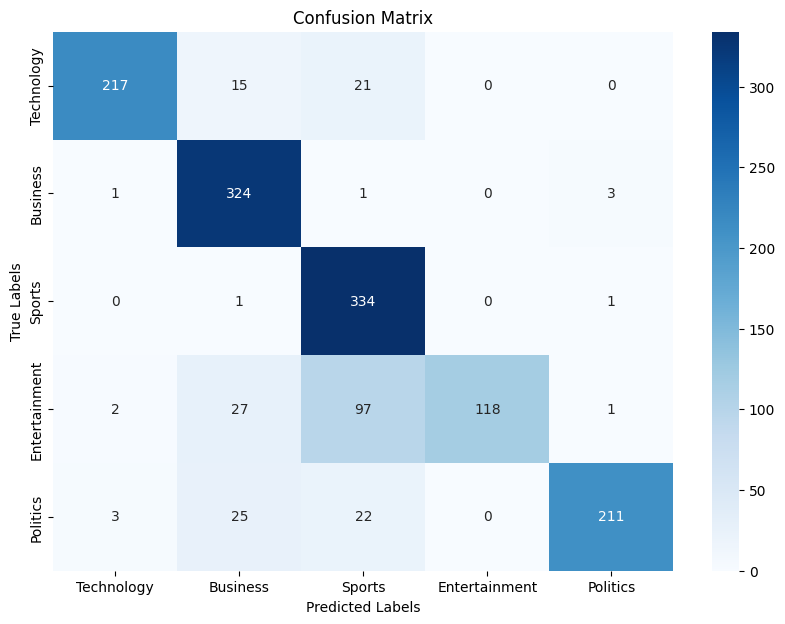

Classification Report:
               precision    recall  f1-score   support

   Technology       0.97      0.86      0.91       253
     Business       0.83      0.98      0.90       329
       Sports       0.70      0.99      0.82       336
Entertainment       1.00      0.48      0.65       245
     Politics       0.98      0.81      0.88       261

     accuracy                           0.85      1424
    macro avg       0.90      0.83      0.83      1424
 weighted avg       0.88      0.85      0.84      1424

Accuracy: 0.8455056179775281
NDCG score with 1st 2 relevant ranks: 0.8831664529870603
==========================Val metrics================================


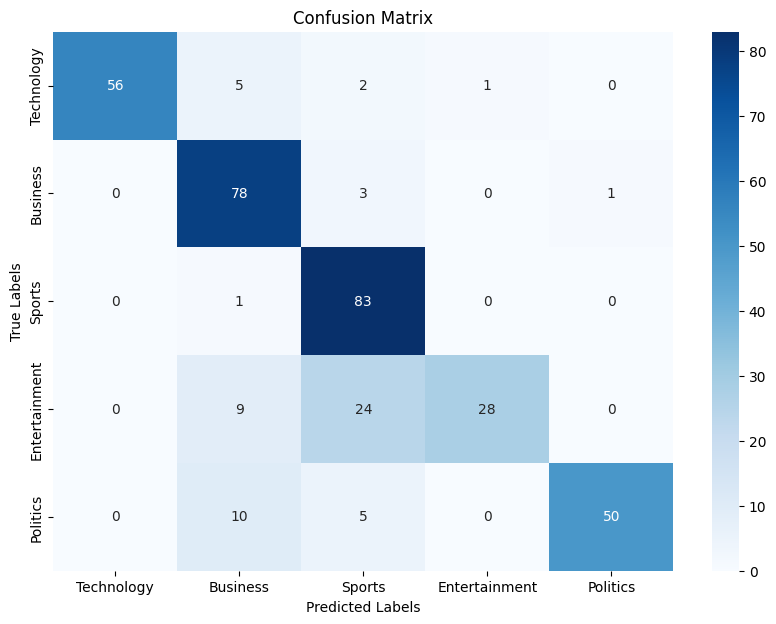

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      0.88      0.93        64
     Business       0.76      0.95      0.84        82
       Sports       0.71      0.99      0.83        84
Entertainment       0.97      0.46      0.62        61
     Politics       0.98      0.77      0.86        65

     accuracy                           0.83       356
    macro avg       0.88      0.81      0.82       356
 weighted avg       0.87      0.83      0.82       356

Accuracy: 0.8286516853932584
NDCG score with 1st 2 relevant ranks: 0.874730824699039
============Fold 2=============
==========================Train metrics================================


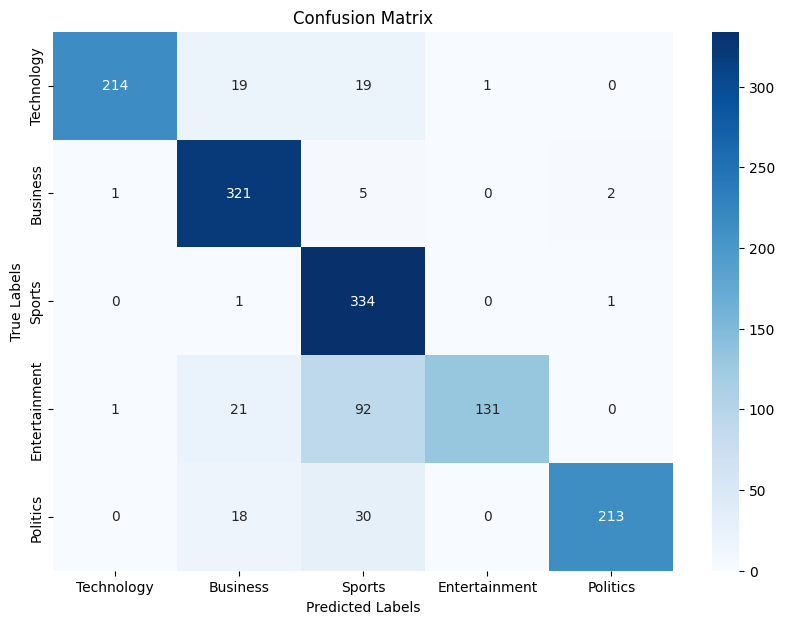

Classification Report:
               precision    recall  f1-score   support

   Technology       0.99      0.85      0.91       253
     Business       0.84      0.98      0.91       329
       Sports       0.70      0.99      0.82       336
Entertainment       0.99      0.53      0.69       245
     Politics       0.99      0.82      0.89       261

     accuracy                           0.85      1424
    macro avg       0.90      0.83      0.84      1424
 weighted avg       0.89      0.85      0.85      1424

Accuracy: 0.8518258426966292
NDCG score with 1st 2 relevant ranks: 0.8903728150005034
==========================Val metrics================================


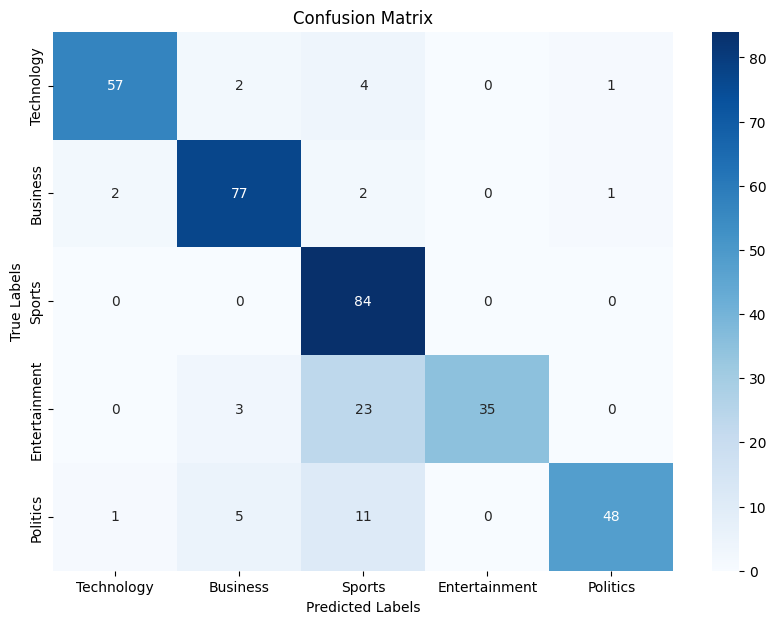

Classification Report:
               precision    recall  f1-score   support

   Technology       0.95      0.89      0.92        64
     Business       0.89      0.94      0.91        82
       Sports       0.68      1.00      0.81        84
Entertainment       1.00      0.57      0.73        61
     Politics       0.96      0.74      0.83        65

     accuracy                           0.85       356
    macro avg       0.89      0.83      0.84       356
 weighted avg       0.88      0.85      0.84       356

Accuracy: 0.8455056179775281
NDCG score with 1st 2 relevant ranks: 0.8844956589285733
============Fold 3=============
==========================Train metrics================================


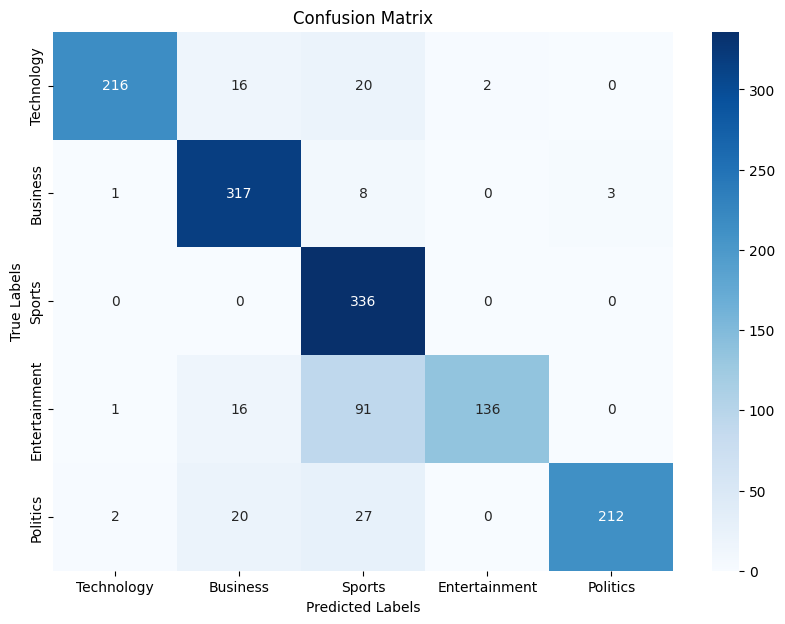

Classification Report:
               precision    recall  f1-score   support

   Technology       0.98      0.85      0.91       254
     Business       0.86      0.96      0.91       329
       Sports       0.70      1.00      0.82       336
Entertainment       0.99      0.56      0.71       244
     Politics       0.99      0.81      0.89       261

     accuracy                           0.85      1424
    macro avg       0.90      0.84      0.85      1424
 weighted avg       0.89      0.85      0.85      1424

Accuracy: 0.8546348314606742
NDCG score with 1st 2 relevant ranks: 0.8949540783532323
==========================Val metrics================================


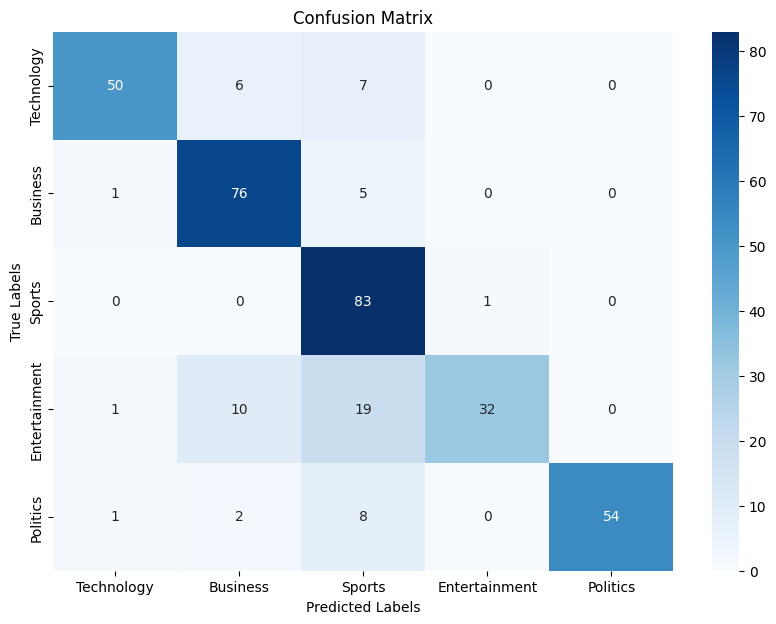

Classification Report:
               precision    recall  f1-score   support

   Technology       0.94      0.79      0.86        63
     Business       0.81      0.93      0.86        82
       Sports       0.68      0.99      0.81        84
Entertainment       0.97      0.52      0.67        62
     Politics       1.00      0.83      0.91        65

     accuracy                           0.83       356
    macro avg       0.88      0.81      0.82       356
 weighted avg       0.87      0.83      0.82       356

Accuracy: 0.8286516853932584
NDCG score with 1st 2 relevant ranks: 0.874730824699039
============Fold 4=============
==========================Train metrics================================


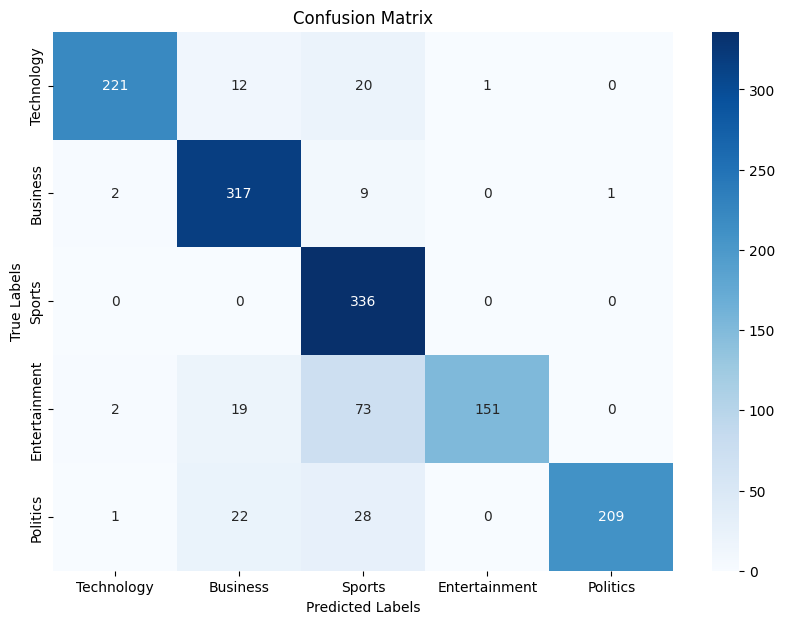

Classification Report:
               precision    recall  f1-score   support

   Technology       0.98      0.87      0.92       254
     Business       0.86      0.96      0.91       329
       Sports       0.72      1.00      0.84       336
Entertainment       0.99      0.62      0.76       245
     Politics       1.00      0.80      0.89       260

     accuracy                           0.87      1424
    macro avg       0.91      0.85      0.86      1424
 weighted avg       0.90      0.87      0.86      1424

Accuracy: 0.8665730337078652
NDCG score with 1st 2 relevant ranks: 0.8958155644211492
==========================Val metrics================================


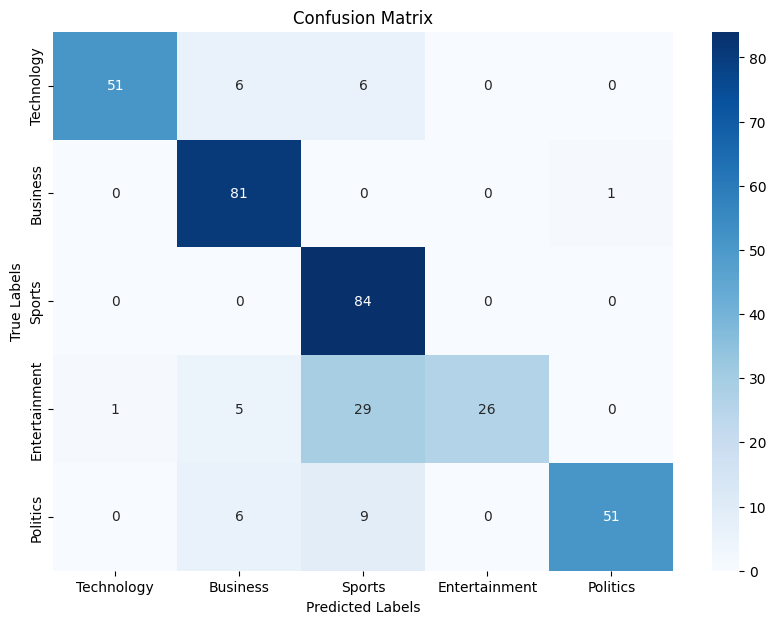

Classification Report:
               precision    recall  f1-score   support

   Technology       0.98      0.81      0.89        63
     Business       0.83      0.99      0.90        82
       Sports       0.66      1.00      0.79        84
Entertainment       1.00      0.43      0.60        61
     Politics       0.98      0.77      0.86        66

     accuracy                           0.82       356
    macro avg       0.89      0.80      0.81       356
 weighted avg       0.87      0.82      0.81       356

Accuracy: 0.8230337078651685
NDCG score with 1st 2 relevant ranks: 0.8602514742275298
============Fold 5=============
==========================Train metrics================================


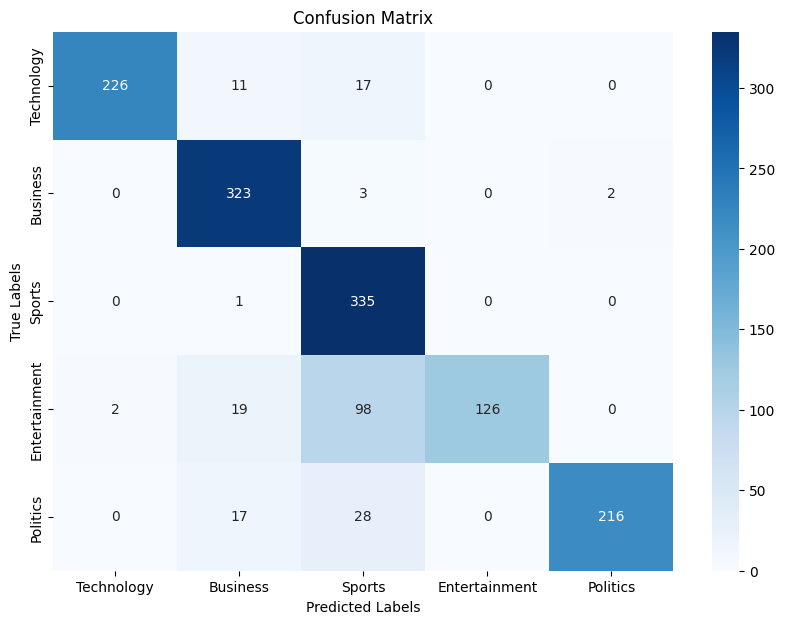

Classification Report:
               precision    recall  f1-score   support

   Technology       0.99      0.89      0.94       254
     Business       0.87      0.98      0.92       328
       Sports       0.70      1.00      0.82       336
Entertainment       1.00      0.51      0.68       245
     Politics       0.99      0.83      0.90       261

     accuracy                           0.86      1424
    macro avg       0.91      0.84      0.85      1424
 weighted avg       0.90      0.86      0.86      1424

Accuracy: 0.8609550561797753
NDCG score with 1st 2 relevant ranks: 0.8946282733647688
==========================Val metrics================================


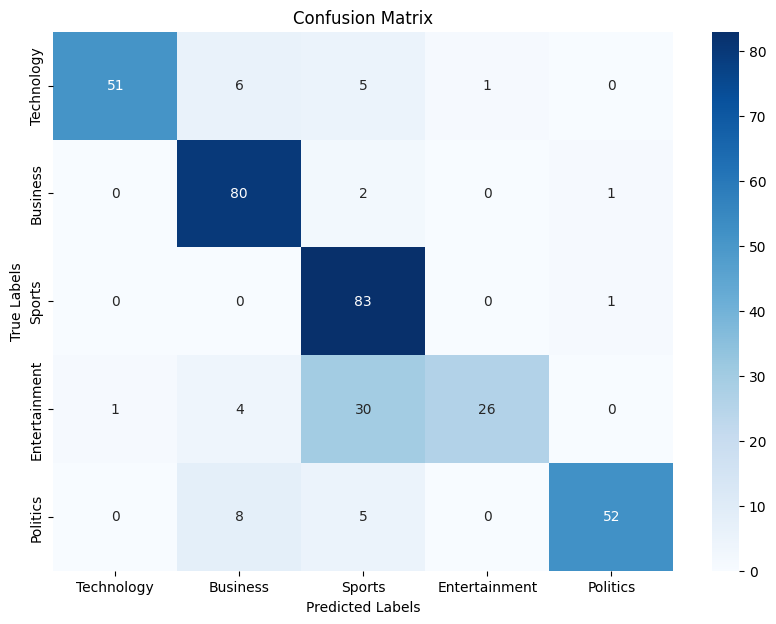

Classification Report:
               precision    recall  f1-score   support

   Technology       0.98      0.81      0.89        63
     Business       0.82      0.96      0.88        83
       Sports       0.66      0.99      0.79        84
Entertainment       0.96      0.43      0.59        61
     Politics       0.96      0.80      0.87        65

     accuracy                           0.82       356
    macro avg       0.88      0.80      0.81       356
 weighted avg       0.86      0.82      0.81       356

Accuracy: 0.8202247191011236
NDCG score with 1st 2 relevant ranks: 0.8609870346408526
==========================End of Folds================================
time taken(mins):  0.20251706043879192
param_dict[best_estimator]:  RandomForestClassifier(max_depth=3, n_estimators=200, oob_score=True)
param_dict[best_val_accuracy]:  0.8292134831460674
param_dict[best_val_ndcg]:  0.8710391634390067
Iteration: 2
RandomForestClassifier(max_depth=5, n_estimators=200, oob_score=True)
===

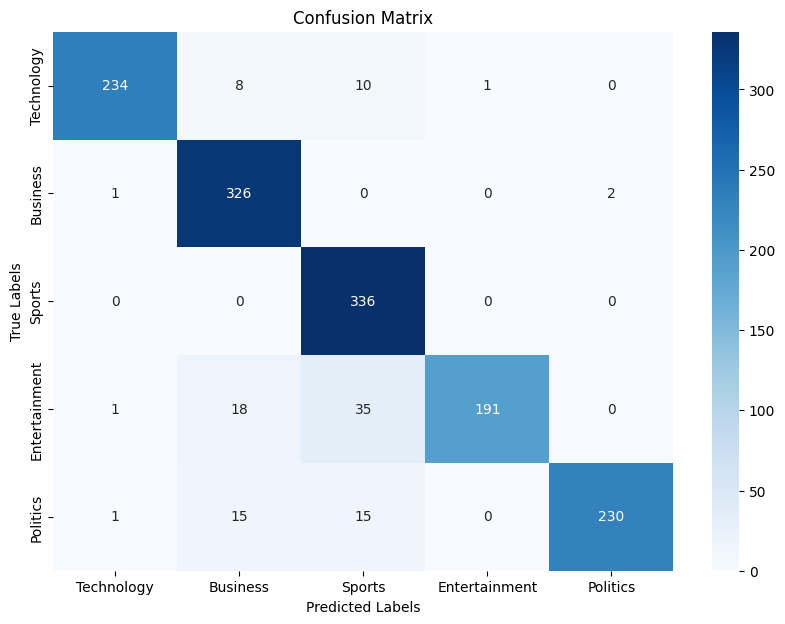

Classification Report:
               precision    recall  f1-score   support

   Technology       0.99      0.92      0.96       253
     Business       0.89      0.99      0.94       329
       Sports       0.85      1.00      0.92       336
Entertainment       0.99      0.78      0.87       245
     Politics       0.99      0.88      0.93       261

     accuracy                           0.92      1424
    macro avg       0.94      0.92      0.92      1424
 weighted avg       0.93      0.92      0.92      1424

Accuracy: 0.9248595505617978
NDCG score with 1st 2 relevant ranks: 0.950114463450543
==========================Val metrics================================


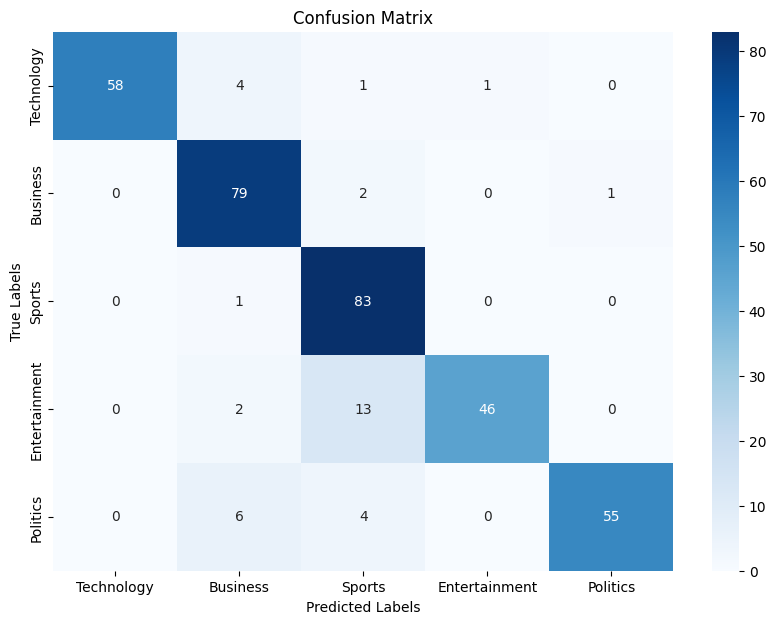

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      0.91      0.95        64
     Business       0.86      0.96      0.91        82
       Sports       0.81      0.99      0.89        84
Entertainment       0.98      0.75      0.85        61
     Politics       0.98      0.85      0.91        65

     accuracy                           0.90       356
    macro avg       0.93      0.89      0.90       356
 weighted avg       0.91      0.90      0.90       356

Accuracy: 0.901685393258427
NDCG score with 1st 2 relevant ranks: 0.9300417866773689
============Fold 2=============
==========================Train metrics================================


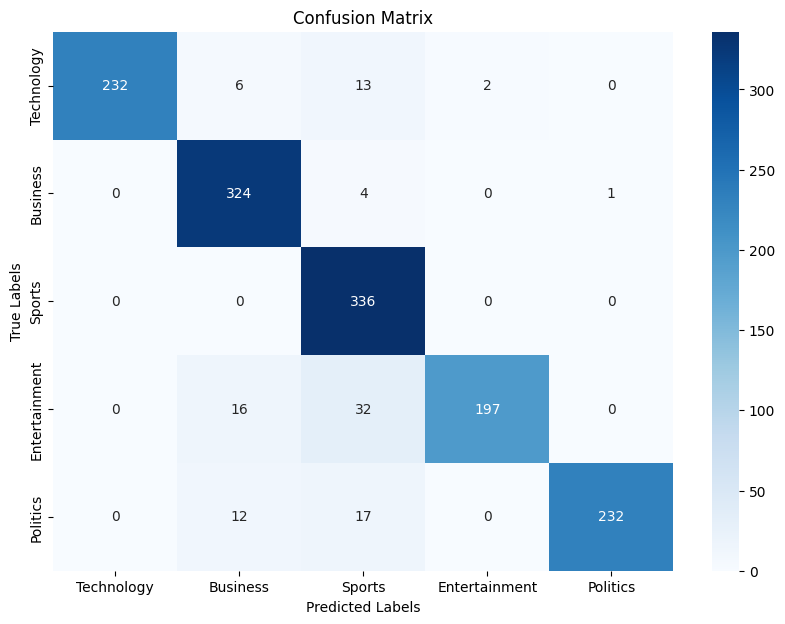

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      0.92      0.96       253
     Business       0.91      0.98      0.94       329
       Sports       0.84      1.00      0.91       336
Entertainment       0.99      0.80      0.89       245
     Politics       1.00      0.89      0.94       261

     accuracy                           0.93      1424
    macro avg       0.95      0.92      0.93      1424
 weighted avg       0.94      0.93      0.93      1424

Accuracy: 0.9276685393258427
NDCG score with 1st 2 relevant ranks: 0.9529234522145877
==========================Val metrics================================


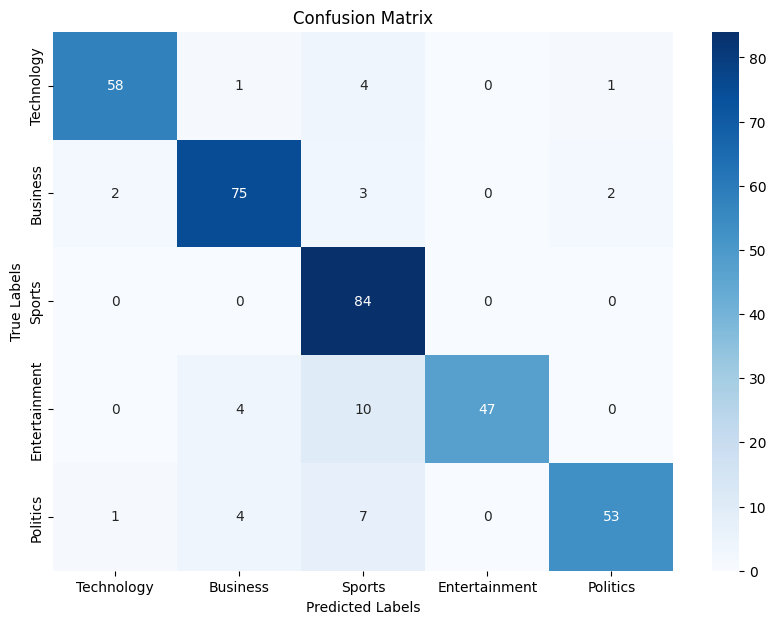

Classification Report:
               precision    recall  f1-score   support

   Technology       0.95      0.91      0.93        64
     Business       0.89      0.91      0.90        82
       Sports       0.78      1.00      0.88        84
Entertainment       1.00      0.77      0.87        61
     Politics       0.95      0.82      0.88        65

     accuracy                           0.89       356
    macro avg       0.91      0.88      0.89       356
 weighted avg       0.90      0.89      0.89       356

Accuracy: 0.8904494382022472
NDCG score with 1st 2 relevant ranks: 0.9312117537419762
============Fold 3=============
==========================Train metrics================================


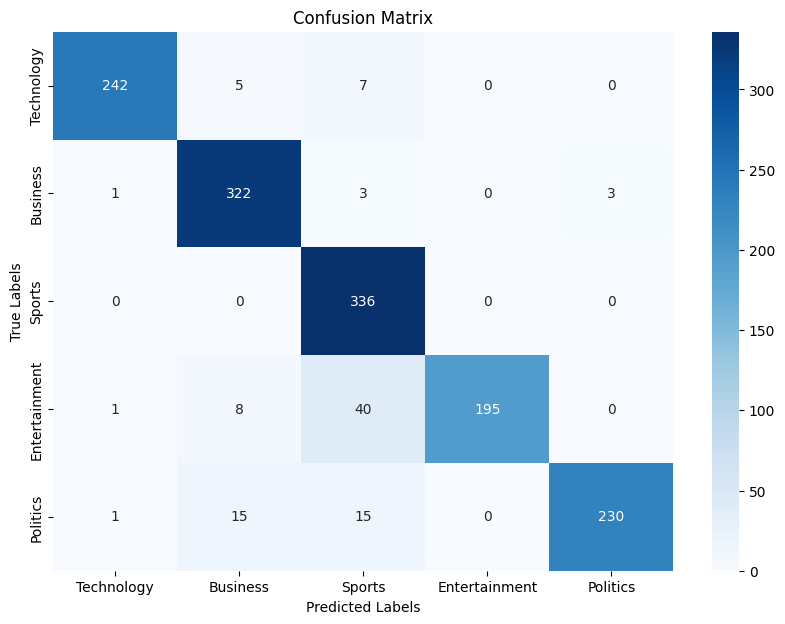

Classification Report:
               precision    recall  f1-score   support

   Technology       0.99      0.95      0.97       254
     Business       0.92      0.98      0.95       329
       Sports       0.84      1.00      0.91       336
Entertainment       1.00      0.80      0.89       244
     Politics       0.99      0.88      0.93       261

     accuracy                           0.93      1424
    macro avg       0.95      0.92      0.93      1424
 weighted avg       0.94      0.93      0.93      1424

Accuracy: 0.9304775280898876
NDCG score with 1st 2 relevant ranks: 0.9641507452748812
==========================Val metrics================================


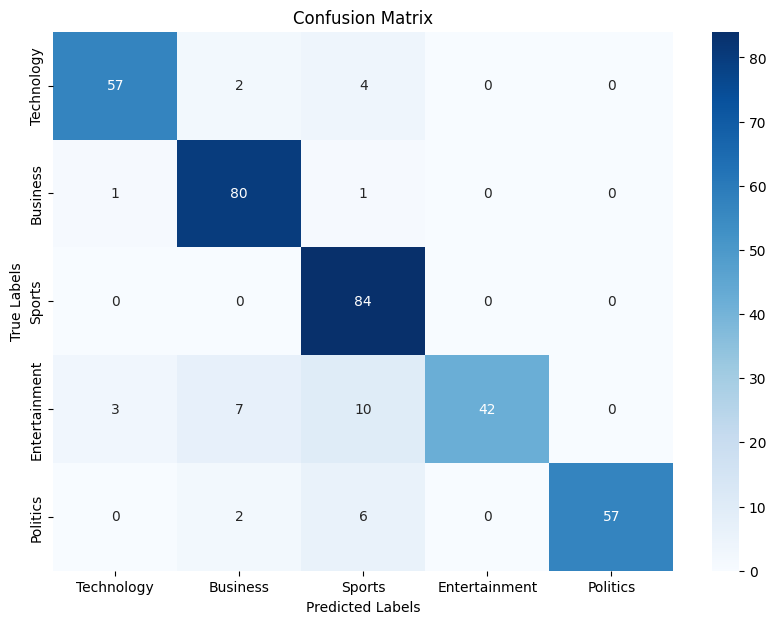

Classification Report:
               precision    recall  f1-score   support

   Technology       0.93      0.90      0.92        63
     Business       0.88      0.98      0.92        82
       Sports       0.80      1.00      0.89        84
Entertainment       1.00      0.68      0.81        62
     Politics       1.00      0.88      0.93        65

     accuracy                           0.90       356
    macro avg       0.92      0.89      0.90       356
 weighted avg       0.91      0.90      0.90       356

Accuracy: 0.898876404494382
NDCG score with 1st 2 relevant ranks: 0.9343218962680594
============Fold 4=============
==========================Train metrics================================


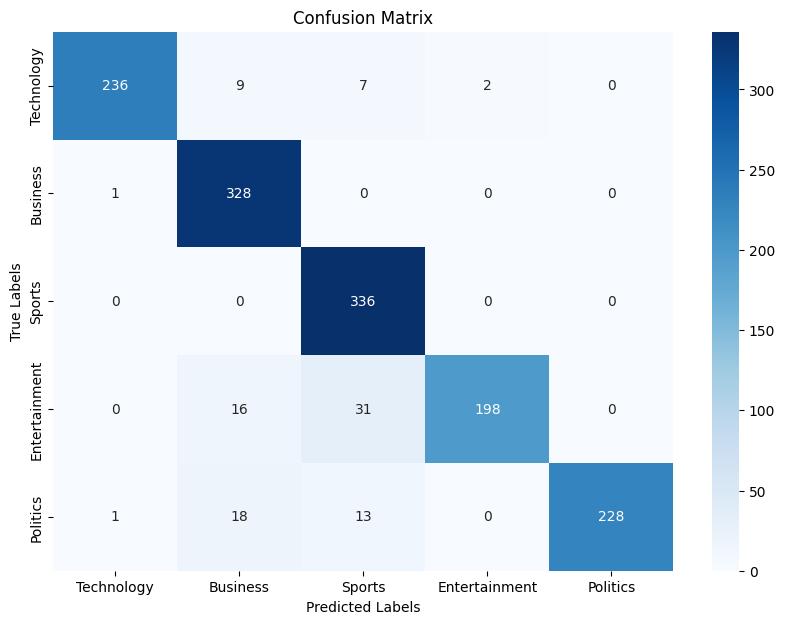

Classification Report:
               precision    recall  f1-score   support

   Technology       0.99      0.93      0.96       254
     Business       0.88      1.00      0.94       329
       Sports       0.87      1.00      0.93       336
Entertainment       0.99      0.81      0.89       245
     Politics       1.00      0.88      0.93       260

     accuracy                           0.93      1424
    macro avg       0.95      0.92      0.93      1424
 weighted avg       0.94      0.93      0.93      1424

Accuracy: 0.9311797752808989
NDCG score with 1st 2 relevant ranks: 0.9511178644035925
==========================Val metrics================================


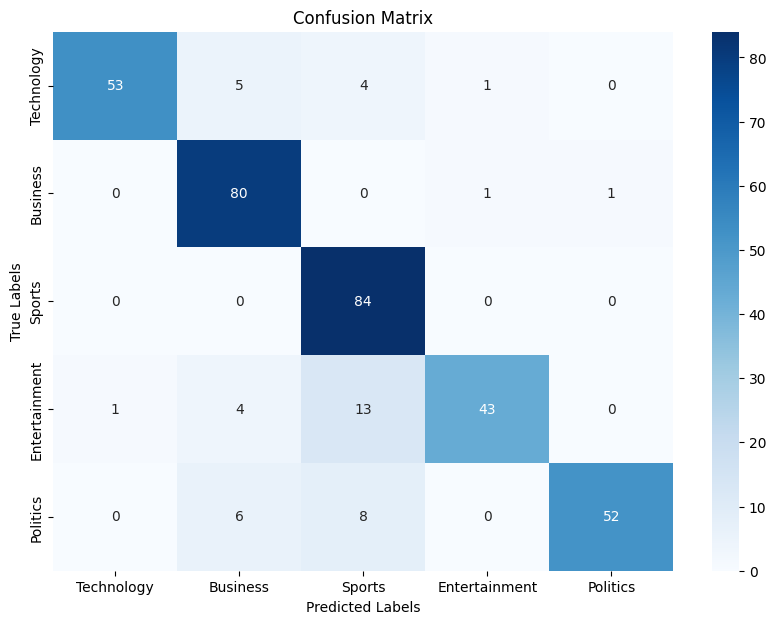

Classification Report:
               precision    recall  f1-score   support

   Technology       0.98      0.84      0.91        63
     Business       0.84      0.98      0.90        82
       Sports       0.77      1.00      0.87        84
Entertainment       0.96      0.70      0.81        61
     Politics       0.98      0.79      0.87        66

     accuracy                           0.88       356
    macro avg       0.91      0.86      0.87       356
 weighted avg       0.90      0.88      0.87       356

Accuracy: 0.8764044943820225
NDCG score with 1st 2 relevant ranks: 0.910077711567016
============Fold 5=============
==========================Train metrics================================


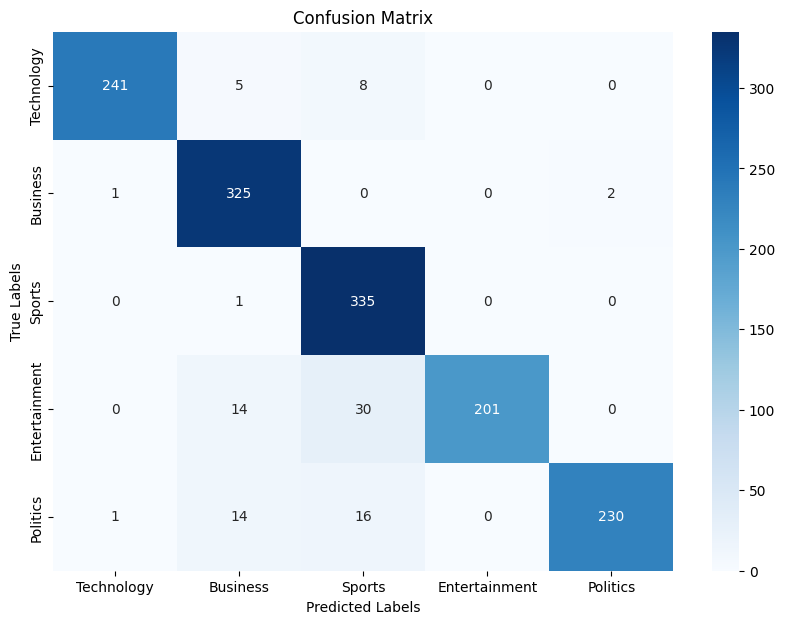

Classification Report:
               precision    recall  f1-score   support

   Technology       0.99      0.95      0.97       254
     Business       0.91      0.99      0.95       328
       Sports       0.86      1.00      0.92       336
Entertainment       1.00      0.82      0.90       245
     Politics       0.99      0.88      0.93       261

     accuracy                           0.94      1424
    macro avg       0.95      0.93      0.93      1424
 weighted avg       0.94      0.94      0.94      1424

Accuracy: 0.9353932584269663
NDCG score with 1st 2 relevant ranks: 0.9557744161968308
==========================Val metrics================================


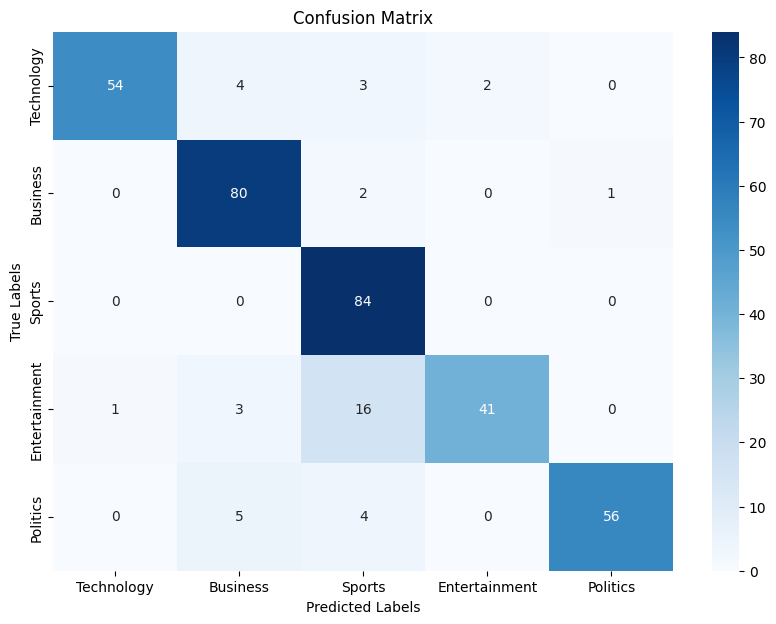

Classification Report:
               precision    recall  f1-score   support

   Technology       0.98      0.86      0.92        63
     Business       0.87      0.96      0.91        83
       Sports       0.77      1.00      0.87        84
Entertainment       0.95      0.67      0.79        61
     Politics       0.98      0.86      0.92        65

     accuracy                           0.88       356
    macro avg       0.91      0.87      0.88       356
 weighted avg       0.90      0.88      0.88       356

Accuracy: 0.8848314606741573
NDCG score with 1st 2 relevant ranks: 0.9344551491573058
==========================End of Folds================================
time taken(mins):  0.22779843012491863
param_dict[best_estimator]:  RandomForestClassifier(max_depth=5, n_estimators=200, oob_score=True)
param_dict[best_val_accuracy]:  0.8904494382022472
param_dict[best_val_ndcg]:  0.9280216594823452
Iteration: 3
XGBClassifier(base_score=None, booster=None, callbacks=None,
            

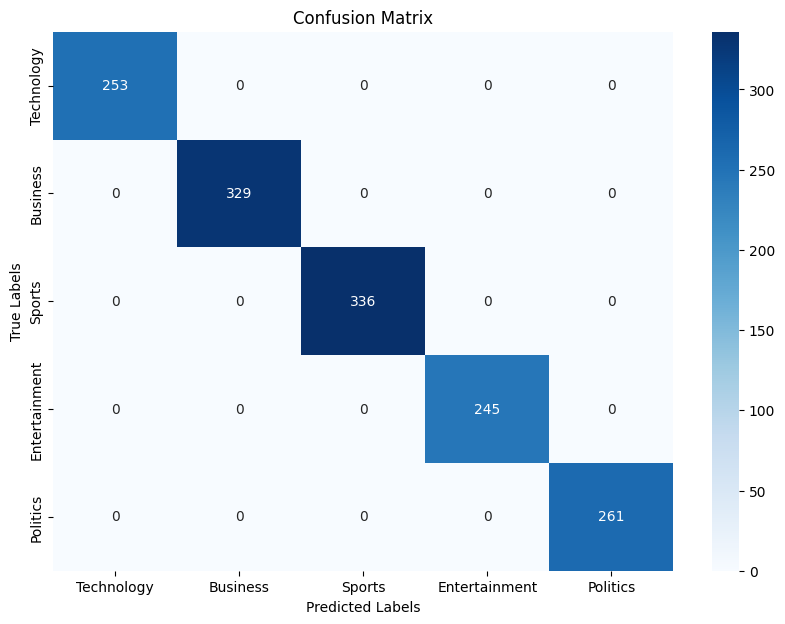

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       253
     Business       1.00      1.00      1.00       329
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       245
     Politics       1.00      1.00      1.00       261

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


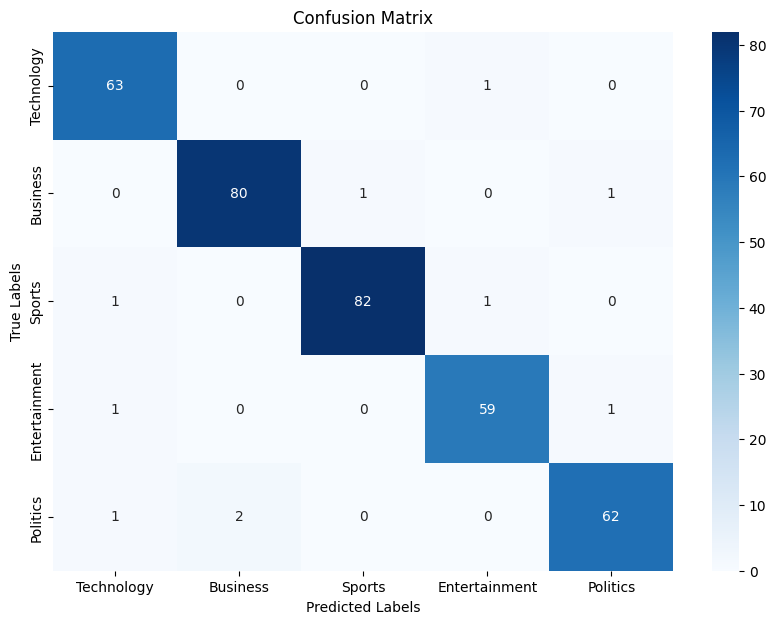

Classification Report:
               precision    recall  f1-score   support

   Technology       0.95      0.98      0.97        64
     Business       0.98      0.98      0.98        82
       Sports       0.99      0.98      0.98        84
Entertainment       0.97      0.97      0.97        61
     Politics       0.97      0.95      0.96        65

     accuracy                           0.97       356
    macro avg       0.97      0.97      0.97       356
 weighted avg       0.97      0.97      0.97       356

Accuracy: 0.9719101123595506
NDCG score with 1st 2 relevant ranks: 0.9825437598916538
============Fold 2=============
==========================Train metrics================================


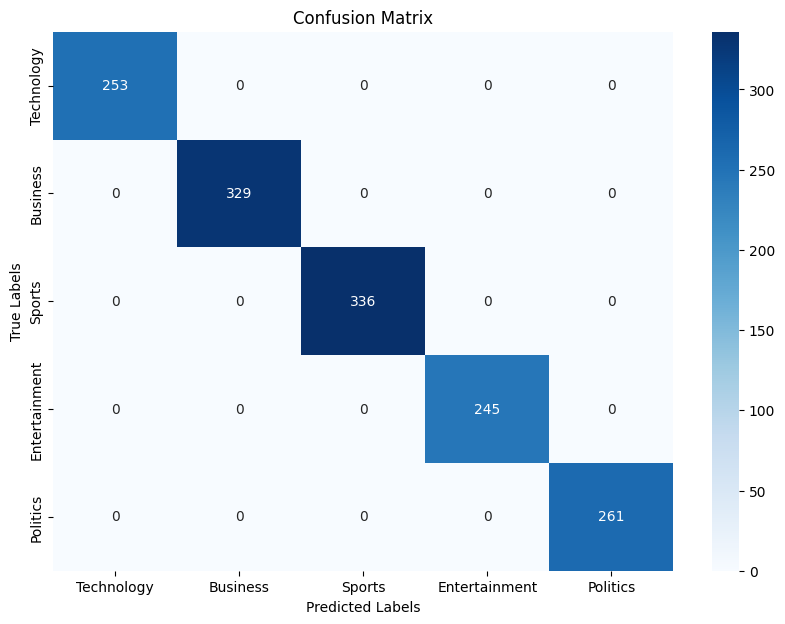

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       253
     Business       1.00      1.00      1.00       329
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       245
     Politics       1.00      1.00      1.00       261

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


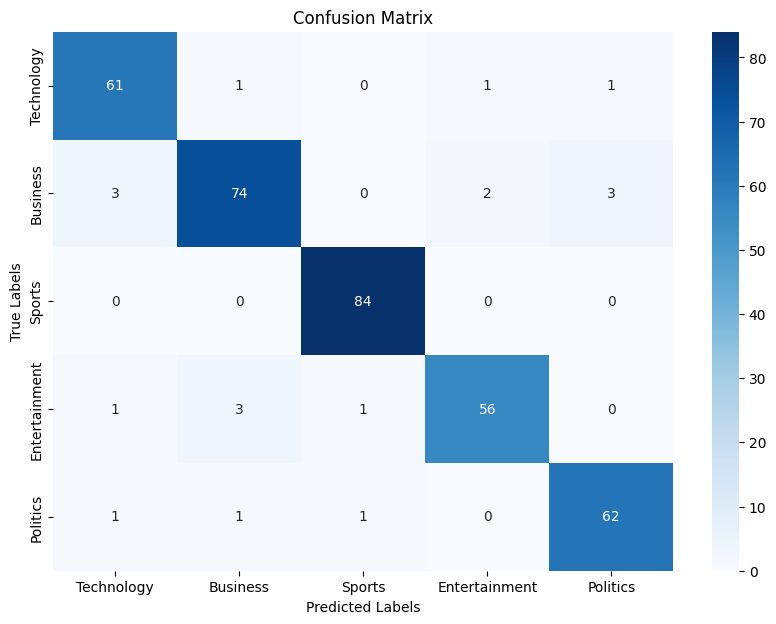

Classification Report:
               precision    recall  f1-score   support

   Technology       0.92      0.95      0.94        64
     Business       0.94      0.90      0.92        82
       Sports       0.98      1.00      0.99        84
Entertainment       0.95      0.92      0.93        61
     Politics       0.94      0.95      0.95        65

     accuracy                           0.95       356
    macro avg       0.95      0.95      0.95       356
 weighted avg       0.95      0.95      0.95       356

Accuracy: 0.9466292134831461
NDCG score with 1st 2 relevant ranks: 0.974985606902088
============Fold 3=============
==========================Train metrics================================


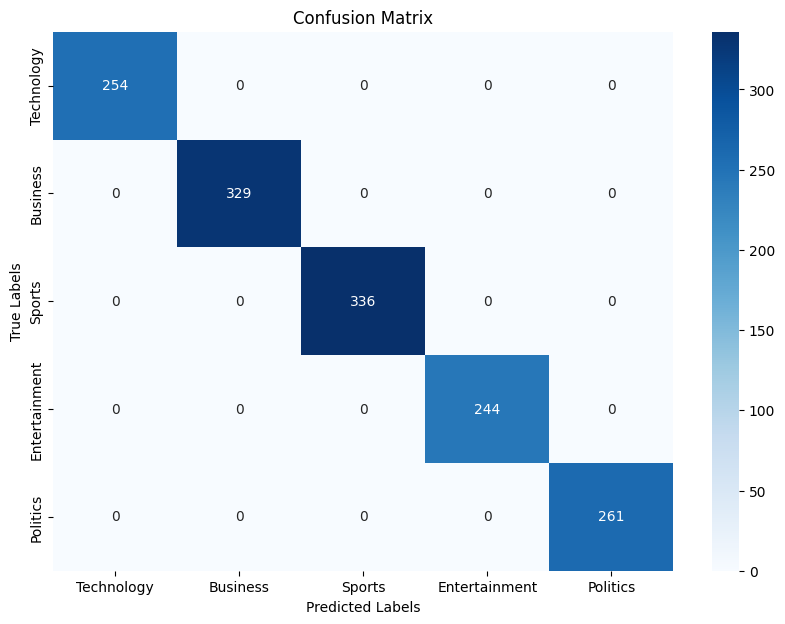

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       254
     Business       1.00      1.00      1.00       329
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       244
     Politics       1.00      1.00      1.00       261

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


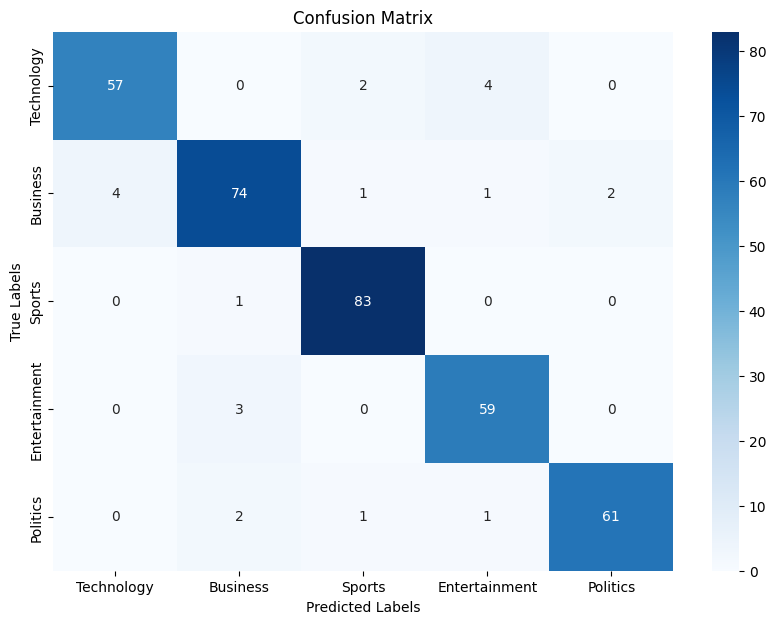

Classification Report:
               precision    recall  f1-score   support

   Technology       0.93      0.90      0.92        63
     Business       0.93      0.90      0.91        82
       Sports       0.95      0.99      0.97        84
Entertainment       0.91      0.95      0.93        62
     Politics       0.97      0.94      0.95        65

     accuracy                           0.94       356
    macro avg       0.94      0.94      0.94       356
 weighted avg       0.94      0.94      0.94       356

Accuracy: 0.9382022471910112
NDCG score with 1st 2 relevant ranks: 0.970103189787321
============Fold 4=============
==========================Train metrics================================


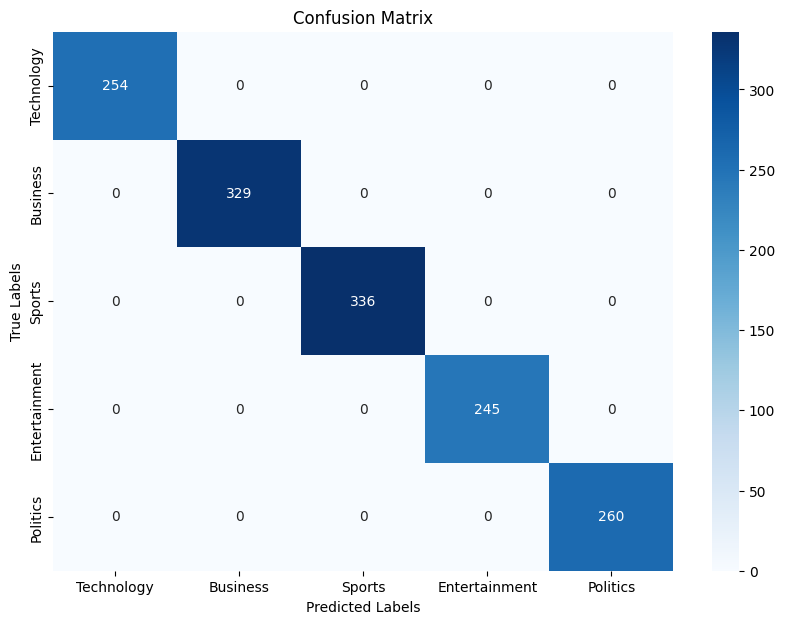

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       254
     Business       1.00      1.00      1.00       329
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       245
     Politics       1.00      1.00      1.00       260

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


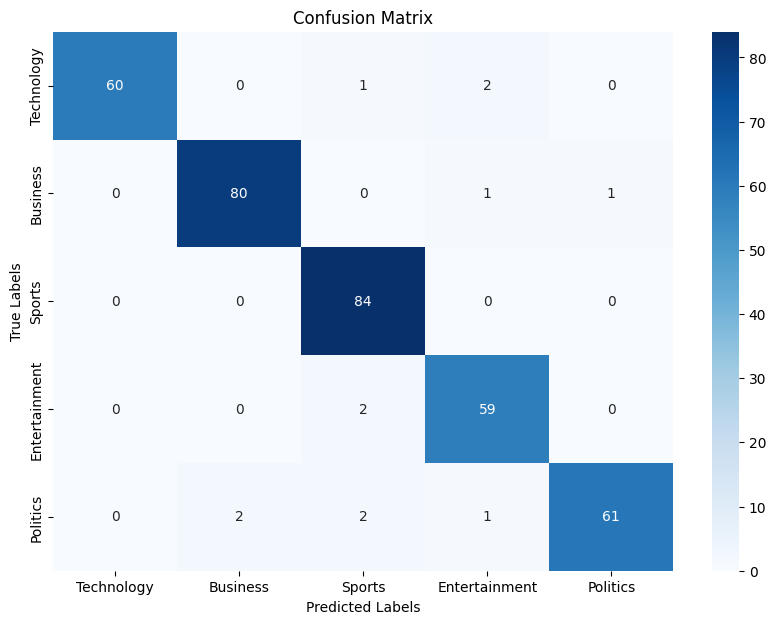

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      0.95      0.98        63
     Business       0.98      0.98      0.98        82
       Sports       0.94      1.00      0.97        84
Entertainment       0.94      0.97      0.95        61
     Politics       0.98      0.92      0.95        66

     accuracy                           0.97       356
    macro avg       0.97      0.96      0.97       356
 weighted avg       0.97      0.97      0.97       356

Accuracy: 0.9662921348314607
NDCG score with 1st 2 relevant ranks: 0.9840148807182993
============Fold 5=============
==========================Train metrics================================


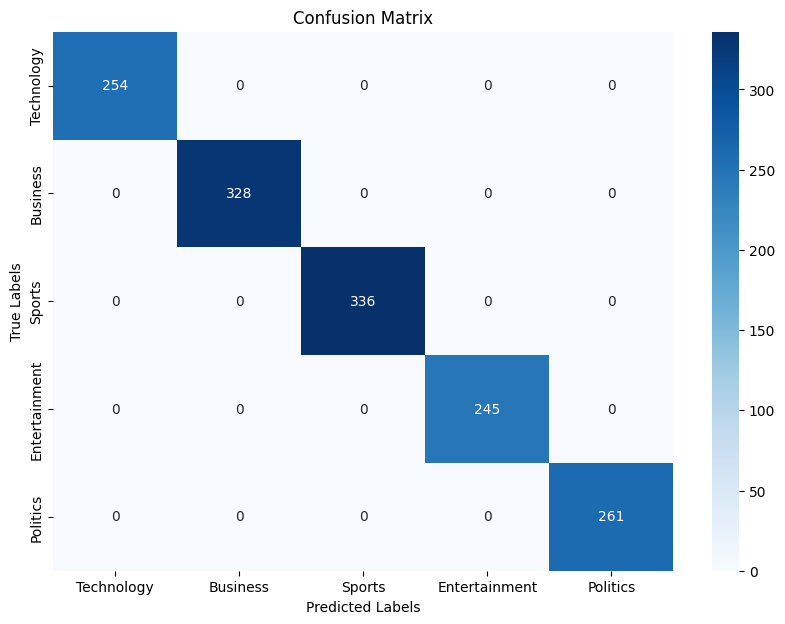

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       254
     Business       1.00      1.00      1.00       328
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       245
     Politics       1.00      1.00      1.00       261

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


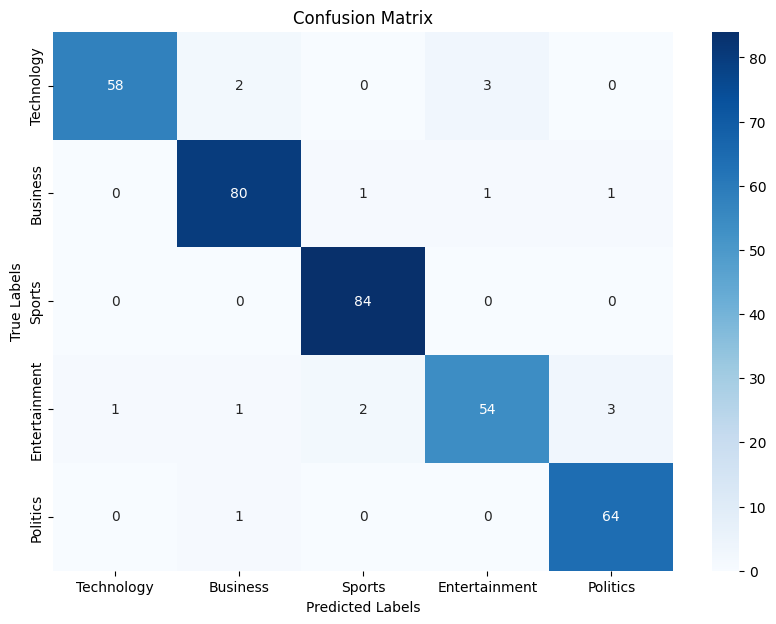

Classification Report:
               precision    recall  f1-score   support

   Technology       0.98      0.92      0.95        63
     Business       0.95      0.96      0.96        83
       Sports       0.97      1.00      0.98        84
Entertainment       0.93      0.89      0.91        61
     Politics       0.94      0.98      0.96        65

     accuracy                           0.96       356
    macro avg       0.95      0.95      0.95       356
 weighted avg       0.96      0.96      0.95       356

Accuracy: 0.9550561797752809
NDCG score with 1st 2 relevant ranks: 0.9798680240168551
==========================End of Folds================================
time taken(mins):  1.7244734485944113
param_dict[best_estimator]:  XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1.0,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='mlogloss', gamma=0,

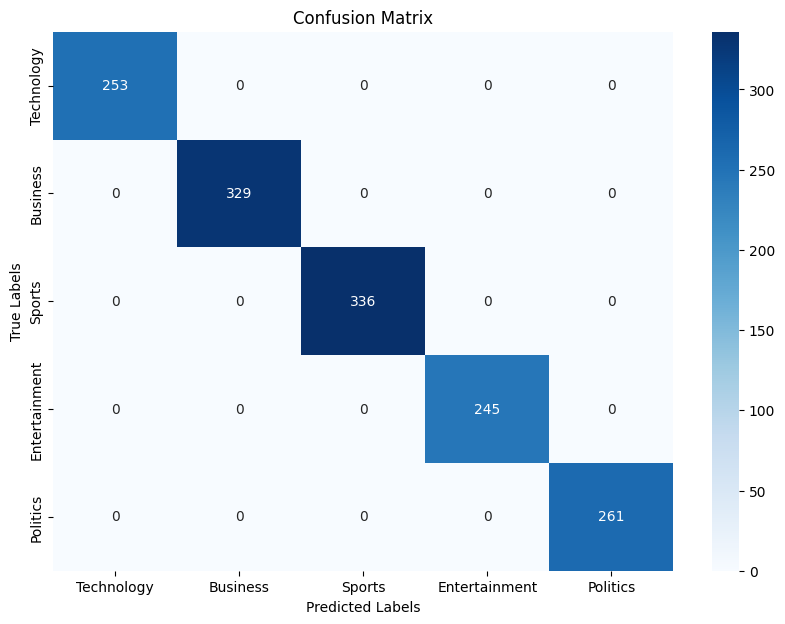

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       253
     Business       1.00      1.00      1.00       329
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       245
     Politics       1.00      1.00      1.00       261

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


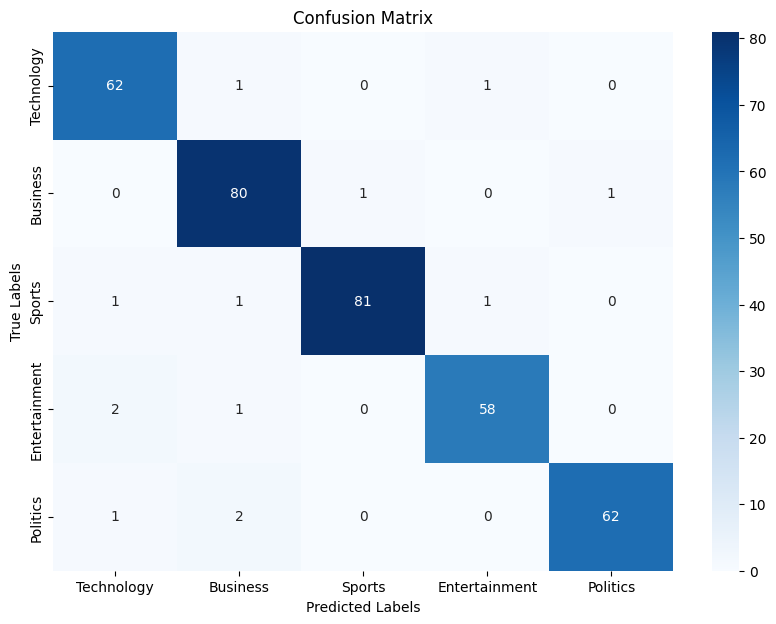

Classification Report:
               precision    recall  f1-score   support

   Technology       0.94      0.97      0.95        64
     Business       0.94      0.98      0.96        82
       Sports       0.99      0.96      0.98        84
Entertainment       0.97      0.95      0.96        61
     Politics       0.98      0.95      0.97        65

     accuracy                           0.96       356
    macro avg       0.96      0.96      0.96       356
 weighted avg       0.96      0.96      0.96       356

Accuracy: 0.9634831460674157
NDCG score with 1st 2 relevant ranks: 0.9829781665429381
============Fold 2=============
==========================Train metrics================================


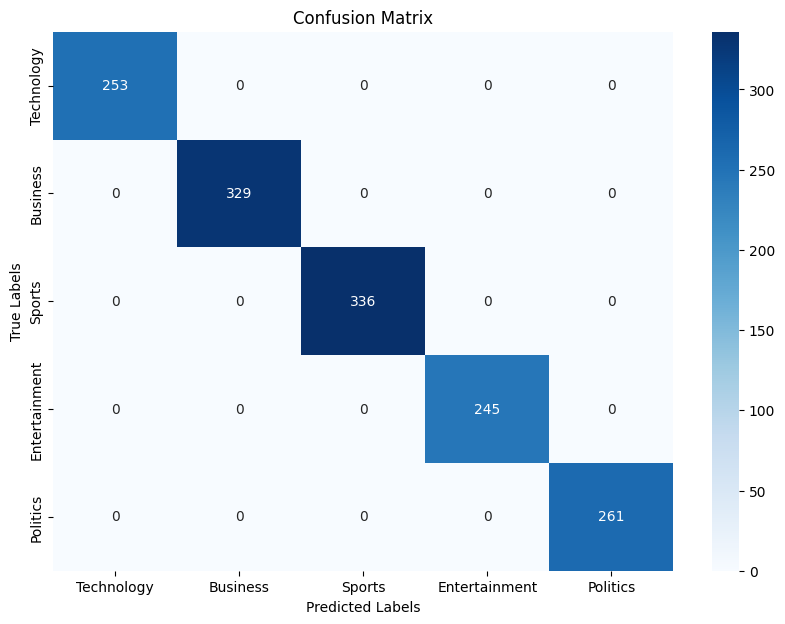

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       253
     Business       1.00      1.00      1.00       329
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       245
     Politics       1.00      1.00      1.00       261

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


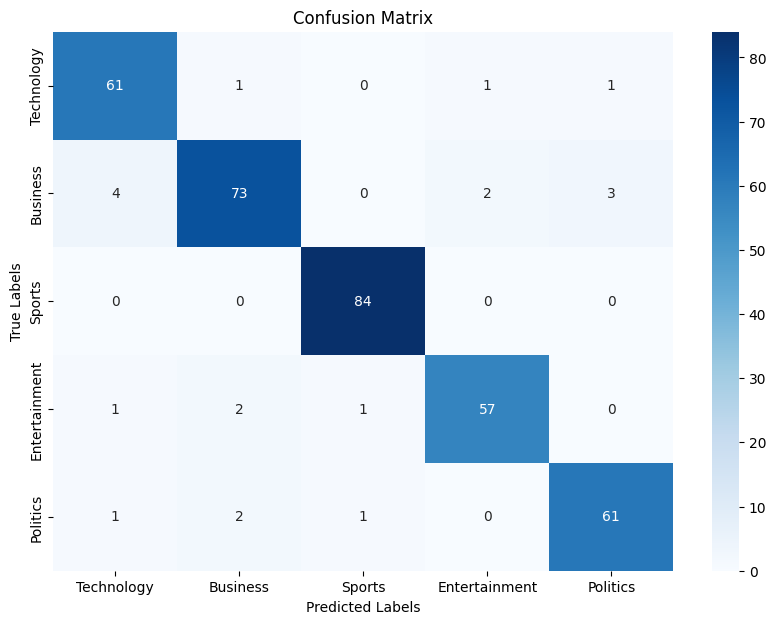

Classification Report:
               precision    recall  f1-score   support

   Technology       0.91      0.95      0.93        64
     Business       0.94      0.89      0.91        82
       Sports       0.98      1.00      0.99        84
Entertainment       0.95      0.93      0.94        61
     Politics       0.94      0.94      0.94        65

     accuracy                           0.94       356
    macro avg       0.94      0.94      0.94       356
 weighted avg       0.94      0.94      0.94       356

Accuracy: 0.9438202247191011
NDCG score with 1st 2 relevant ranks: 0.972176618138043
============Fold 3=============
==========================Train metrics================================


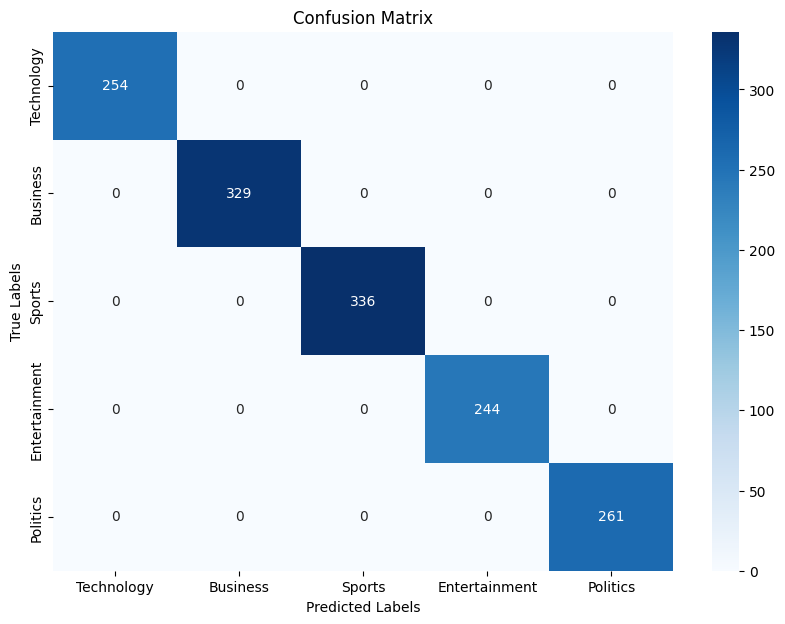

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       254
     Business       1.00      1.00      1.00       329
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       244
     Politics       1.00      1.00      1.00       261

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


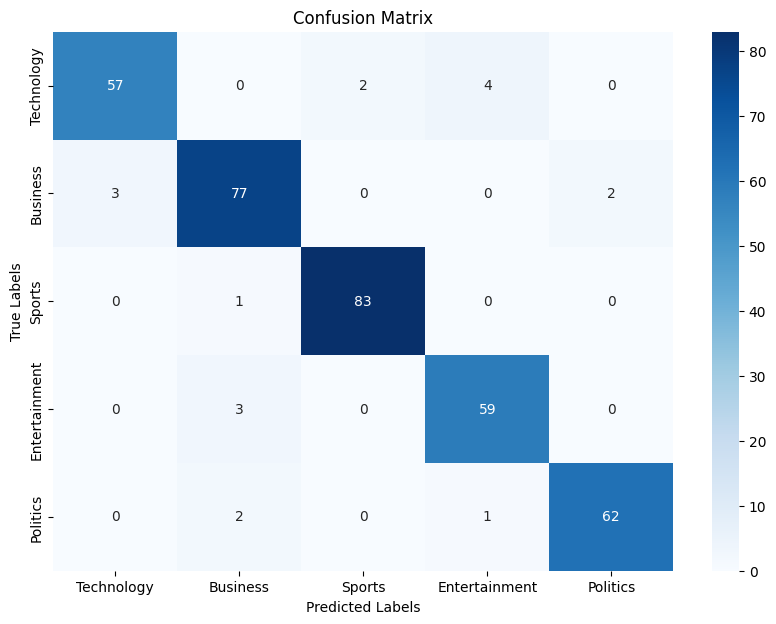

Classification Report:
               precision    recall  f1-score   support

   Technology       0.95      0.90      0.93        63
     Business       0.93      0.94      0.93        82
       Sports       0.98      0.99      0.98        84
Entertainment       0.92      0.95      0.94        62
     Politics       0.97      0.95      0.96        65

     accuracy                           0.95       356
    macro avg       0.95      0.95      0.95       356
 weighted avg       0.95      0.95      0.95       356

Accuracy: 0.949438202247191
NDCG score with 1st 2 relevant ranks: 0.9742500464887652
============Fold 4=============
==========================Train metrics================================


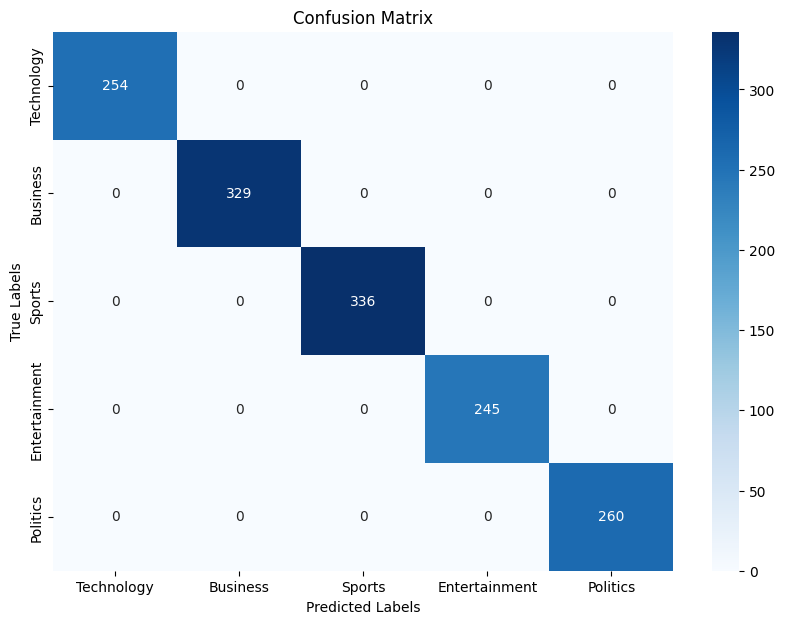

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       254
     Business       1.00      1.00      1.00       329
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       245
     Politics       1.00      1.00      1.00       260

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


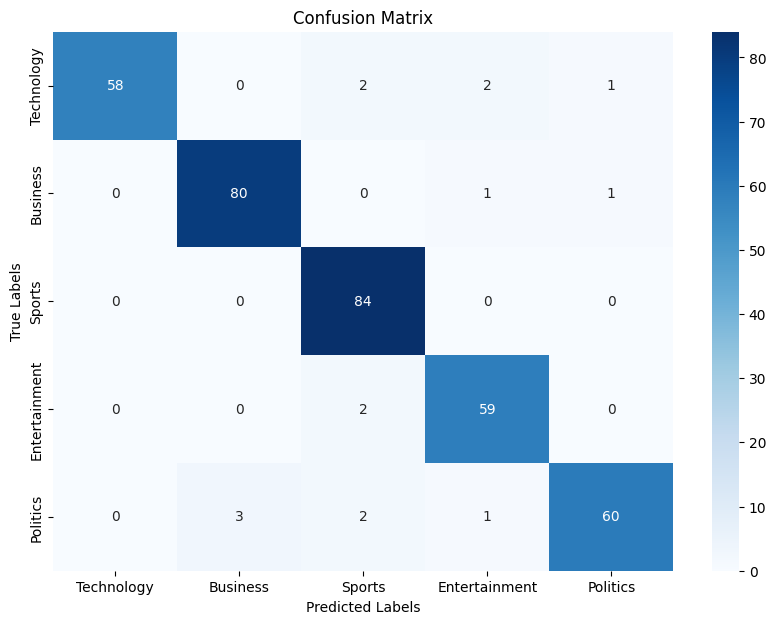

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      0.92      0.96        63
     Business       0.96      0.98      0.97        82
       Sports       0.93      1.00      0.97        84
Entertainment       0.94      0.97      0.95        61
     Politics       0.97      0.91      0.94        66

     accuracy                           0.96       356
    macro avg       0.96      0.95      0.96       356
 weighted avg       0.96      0.96      0.96       356

Accuracy: 0.9578651685393258
NDCG score with 1st 2 relevant ranks: 0.9809047381922161
============Fold 5=============
==========================Train metrics================================


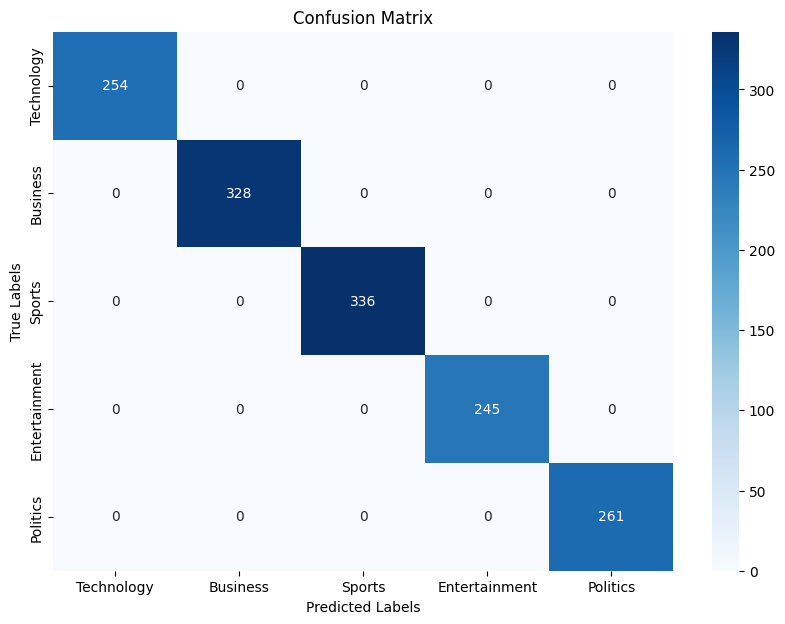

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       254
     Business       1.00      1.00      1.00       328
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       245
     Politics       1.00      1.00      1.00       261

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


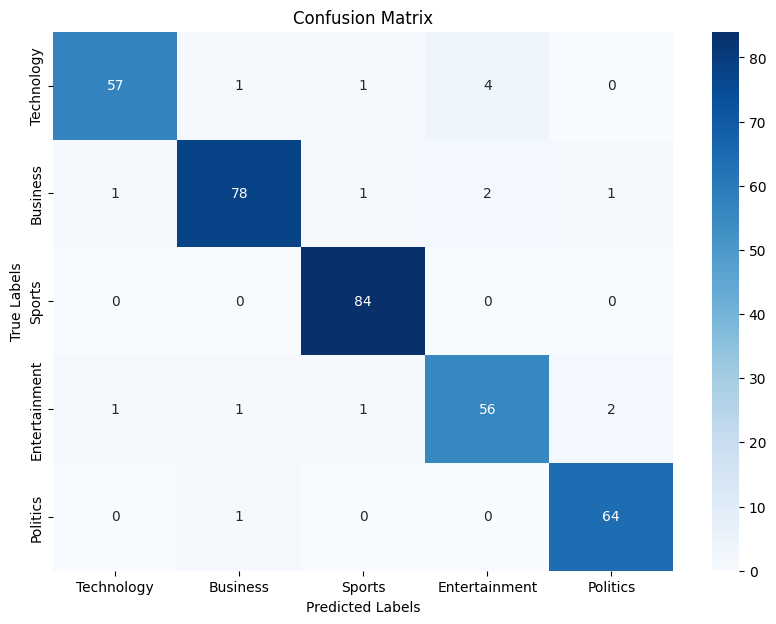

Classification Report:
               precision    recall  f1-score   support

   Technology       0.97      0.90      0.93        63
     Business       0.96      0.94      0.95        83
       Sports       0.97      1.00      0.98        84
Entertainment       0.90      0.92      0.91        61
     Politics       0.96      0.98      0.97        65

     accuracy                           0.95       356
    macro avg       0.95      0.95      0.95       356
 weighted avg       0.95      0.95      0.95       356

Accuracy: 0.952247191011236
NDCG score with 1st 2 relevant ranks: 0.9770590352528101
==========================End of Folds================================
time taken(mins):  1.6394473989804585
param_dict[best_estimator]:  XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1.0,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='mlogloss', gamma=0, 

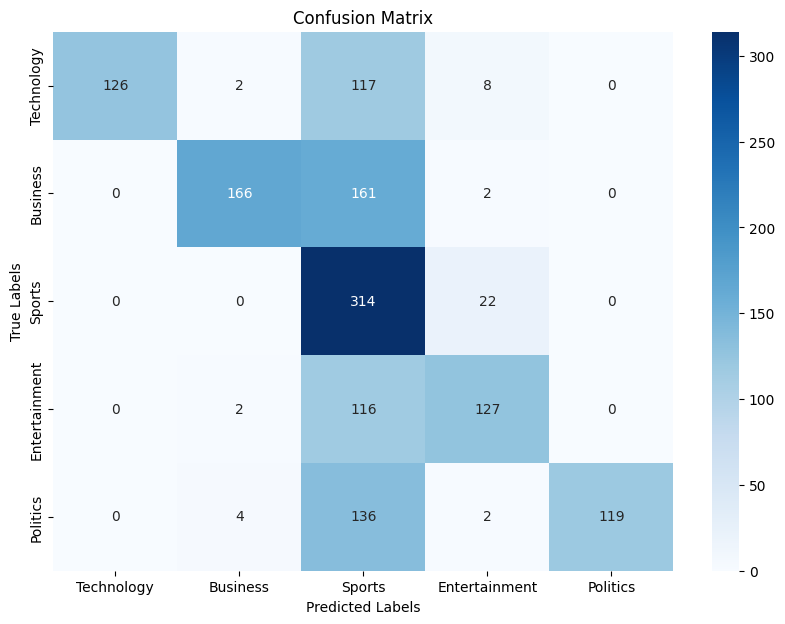

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      0.50      0.66       253
     Business       0.95      0.50      0.66       329
       Sports       0.37      0.93      0.53       336
Entertainment       0.79      0.52      0.63       245
     Politics       1.00      0.46      0.63       261

     accuracy                           0.60      1424
    macro avg       0.82      0.58      0.62      1424
 weighted avg       0.80      0.60      0.62      1424

Accuracy: 0.598314606741573
NDCG score with 1st 2 relevant ranks: 0.6824976497040569
==========================Val metrics================================


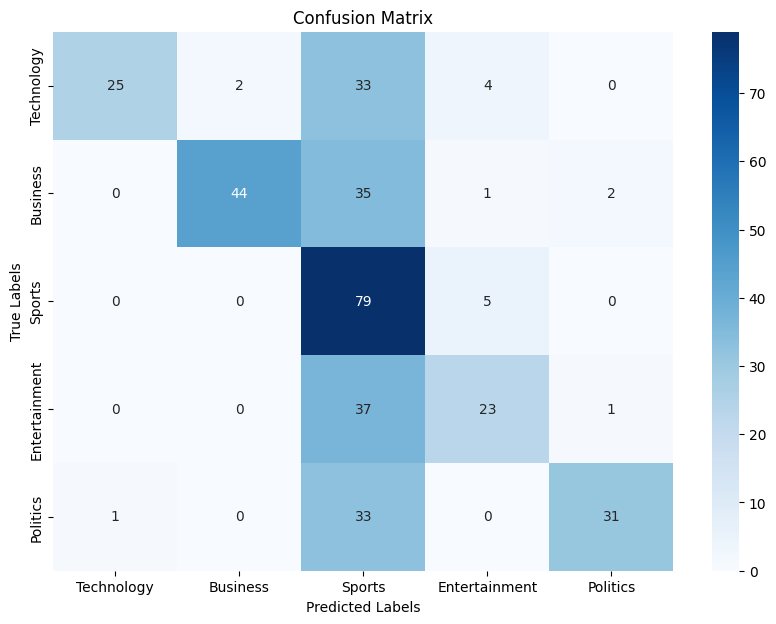

Classification Report:
               precision    recall  f1-score   support

   Technology       0.96      0.39      0.56        64
     Business       0.96      0.54      0.69        82
       Sports       0.36      0.94      0.52        84
Entertainment       0.70      0.38      0.49        61
     Politics       0.91      0.48      0.63        65

     accuracy                           0.57       356
    macro avg       0.78      0.54      0.58       356
 weighted avg       0.76      0.57      0.58       356

Accuracy: 0.5674157303370787
NDCG score with 1st 2 relevant ranks: 0.6418512630618012
============Fold 2=============
==========================Train metrics================================


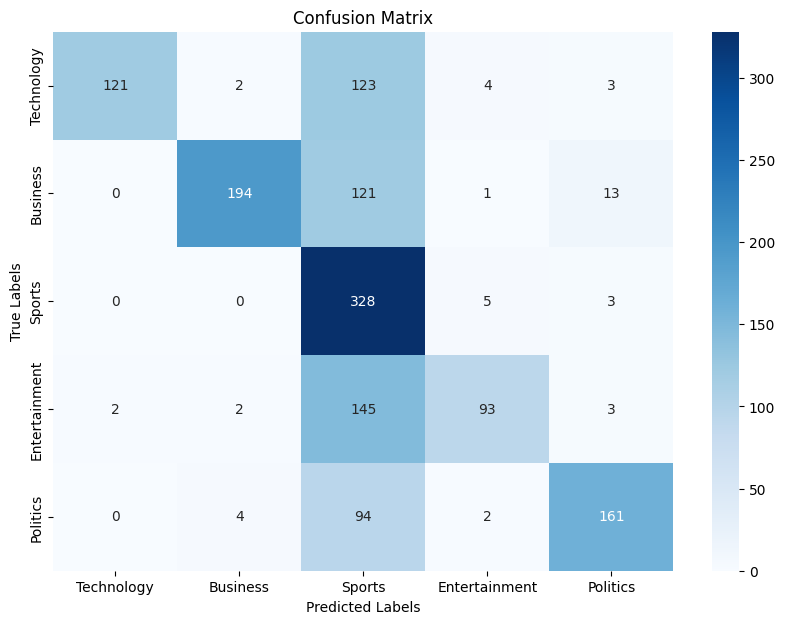

Classification Report:
               precision    recall  f1-score   support

   Technology       0.98      0.48      0.64       253
     Business       0.96      0.59      0.73       329
       Sports       0.40      0.98      0.57       336
Entertainment       0.89      0.38      0.53       245
     Politics       0.88      0.62      0.73       261

     accuracy                           0.63      1424
    macro avg       0.82      0.61      0.64      1424
 weighted avg       0.81      0.63      0.64      1424

Accuracy: 0.6299157303370787
NDCG score with 1st 2 relevant ranks: 0.7052374003561431
==========================Val metrics================================


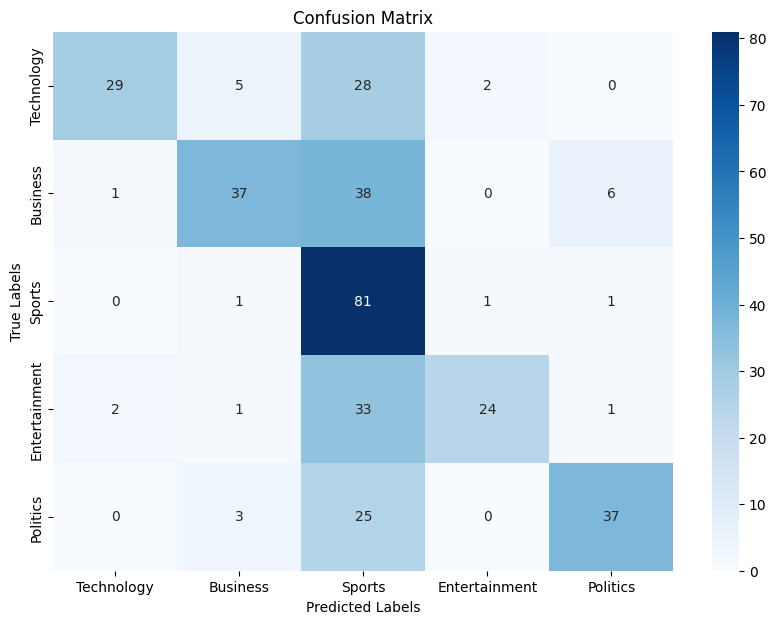

Classification Report:
               precision    recall  f1-score   support

   Technology       0.91      0.45      0.60        64
     Business       0.79      0.45      0.57        82
       Sports       0.40      0.96      0.56        84
Entertainment       0.89      0.39      0.55        61
     Politics       0.82      0.57      0.67        65

     accuracy                           0.58       356
    macro avg       0.76      0.57      0.59       356
 weighted avg       0.74      0.58      0.59       356

Accuracy: 0.5842696629213483
NDCG score with 1st 2 relevant ranks: 0.6640220194121225
============Fold 3=============
==========================Train metrics================================


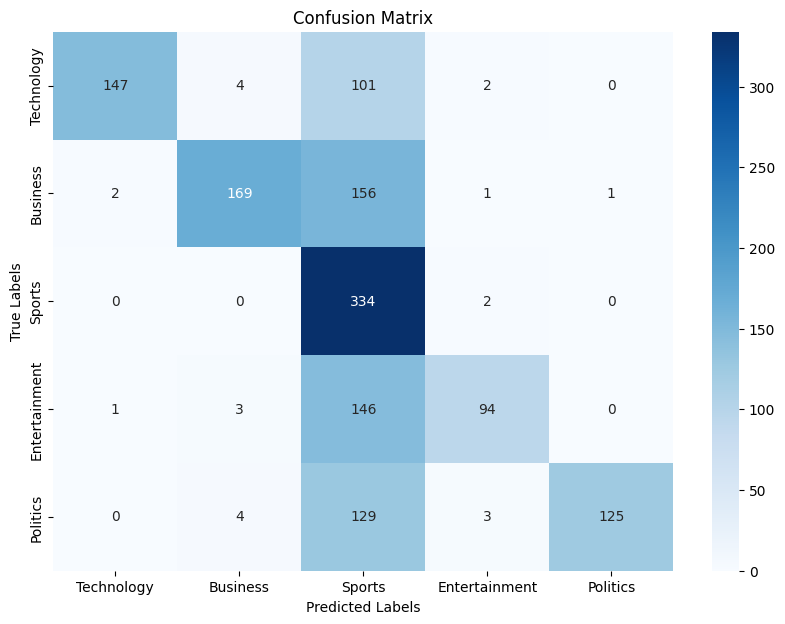

Classification Report:
               precision    recall  f1-score   support

   Technology       0.98      0.58      0.73       254
     Business       0.94      0.51      0.66       329
       Sports       0.39      0.99      0.56       336
Entertainment       0.92      0.39      0.54       244
     Politics       0.99      0.48      0.65       261

     accuracy                           0.61      1424
    macro avg       0.84      0.59      0.63      1424
 weighted avg       0.82      0.61      0.63      1424

Accuracy: 0.610252808988764
NDCG score with 1st 2 relevant ranks: 0.6846883417134866
==========================Val metrics================================


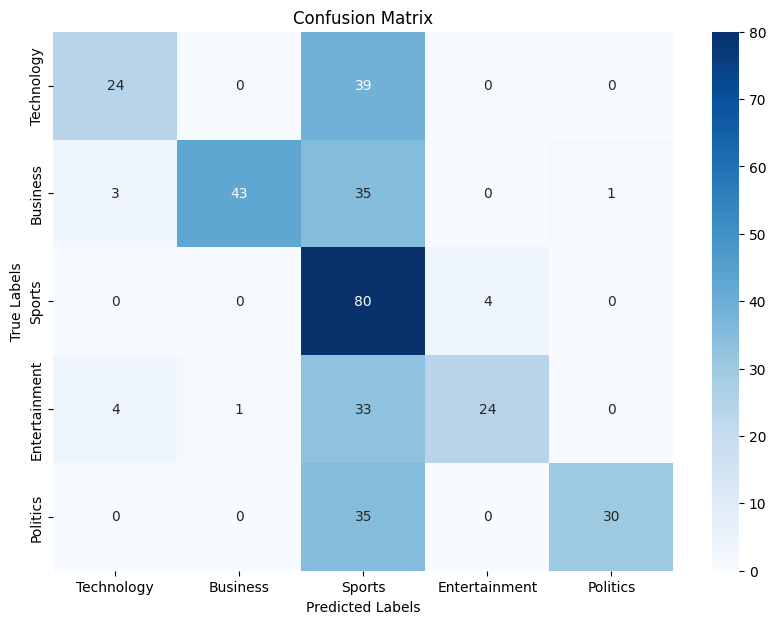

Classification Report:
               precision    recall  f1-score   support

   Technology       0.77      0.38      0.51        63
     Business       0.98      0.52      0.68        82
       Sports       0.36      0.95      0.52        84
Entertainment       0.86      0.39      0.53        62
     Politics       0.97      0.46      0.62        65

     accuracy                           0.56       356
    macro avg       0.79      0.54      0.57       356
 weighted avg       0.77      0.56      0.58       356

Accuracy: 0.5646067415730337
NDCG score with 1st 2 relevant ranks: 0.6337254505317047
============Fold 4=============
==========================Train metrics================================


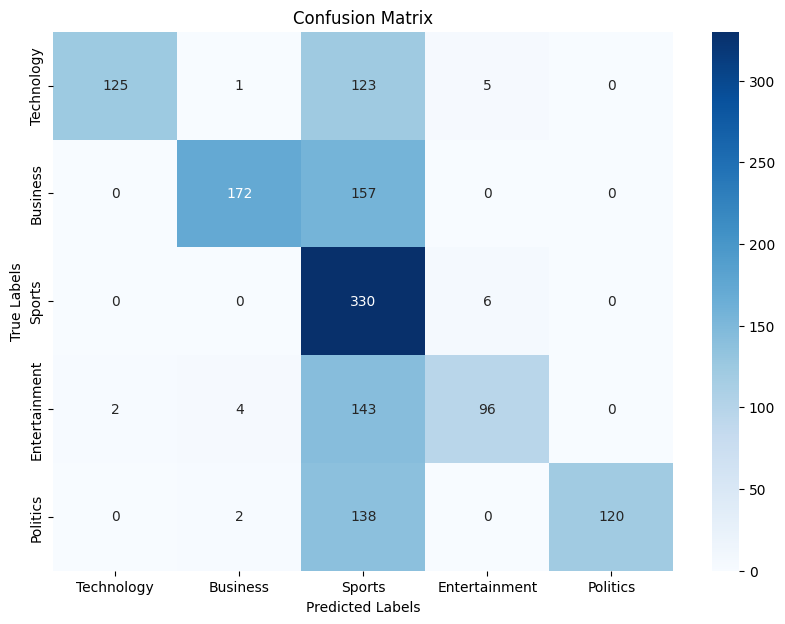

Classification Report:
               precision    recall  f1-score   support

   Technology       0.98      0.49      0.66       254
     Business       0.96      0.52      0.68       329
       Sports       0.37      0.98      0.54       336
Entertainment       0.90      0.39      0.55       245
     Politics       1.00      0.46      0.63       260

     accuracy                           0.59      1424
    macro avg       0.84      0.57      0.61      1424
 weighted avg       0.82      0.59      0.61      1424

Accuracy: 0.5919943820224719
NDCG score with 1st 2 relevant ranks: 0.6682021893358784
==========================Val metrics================================


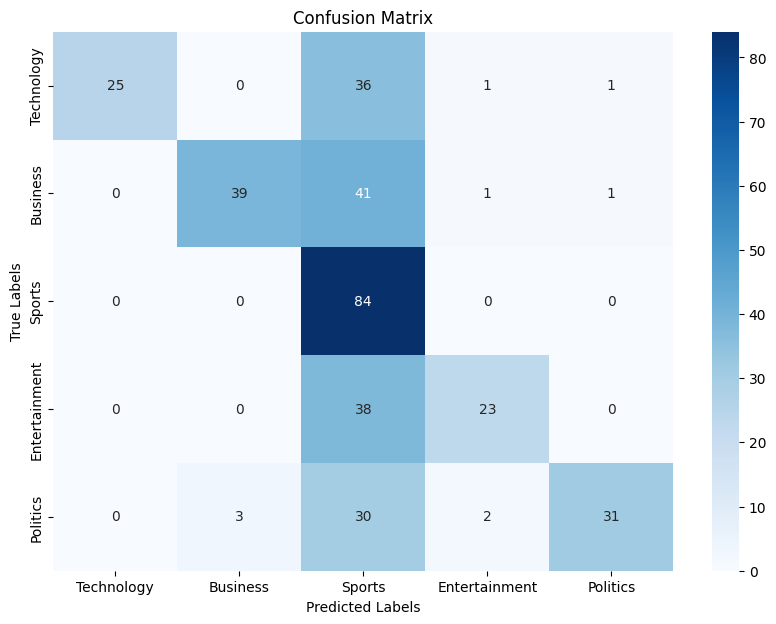

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      0.40      0.57        63
     Business       0.93      0.48      0.63        82
       Sports       0.37      1.00      0.54        84
Entertainment       0.85      0.38      0.52        61
     Politics       0.94      0.47      0.63        66

     accuracy                           0.57       356
    macro avg       0.82      0.54      0.58       356
 weighted avg       0.80      0.57      0.58       356

Accuracy: 0.5674157303370787
NDCG score with 1st 2 relevant ranks: 0.6400789884731174
============Fold 5=============
==========================Train metrics================================


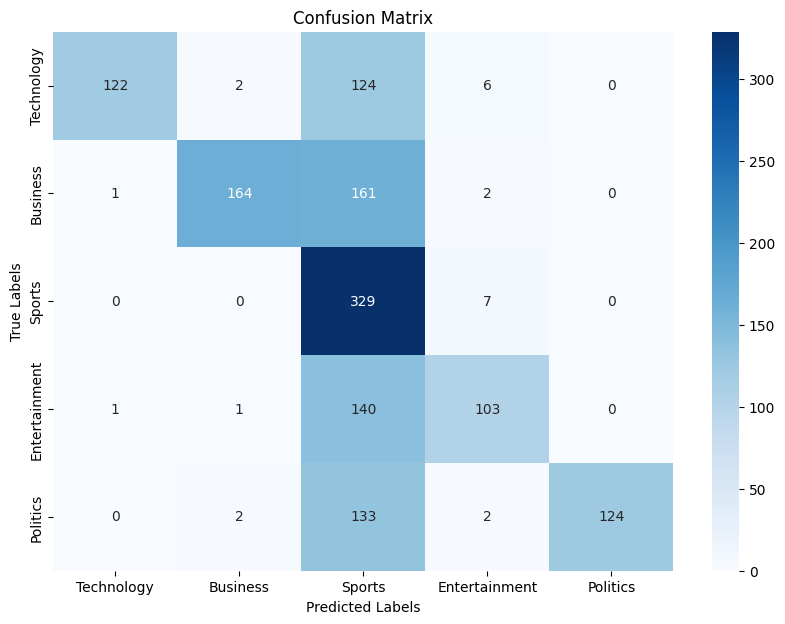

Classification Report:
               precision    recall  f1-score   support

   Technology       0.98      0.48      0.65       254
     Business       0.97      0.50      0.66       328
       Sports       0.37      0.98      0.54       336
Entertainment       0.86      0.42      0.56       245
     Politics       1.00      0.48      0.64       261

     accuracy                           0.59      1424
    macro avg       0.84      0.57      0.61      1424
 weighted avg       0.82      0.59      0.61      1424

Accuracy: 0.5912921348314607
NDCG score with 1st 2 relevant ranks: 0.6674999421448671
==========================Val metrics================================


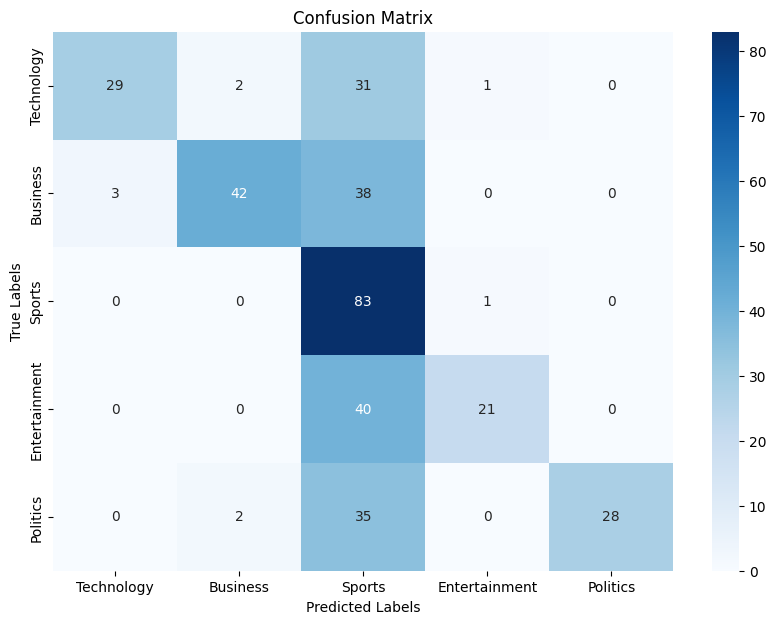

Classification Report:
               precision    recall  f1-score   support

   Technology       0.91      0.46      0.61        63
     Business       0.91      0.51      0.65        83
       Sports       0.37      0.99      0.53        84
Entertainment       0.91      0.34      0.50        61
     Politics       1.00      0.43      0.60        65

     accuracy                           0.57       356
    macro avg       0.82      0.55      0.58       356
 weighted avg       0.80      0.57      0.58       356

Accuracy: 0.5702247191011236
NDCG score with 1st 2 relevant ranks: 0.6428879772371623
==========================End of Folds================================
time taken(mins):  0.06992297172546387
param_dict[best_estimator]:  XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1.0,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='mlogloss', gamma=0

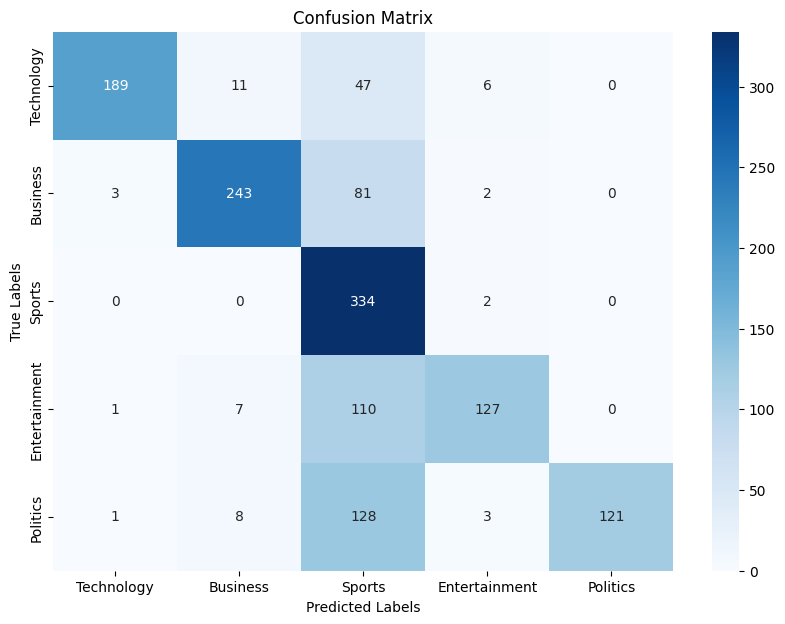

Classification Report:
               precision    recall  f1-score   support

   Technology       0.97      0.75      0.85       253
     Business       0.90      0.74      0.81       329
       Sports       0.48      0.99      0.64       336
Entertainment       0.91      0.52      0.66       245
     Politics       1.00      0.46      0.63       261

     accuracy                           0.71      1424
    macro avg       0.85      0.69      0.72      1424
 weighted avg       0.83      0.71      0.72      1424

Accuracy: 0.7120786516853933
NDCG score with 1st 2 relevant ranks: 0.7803112233497222
==========================Val metrics================================


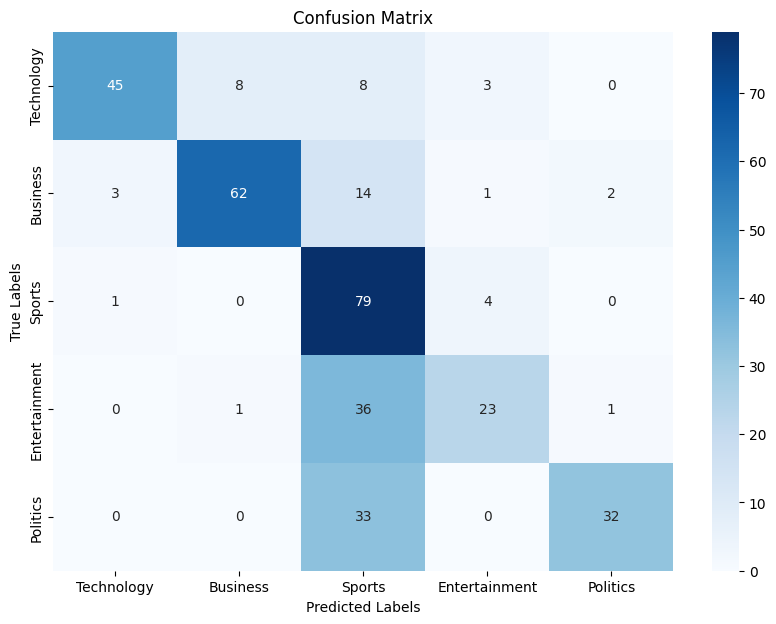

Classification Report:
               precision    recall  f1-score   support

   Technology       0.92      0.70      0.80        64
     Business       0.87      0.76      0.81        82
       Sports       0.46      0.94      0.62        84
Entertainment       0.74      0.38      0.50        61
     Politics       0.91      0.49      0.64        65

     accuracy                           0.68       356
    macro avg       0.78      0.65      0.67       356
 weighted avg       0.77      0.68      0.68       356

Accuracy: 0.6769662921348315
NDCG score with 1st 2 relevant ranks: 0.7567186486256056
============Fold 2=============
==========================Train metrics================================


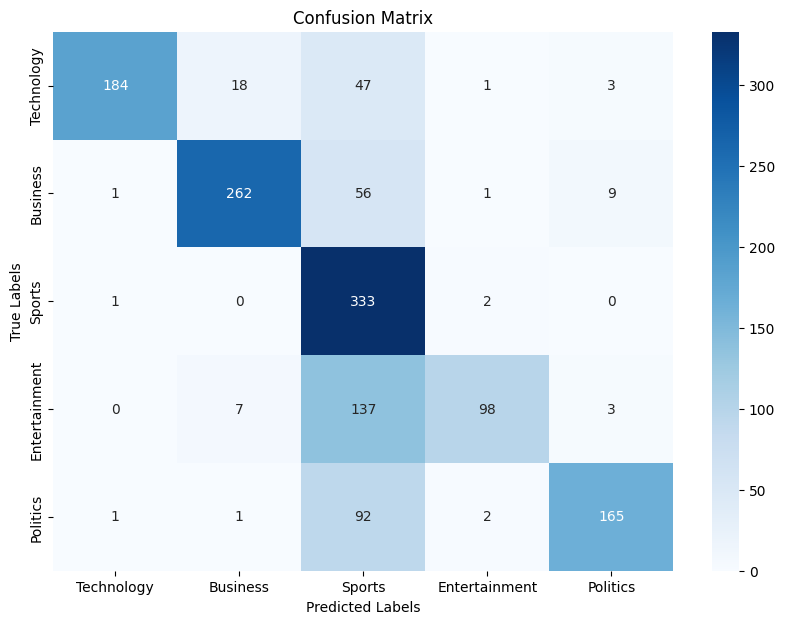

Classification Report:
               precision    recall  f1-score   support

   Technology       0.98      0.73      0.84       253
     Business       0.91      0.80      0.85       329
       Sports       0.50      0.99      0.67       336
Entertainment       0.94      0.40      0.56       245
     Politics       0.92      0.63      0.75       261

     accuracy                           0.73      1424
    macro avg       0.85      0.71      0.73      1424
 weighted avg       0.83      0.73      0.74      1424

Accuracy: 0.7317415730337079
NDCG score with 1st 2 relevant ranks: 0.8061771057584304
==========================Val metrics================================


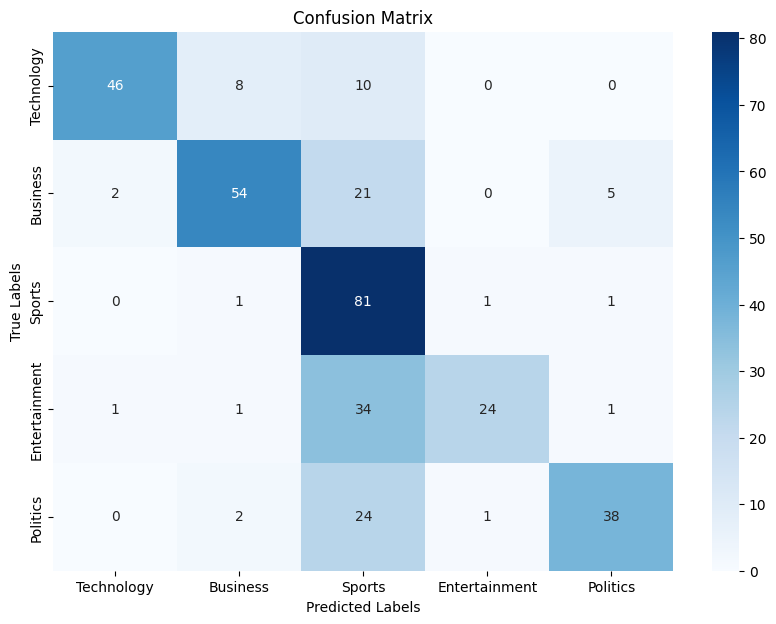

Classification Report:
               precision    recall  f1-score   support

   Technology       0.94      0.72      0.81        64
     Business       0.82      0.66      0.73        82
       Sports       0.48      0.96      0.64        84
Entertainment       0.92      0.39      0.55        61
     Politics       0.84      0.58      0.69        65

     accuracy                           0.68       356
    macro avg       0.80      0.66      0.68       356
 weighted avg       0.78      0.68      0.69       356

Accuracy: 0.6825842696629213
NDCG score with 1st 2 relevant ranks: 0.7658811753310634
============Fold 3=============
==========================Train metrics================================


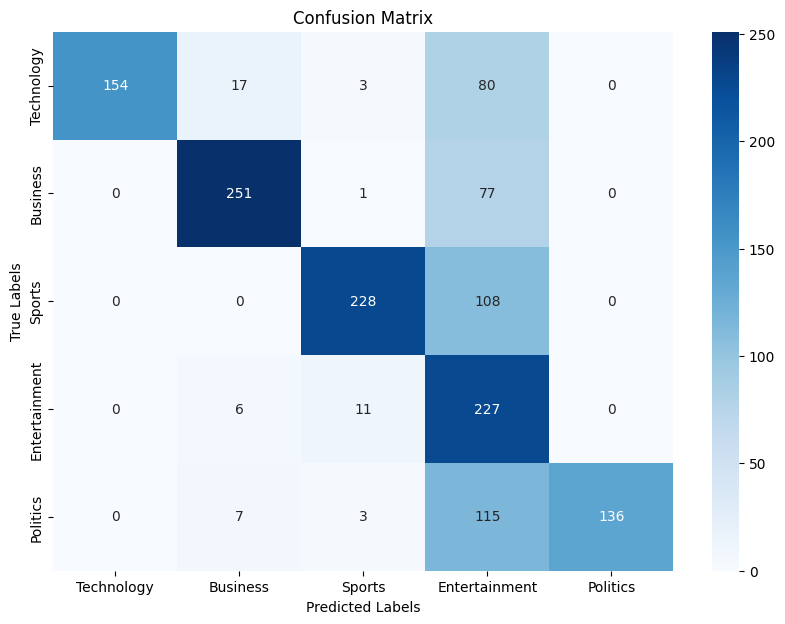

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      0.61      0.75       254
     Business       0.89      0.76      0.82       329
       Sports       0.93      0.68      0.78       336
Entertainment       0.37      0.93      0.53       244
     Politics       1.00      0.52      0.69       261

     accuracy                           0.70      1424
    macro avg       0.84      0.70      0.72      1424
 weighted avg       0.85      0.70      0.73      1424

Accuracy: 0.699438202247191
NDCG score with 1st 2 relevant ranks: 0.7645692933813232
==========================Val metrics================================


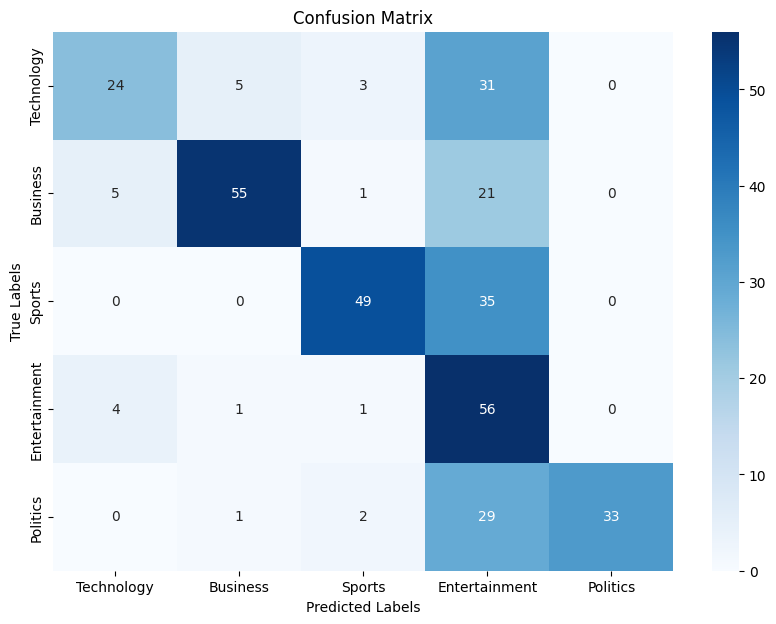

Classification Report:
               precision    recall  f1-score   support

   Technology       0.73      0.38      0.50        63
     Business       0.89      0.67      0.76        82
       Sports       0.88      0.58      0.70        84
Entertainment       0.33      0.90      0.48        62
     Politics       1.00      0.51      0.67        65

     accuracy                           0.61       356
    macro avg       0.76      0.61      0.62       356
 weighted avg       0.78      0.61      0.64       356

Accuracy: 0.6095505617977528
NDCG score with 1st 2 relevant ranks: 0.672315732815011
============Fold 4=============
==========================Train metrics================================


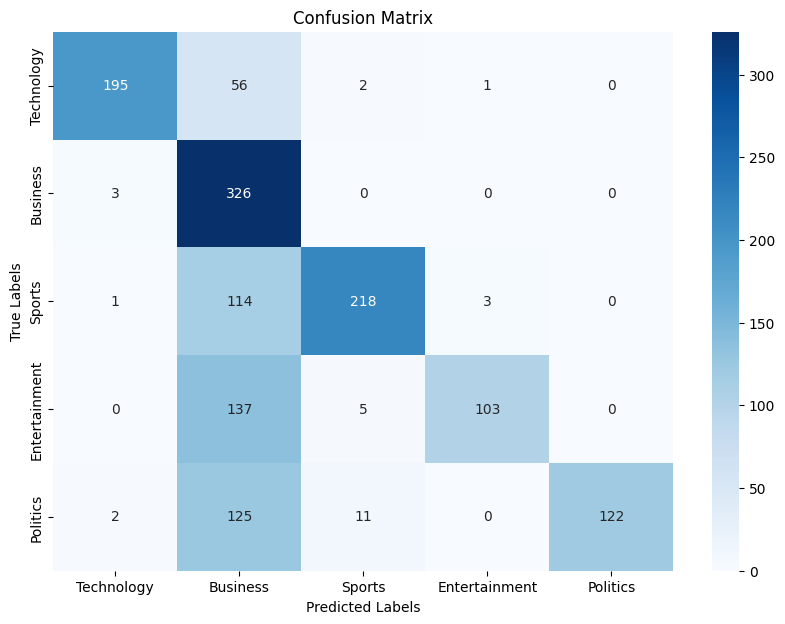

Classification Report:
               precision    recall  f1-score   support

   Technology       0.97      0.77      0.86       254
     Business       0.43      0.99      0.60       329
       Sports       0.92      0.65      0.76       336
Entertainment       0.96      0.42      0.59       245
     Politics       1.00      0.47      0.64       260

     accuracy                           0.68      1424
    macro avg       0.86      0.66      0.69      1424
 weighted avg       0.84      0.68      0.69      1424

Accuracy: 0.6769662921348315
NDCG score with 1st 2 relevant ranks: 0.7451988637991604
==========================Val metrics================================


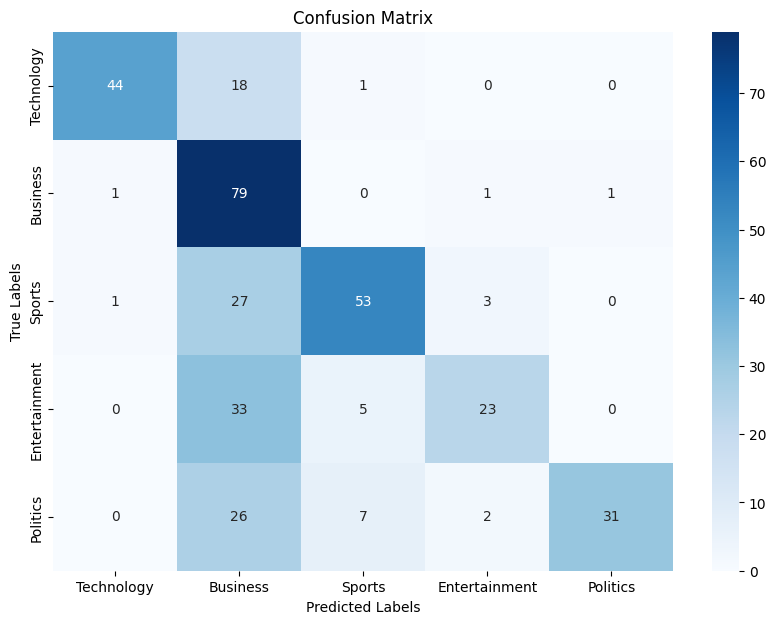

Classification Report:
               precision    recall  f1-score   support

   Technology       0.96      0.70      0.81        63
     Business       0.43      0.96      0.60        82
       Sports       0.80      0.63      0.71        84
Entertainment       0.79      0.38      0.51        61
     Politics       0.97      0.47      0.63        66

     accuracy                           0.65       356
    macro avg       0.79      0.63      0.65       356
 weighted avg       0.77      0.65      0.65       356

Accuracy: 0.6460674157303371
NDCG score with 1st 2 relevant ranks: 0.7205029484550596
============Fold 5=============
==========================Train metrics================================


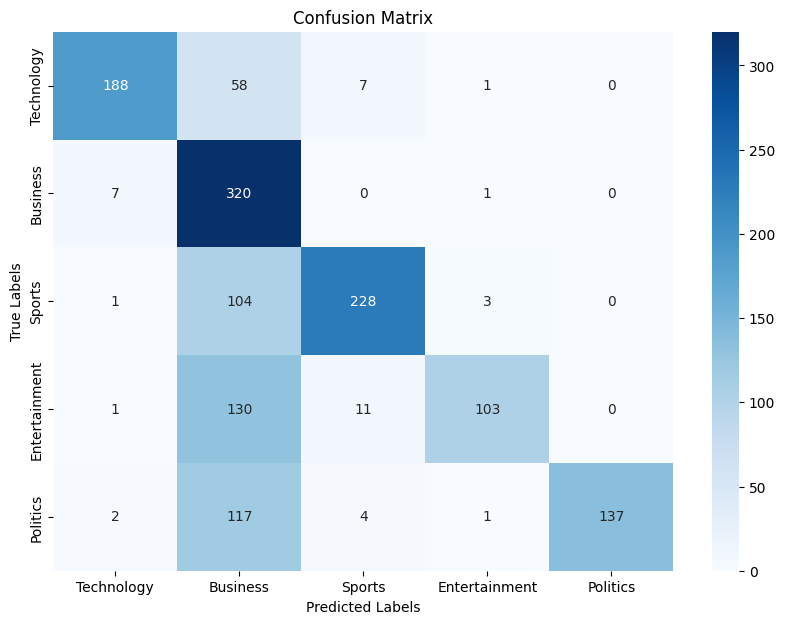

Classification Report:
               precision    recall  f1-score   support

   Technology       0.94      0.74      0.83       254
     Business       0.44      0.98      0.61       328
       Sports       0.91      0.68      0.78       336
Entertainment       0.94      0.42      0.58       245
     Politics       1.00      0.52      0.69       261

     accuracy                           0.69      1424
    macro avg       0.85      0.67      0.70      1424
 weighted avg       0.83      0.69      0.70      1424

Accuracy: 0.6853932584269663
NDCG score with 1st 2 relevant ranks: 0.7527396927969534
==========================Val metrics================================


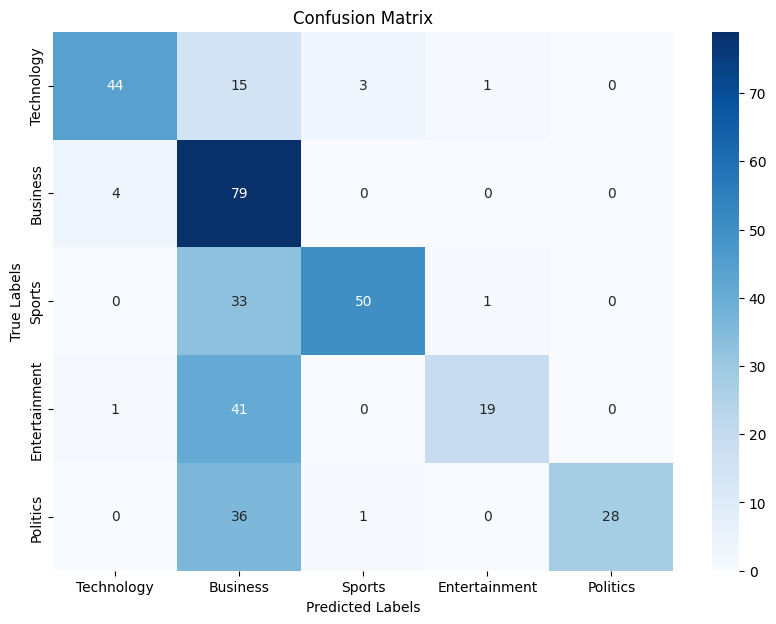

Classification Report:
               precision    recall  f1-score   support

   Technology       0.90      0.70      0.79        63
     Business       0.39      0.95      0.55        83
       Sports       0.93      0.60      0.72        84
Entertainment       0.90      0.31      0.46        61
     Politics       1.00      0.43      0.60        65

     accuracy                           0.62       356
    macro avg       0.82      0.60      0.63       356
 weighted avg       0.81      0.62      0.63       356

Accuracy: 0.6179775280898876
NDCG score with 1st 2 relevant ranks: 0.6924130608146102
==========================End of Folds================================
time taken(mins):  0.09919522205988567
param_dict[best_estimator]:  XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1.0,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='mlogloss', gamma=0

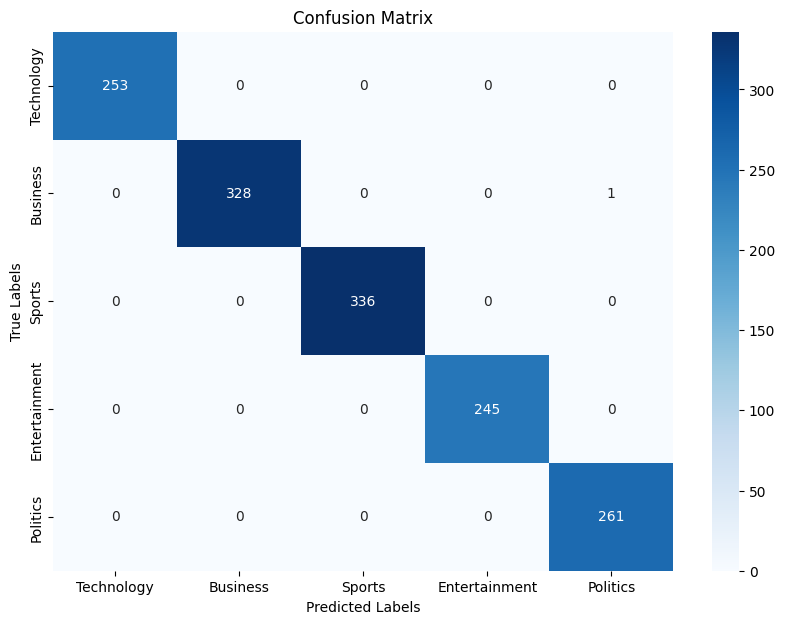

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       253
     Business       1.00      1.00      1.00       329
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       245
     Politics       1.00      1.00      1.00       261

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 0.9992977528089888
NDCG score with 1st 2 relevant ranks: 0.9997408214561596
==========================Val metrics================================


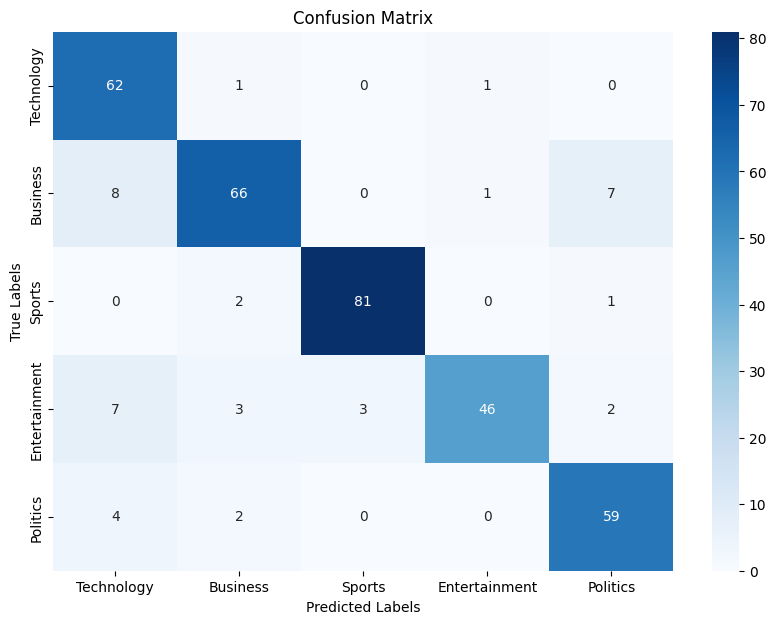

Classification Report:
               precision    recall  f1-score   support

   Technology       0.77      0.97      0.86        64
     Business       0.89      0.80      0.85        82
       Sports       0.96      0.96      0.96        84
Entertainment       0.96      0.75      0.84        61
     Politics       0.86      0.91      0.88        65

     accuracy                           0.88       356
    macro avg       0.89      0.88      0.88       356
 weighted avg       0.89      0.88      0.88       356

Accuracy: 0.8820224719101124
NDCG score with 1st 2 relevant ranks: 0.8962006686195834
============Fold 2=============
==========================Train metrics================================


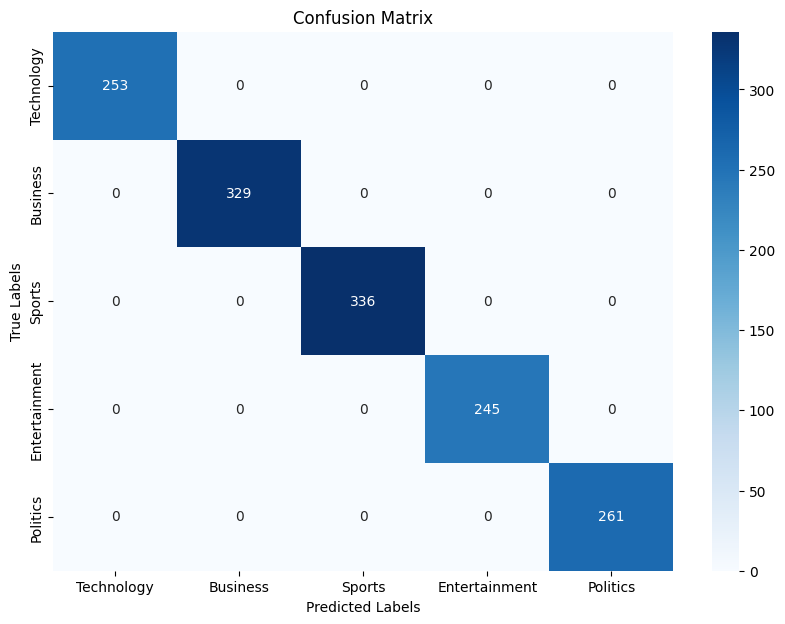

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       253
     Business       1.00      1.00      1.00       329
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       245
     Politics       1.00      1.00      1.00       261

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


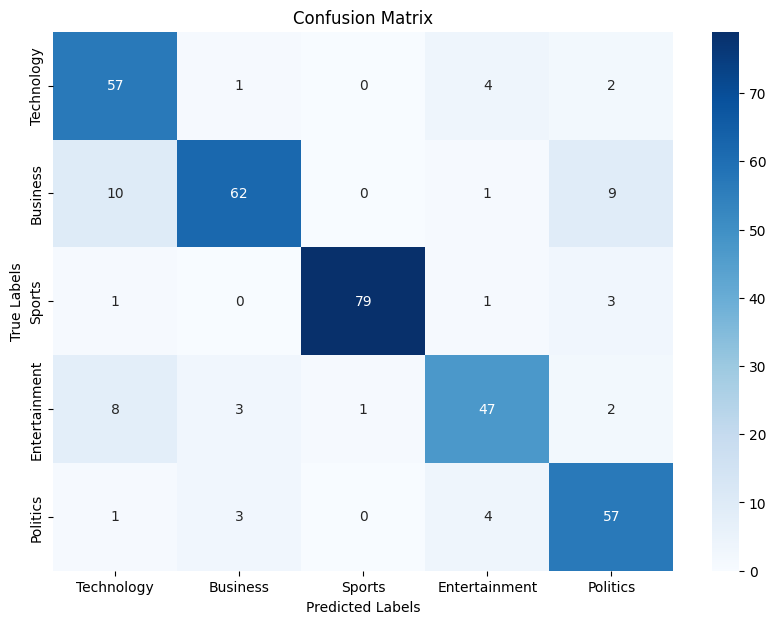

Classification Report:
               precision    recall  f1-score   support

   Technology       0.74      0.89      0.81        64
     Business       0.90      0.76      0.82        82
       Sports       0.99      0.94      0.96        84
Entertainment       0.82      0.77      0.80        61
     Politics       0.78      0.88      0.83        65

     accuracy                           0.85       356
    macro avg       0.85      0.85      0.84       356
 weighted avg       0.86      0.85      0.85       356

Accuracy: 0.848314606741573
NDCG score with 1st 2 relevant ranks: 0.8660373526284117
============Fold 3=============
==========================Train metrics================================


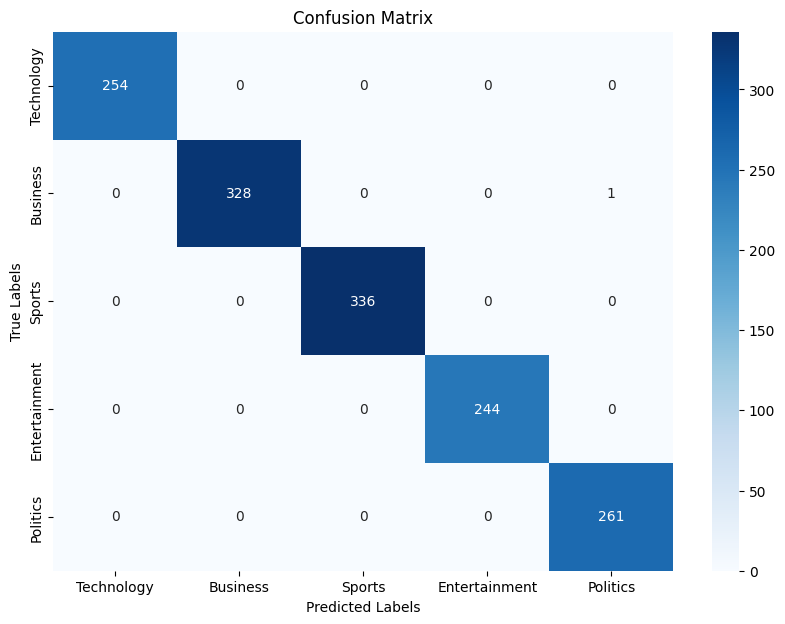

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       254
     Business       1.00      1.00      1.00       329
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       244
     Politics       1.00      1.00      1.00       261

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 0.9992977528089888
NDCG score with 1st 2 relevant ranks: 0.9997408214561596
==========================Val metrics================================


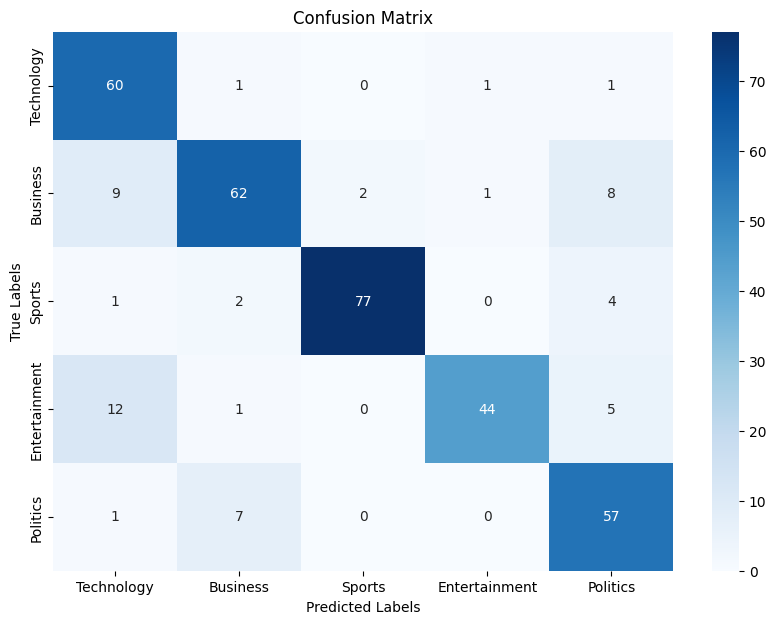

Classification Report:
               precision    recall  f1-score   support

   Technology       0.72      0.95      0.82        63
     Business       0.85      0.76      0.80        82
       Sports       0.97      0.92      0.94        84
Entertainment       0.96      0.71      0.81        62
     Politics       0.76      0.88      0.81        65

     accuracy                           0.84       356
    macro avg       0.85      0.84      0.84       356
 weighted avg       0.86      0.84      0.84       356

Accuracy: 0.8426966292134831
NDCG score with 1st 2 relevant ranks: 0.8657361988663734
============Fold 4=============
==========================Train metrics================================


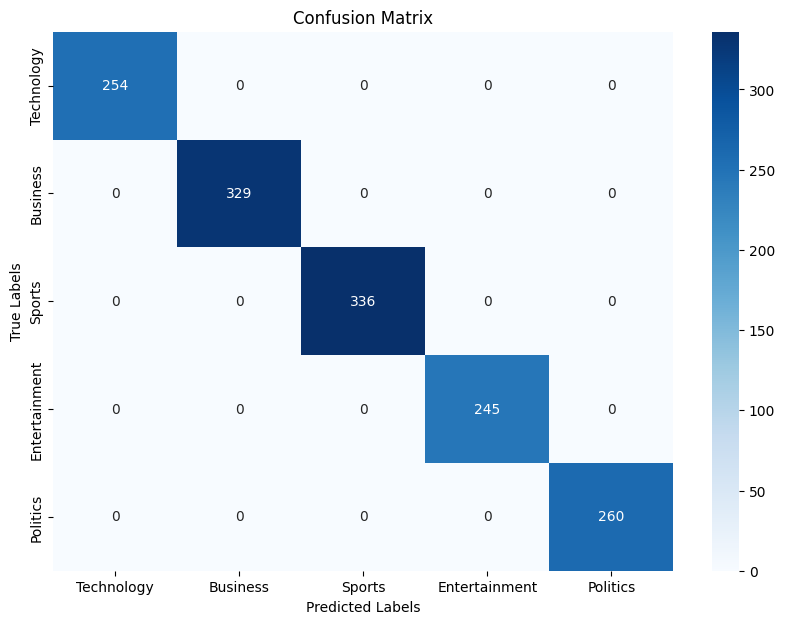

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       254
     Business       1.00      1.00      1.00       329
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       245
     Politics       1.00      1.00      1.00       260

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


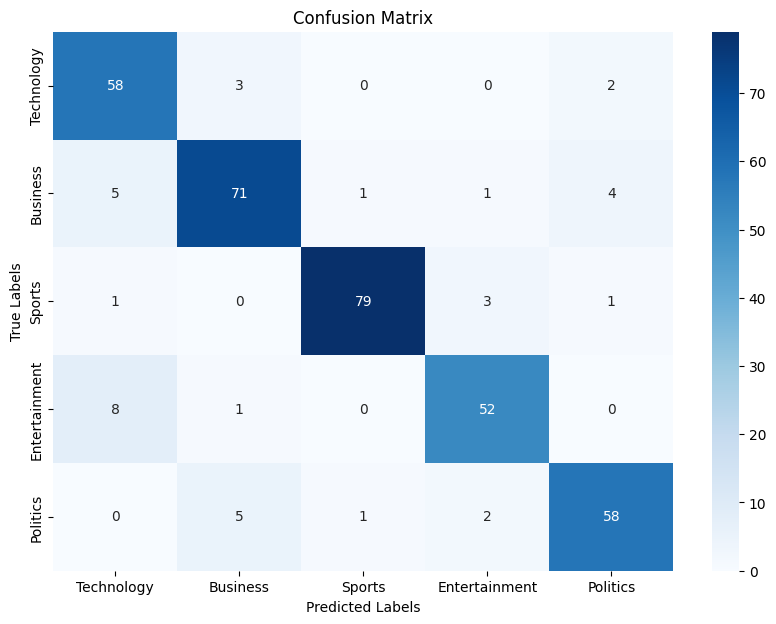

Classification Report:
               precision    recall  f1-score   support

   Technology       0.81      0.92      0.86        63
     Business       0.89      0.87      0.88        82
       Sports       0.98      0.94      0.96        84
Entertainment       0.90      0.85      0.87        61
     Politics       0.89      0.88      0.89        66

     accuracy                           0.89       356
    macro avg       0.89      0.89      0.89       356
 weighted avg       0.90      0.89      0.89       356

Accuracy: 0.8932584269662921
NDCG score with 1st 2 relevant ranks: 0.9074366236757629
============Fold 5=============
==========================Train metrics================================


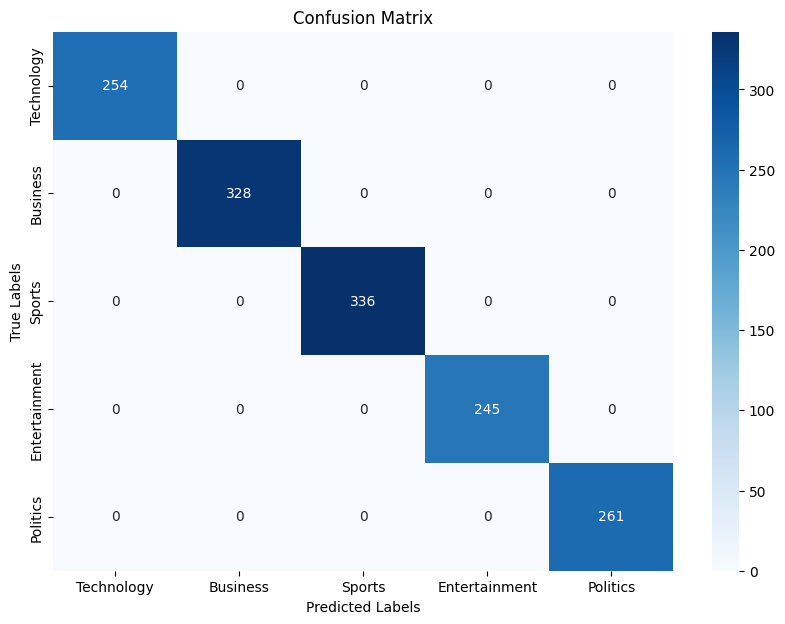

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       254
     Business       1.00      1.00      1.00       328
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       245
     Politics       1.00      1.00      1.00       261

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


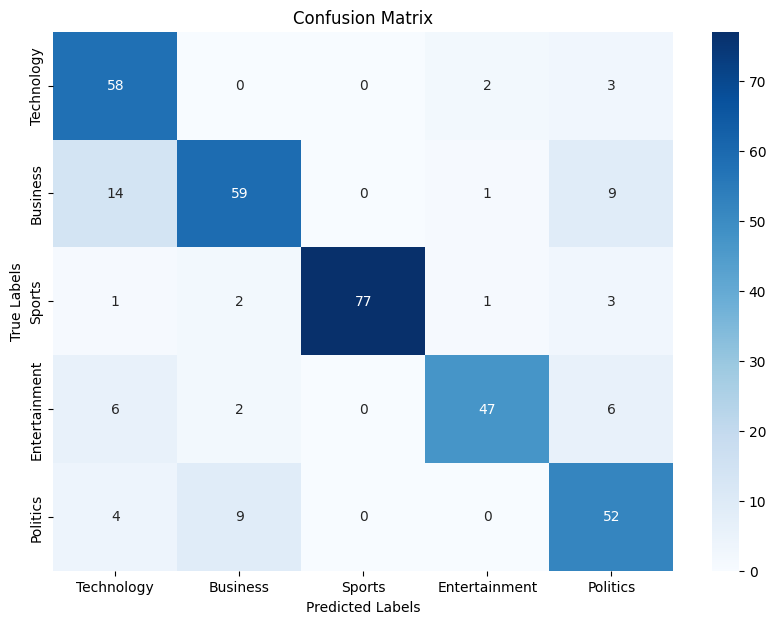

Classification Report:
               precision    recall  f1-score   support

   Technology       0.70      0.92      0.79        63
     Business       0.82      0.71      0.76        83
       Sports       1.00      0.92      0.96        84
Entertainment       0.92      0.77      0.84        61
     Politics       0.71      0.80      0.75        65

     accuracy                           0.82       356
    macro avg       0.83      0.82      0.82       356
 weighted avg       0.84      0.82      0.83       356

Accuracy: 0.8230337078651685
NDCG score with 1st 2 relevant ranks: 0.8567069250501621
==========================End of Folds================================
time taken(mins):  0.1000181516011556
param_dict[best_estimator]:  XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1.0,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='mlogloss', gamma=0,

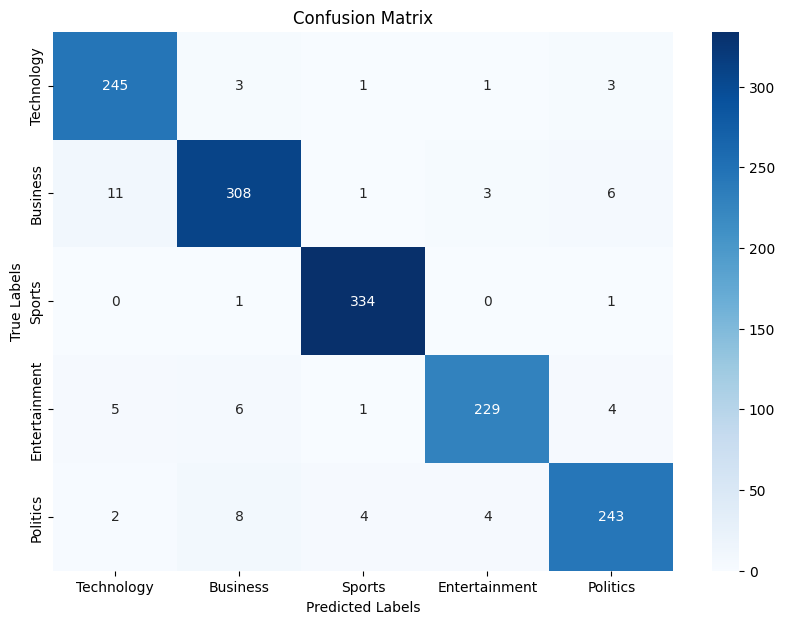

Classification Report:
               precision    recall  f1-score   support

   Technology       0.93      0.97      0.95       253
     Business       0.94      0.94      0.94       329
       Sports       0.98      0.99      0.99       336
Entertainment       0.97      0.93      0.95       245
     Politics       0.95      0.93      0.94       261

     accuracy                           0.95      1424
    macro avg       0.95      0.95      0.95      1424
 weighted avg       0.95      0.95      0.95      1424

Accuracy: 0.9543539325842697
NDCG score with 1st 2 relevant ranks: 0.9754706507674571
==========================Val metrics================================


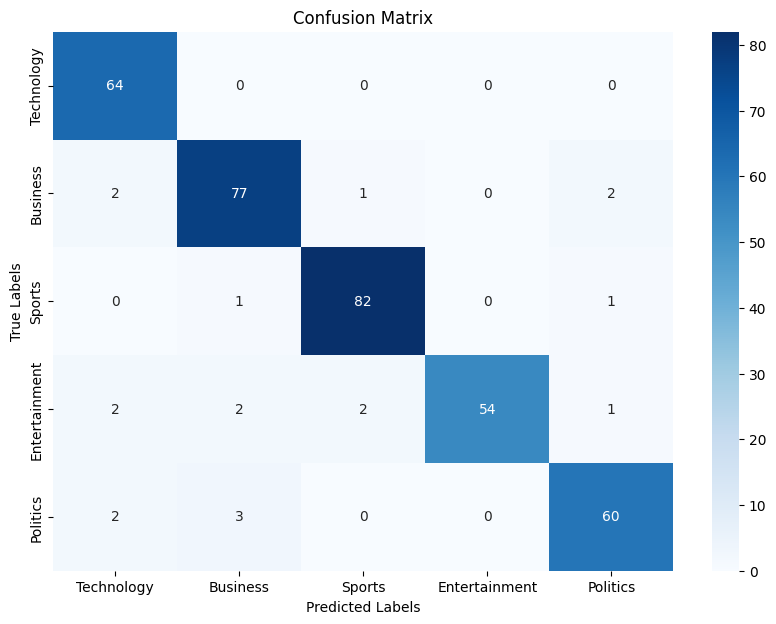

Classification Report:
               precision    recall  f1-score   support

   Technology       0.91      1.00      0.96        64
     Business       0.93      0.94      0.93        82
       Sports       0.96      0.98      0.97        84
Entertainment       1.00      0.89      0.94        61
     Politics       0.94      0.92      0.93        65

     accuracy                           0.95       356
    macro avg       0.95      0.94      0.95       356
 weighted avg       0.95      0.95      0.95       356

Accuracy: 0.9466292134831461
NDCG score with 1st 2 relevant ranks: 0.9619773772572243
============Fold 2=============
==========================Train metrics================================


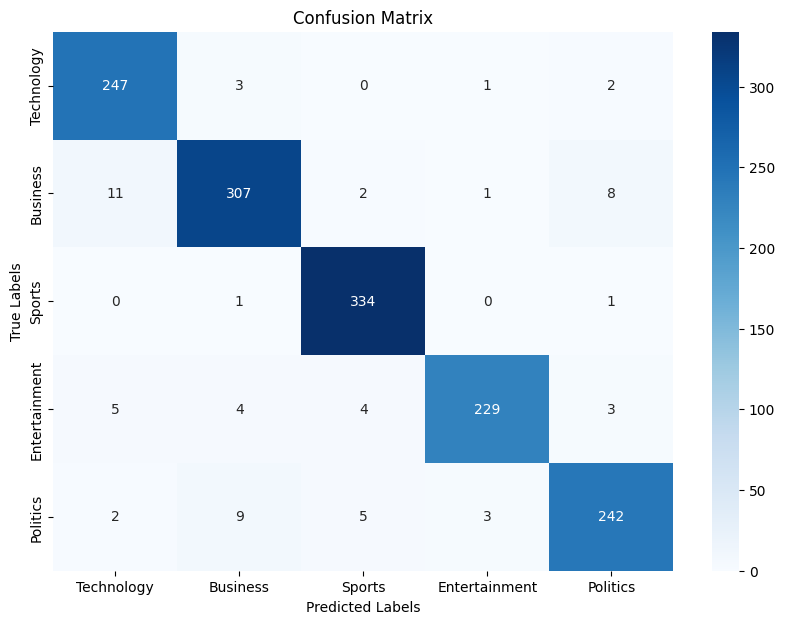

Classification Report:
               precision    recall  f1-score   support

   Technology       0.93      0.98      0.95       253
     Business       0.95      0.93      0.94       329
       Sports       0.97      0.99      0.98       336
Entertainment       0.98      0.93      0.96       245
     Politics       0.95      0.93      0.94       261

     accuracy                           0.95      1424
    macro avg       0.95      0.95      0.95      1424
 weighted avg       0.95      0.95      0.95      1424

Accuracy: 0.9543539325842697
NDCG score with 1st 2 relevant ranks: 0.9780957494281712
==========================Val metrics================================


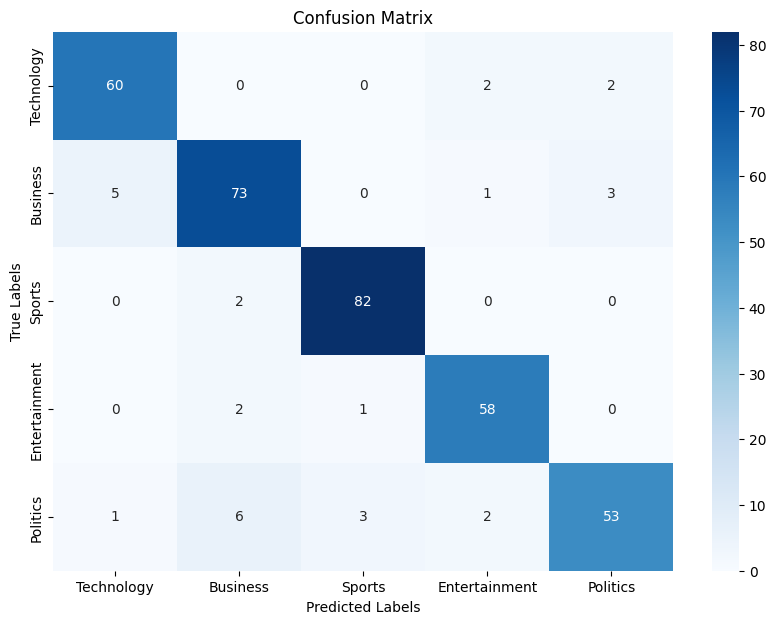

Classification Report:
               precision    recall  f1-score   support

   Technology       0.91      0.94      0.92        64
     Business       0.88      0.89      0.88        82
       Sports       0.95      0.98      0.96        84
Entertainment       0.92      0.95      0.94        61
     Politics       0.91      0.82      0.86        65

     accuracy                           0.92       356
    macro avg       0.92      0.91      0.91       356
 weighted avg       0.92      0.92      0.92       356

Accuracy: 0.9157303370786517
NDCG score with 1st 2 relevant ranks: 0.9479324334369997
============Fold 3=============
==========================Train metrics================================


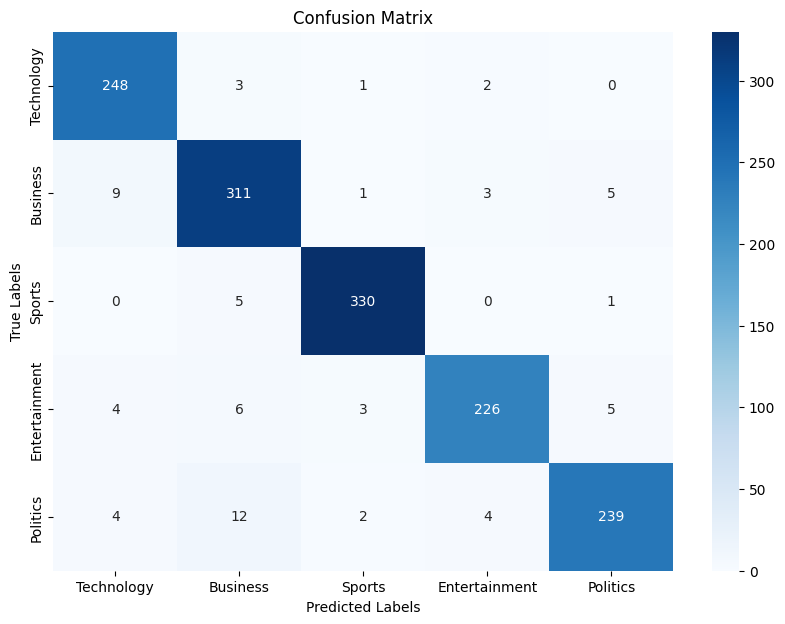

Classification Report:
               precision    recall  f1-score   support

   Technology       0.94      0.98      0.96       254
     Business       0.92      0.95      0.93       329
       Sports       0.98      0.98      0.98       336
Entertainment       0.96      0.93      0.94       244
     Politics       0.96      0.92      0.94       261

     accuracy                           0.95      1424
    macro avg       0.95      0.95      0.95      1424
 weighted avg       0.95      0.95      0.95      1424

Accuracy: 0.9508426966292135
NDCG score with 1st 2 relevant ranks: 0.9788313098414941
==========================Val metrics================================


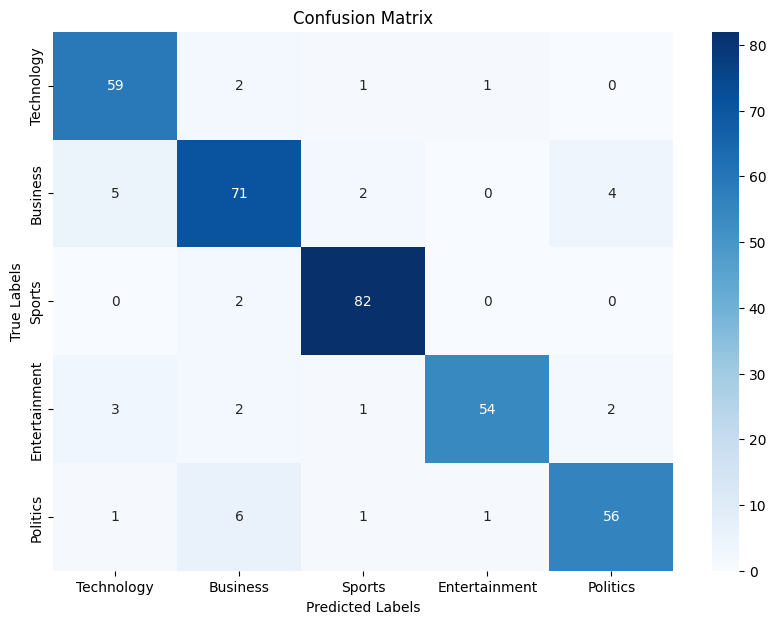

Classification Report:
               precision    recall  f1-score   support

   Technology       0.87      0.94      0.90        63
     Business       0.86      0.87      0.86        82
       Sports       0.94      0.98      0.96        84
Entertainment       0.96      0.87      0.92        62
     Politics       0.90      0.86      0.88        65

     accuracy                           0.90       356
    macro avg       0.91      0.90      0.90       356
 weighted avg       0.91      0.90      0.90       356

Accuracy: 0.9044943820224719
NDCG score with 1st 2 relevant ranks: 0.9522125430276902
============Fold 4=============
==========================Train metrics================================


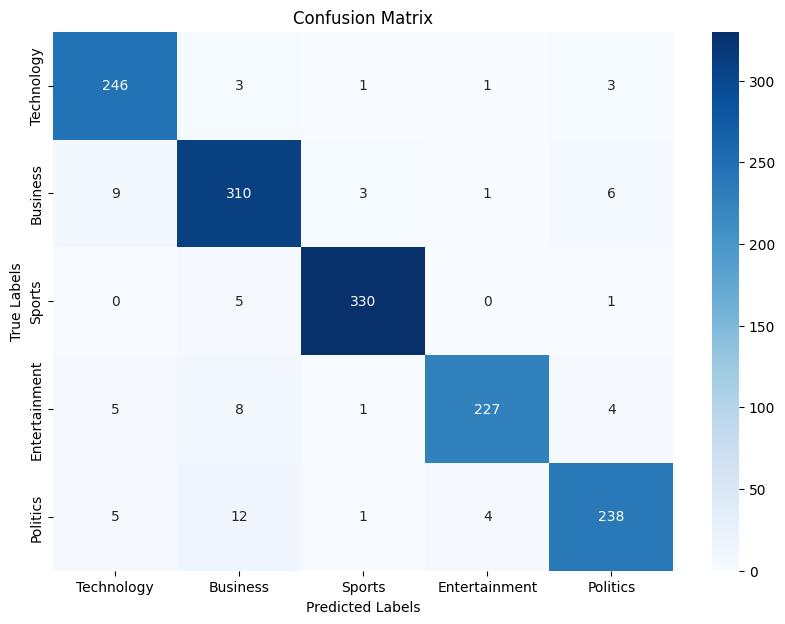

Classification Report:
               precision    recall  f1-score   support

   Technology       0.93      0.97      0.95       254
     Business       0.92      0.94      0.93       329
       Sports       0.98      0.98      0.98       336
Entertainment       0.97      0.93      0.95       245
     Politics       0.94      0.92      0.93       260

     accuracy                           0.95      1424
    macro avg       0.95      0.95      0.95      1424
 weighted avg       0.95      0.95      0.95      1424

Accuracy: 0.9487359550561798
NDCG score with 1st 2 relevant ranks: 0.973656400960575
==========================Val metrics================================


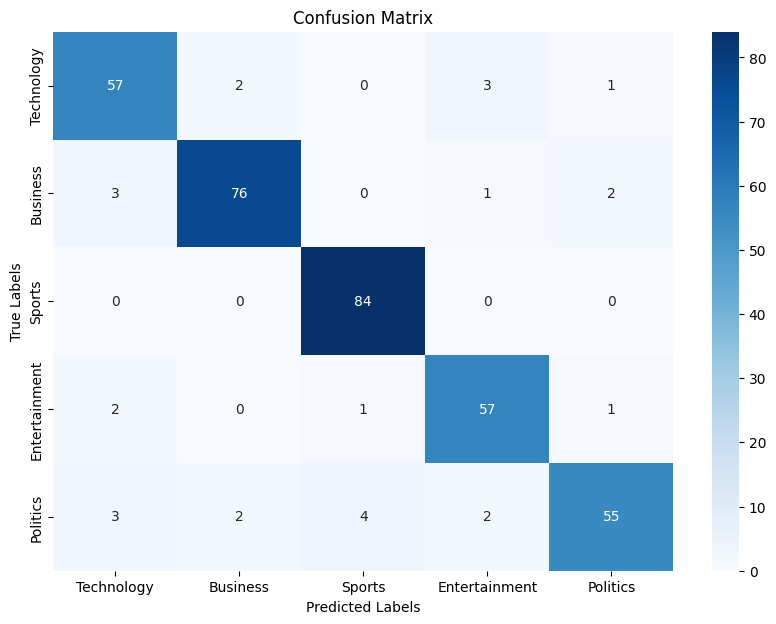

Classification Report:
               precision    recall  f1-score   support

   Technology       0.88      0.90      0.89        63
     Business       0.95      0.93      0.94        82
       Sports       0.94      1.00      0.97        84
Entertainment       0.90      0.93      0.92        61
     Politics       0.93      0.83      0.88        66

     accuracy                           0.92       356
    macro avg       0.92      0.92      0.92       356
 weighted avg       0.92      0.92      0.92       356

Accuracy: 0.9241573033707865
NDCG score with 1st 2 relevant ranks: 0.9599039489065021
============Fold 5=============
==========================Train metrics================================


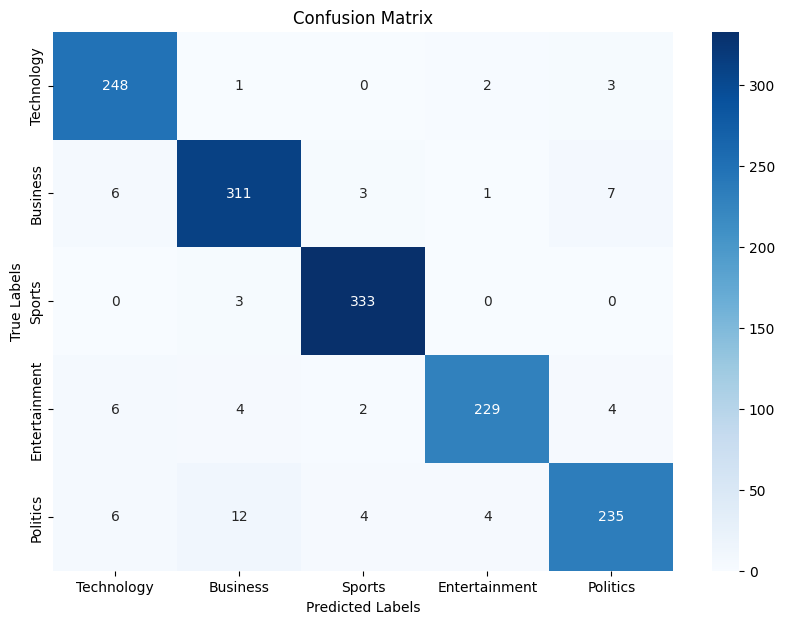

Classification Report:
               precision    recall  f1-score   support

   Technology       0.93      0.98      0.95       254
     Business       0.94      0.95      0.94       328
       Sports       0.97      0.99      0.98       336
Entertainment       0.97      0.93      0.95       245
     Politics       0.94      0.90      0.92       261

     accuracy                           0.95      1424
    macro avg       0.95      0.95      0.95      1424
 weighted avg       0.95      0.95      0.95      1424

Accuracy: 0.952247191011236
NDCG score with 1st 2 relevant ranks: 0.9778698841066426
==========================Val metrics================================


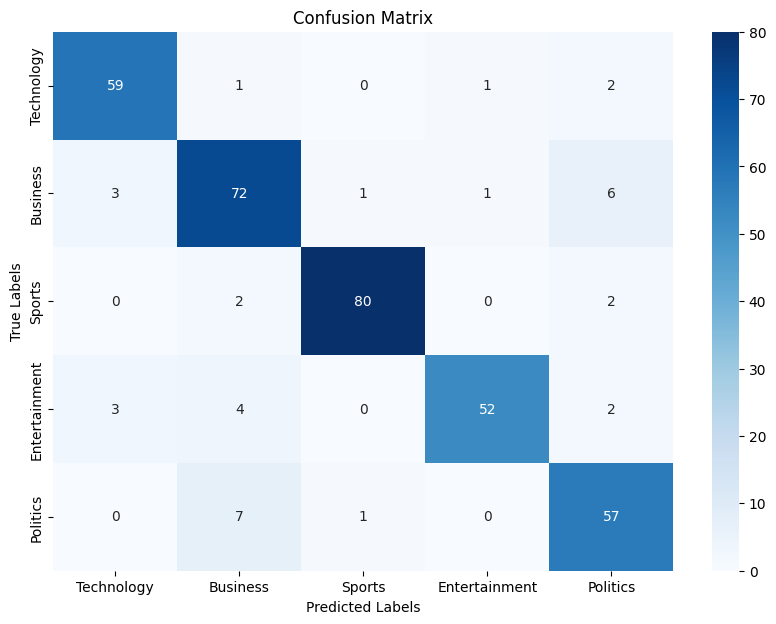

Classification Report:
               precision    recall  f1-score   support

   Technology       0.91      0.94      0.92        63
     Business       0.84      0.87      0.85        83
       Sports       0.98      0.95      0.96        84
Entertainment       0.96      0.85      0.90        61
     Politics       0.83      0.88      0.85        65

     accuracy                           0.90       356
    macro avg       0.90      0.90      0.90       356
 weighted avg       0.90      0.90      0.90       356

Accuracy: 0.898876404494382
NDCG score with 1st 2 relevant ranks: 0.9414109946227949
==========================End of Folds================================
time taken(mins):  0.18582104841868083
param_dict[best_estimator]:  XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1.0,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='mlogloss', gamma=0,

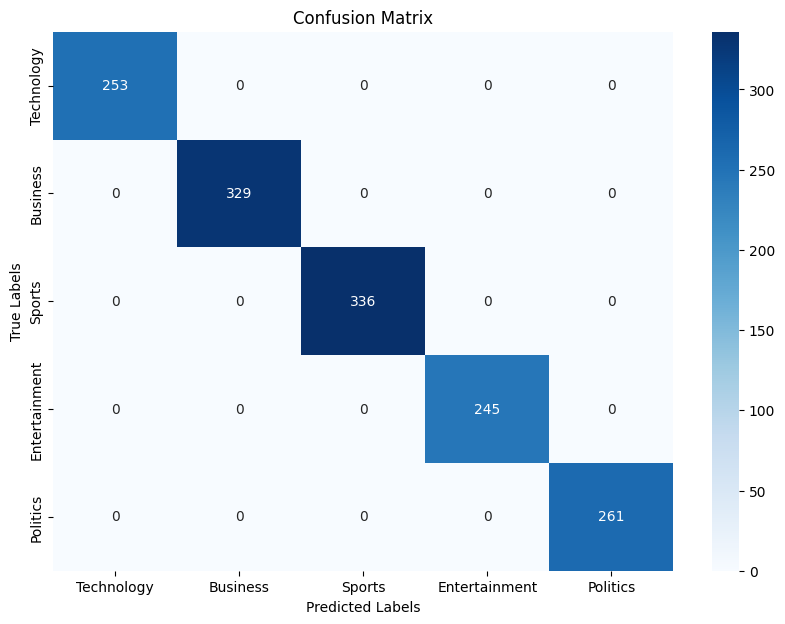

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       253
     Business       1.00      1.00      1.00       329
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       245
     Politics       1.00      1.00      1.00       261

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


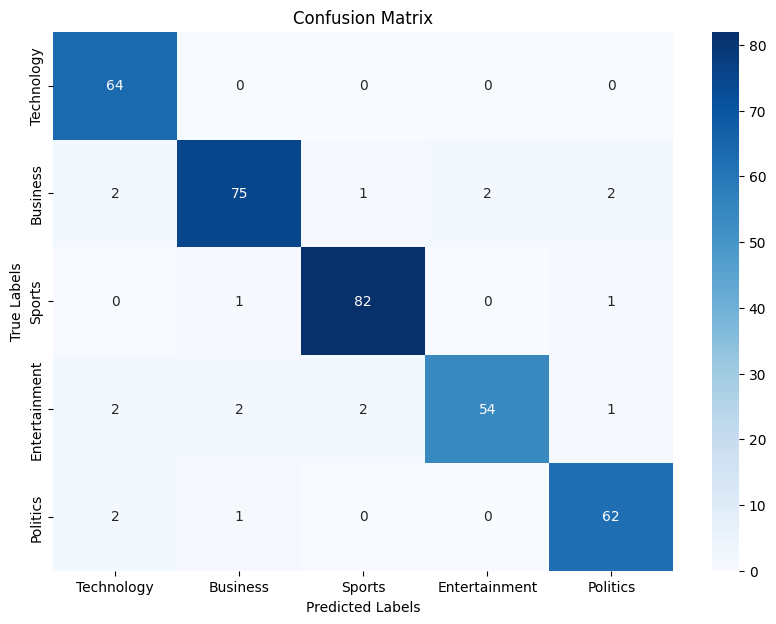

Classification Report:
               precision    recall  f1-score   support

   Technology       0.91      1.00      0.96        64
     Business       0.95      0.91      0.93        82
       Sports       0.96      0.98      0.97        84
Entertainment       0.96      0.89      0.92        61
     Politics       0.94      0.95      0.95        65

     accuracy                           0.95       356
    macro avg       0.95      0.95      0.95       356
 weighted avg       0.95      0.95      0.95       356

Accuracy: 0.9466292134831461
NDCG score with 1st 2 relevant ranks: 0.9714410577247203
============Fold 2=============
==========================Train metrics================================


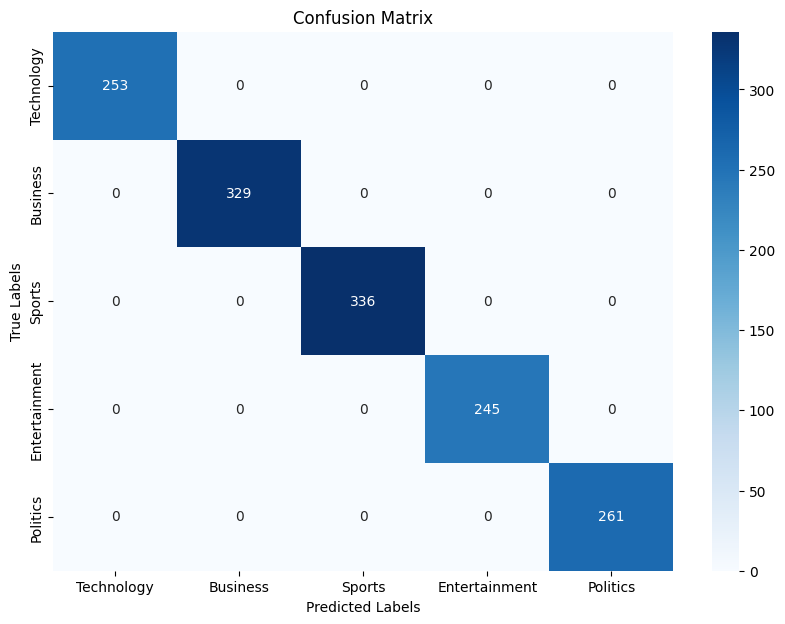

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       253
     Business       1.00      1.00      1.00       329
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       245
     Politics       1.00      1.00      1.00       261

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


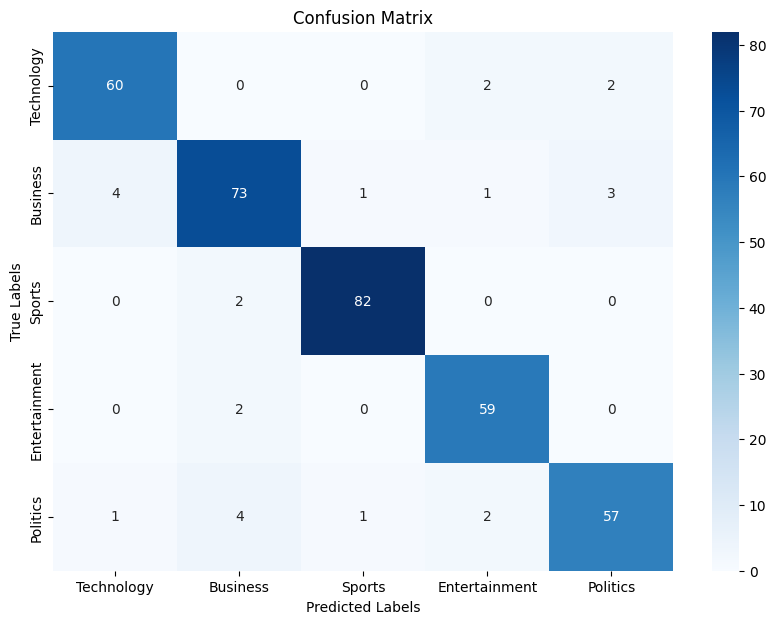

Classification Report:
               precision    recall  f1-score   support

   Technology       0.92      0.94      0.93        64
     Business       0.90      0.89      0.90        82
       Sports       0.98      0.98      0.98        84
Entertainment       0.92      0.97      0.94        61
     Politics       0.92      0.88      0.90        65

     accuracy                           0.93       356
    macro avg       0.93      0.93      0.93       356
 weighted avg       0.93      0.93      0.93       356

Accuracy: 0.9297752808988764
NDCG score with 1st 2 relevant ranks: 0.9563593997291344
============Fold 3=============
==========================Train metrics================================


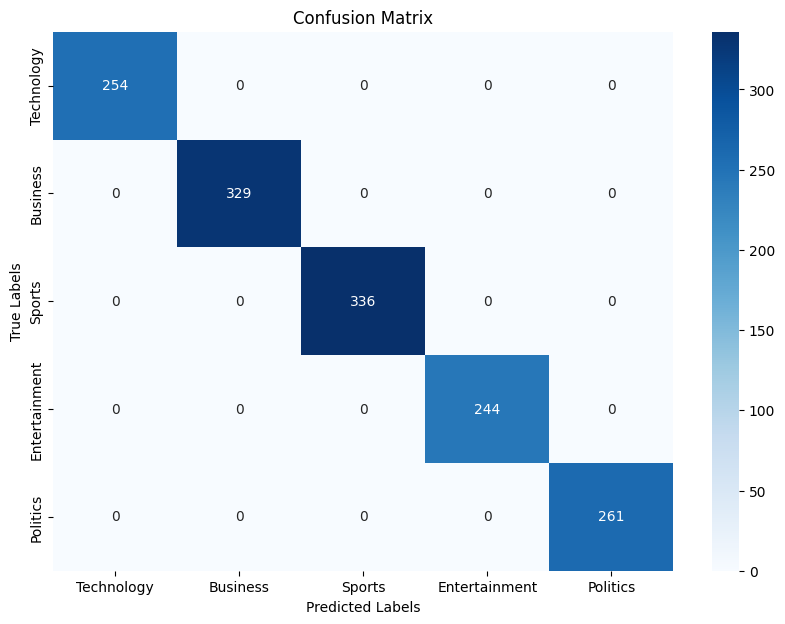

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       254
     Business       1.00      1.00      1.00       329
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       244
     Politics       1.00      1.00      1.00       261

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


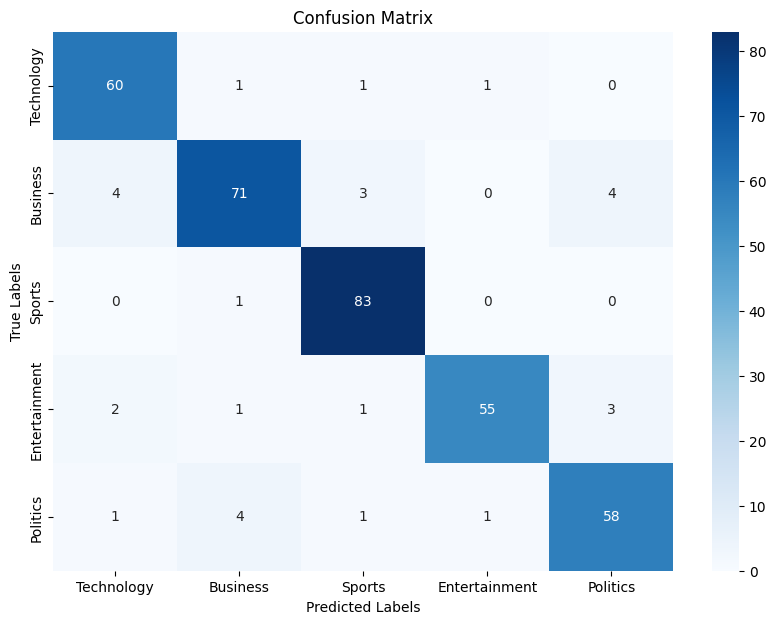

Classification Report:
               precision    recall  f1-score   support

   Technology       0.90      0.95      0.92        63
     Business       0.91      0.87      0.89        82
       Sports       0.93      0.99      0.96        84
Entertainment       0.96      0.89      0.92        62
     Politics       0.89      0.89      0.89        65

     accuracy                           0.92       356
    macro avg       0.92      0.92      0.92       356
 weighted avg       0.92      0.92      0.92       356

Accuracy: 0.9185393258426966
NDCG score with 1st 2 relevant ranks: 0.953984817616374
============Fold 4=============
==========================Train metrics================================


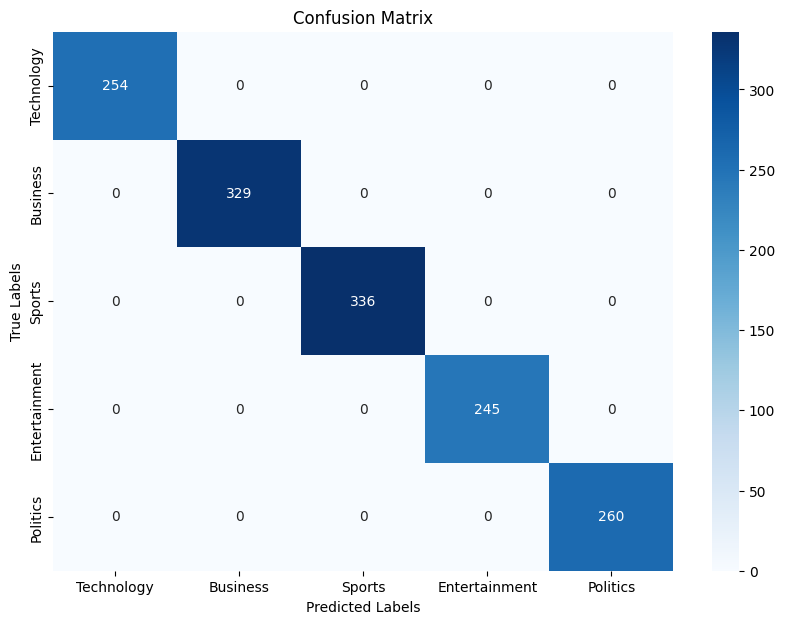

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       254
     Business       1.00      1.00      1.00       329
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       245
     Politics       1.00      1.00      1.00       260

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


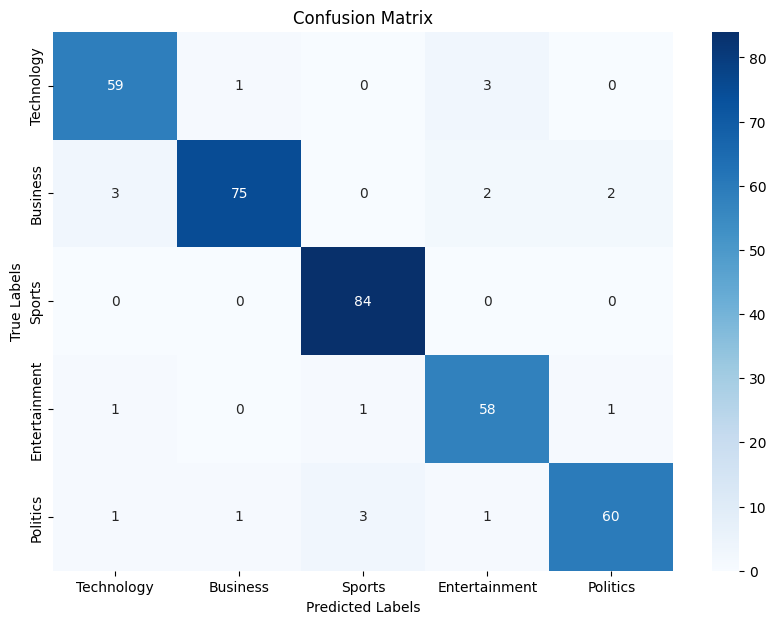

Classification Report:
               precision    recall  f1-score   support

   Technology       0.92      0.94      0.93        63
     Business       0.97      0.91      0.94        82
       Sports       0.95      1.00      0.98        84
Entertainment       0.91      0.95      0.93        61
     Politics       0.95      0.91      0.93        66

     accuracy                           0.94       356
    macro avg       0.94      0.94      0.94       356
 weighted avg       0.94      0.94      0.94       356

Accuracy: 0.9438202247191011
NDCG score with 1st 2 relevant ranks: 0.9686320689606753
============Fold 5=============
==========================Train metrics================================


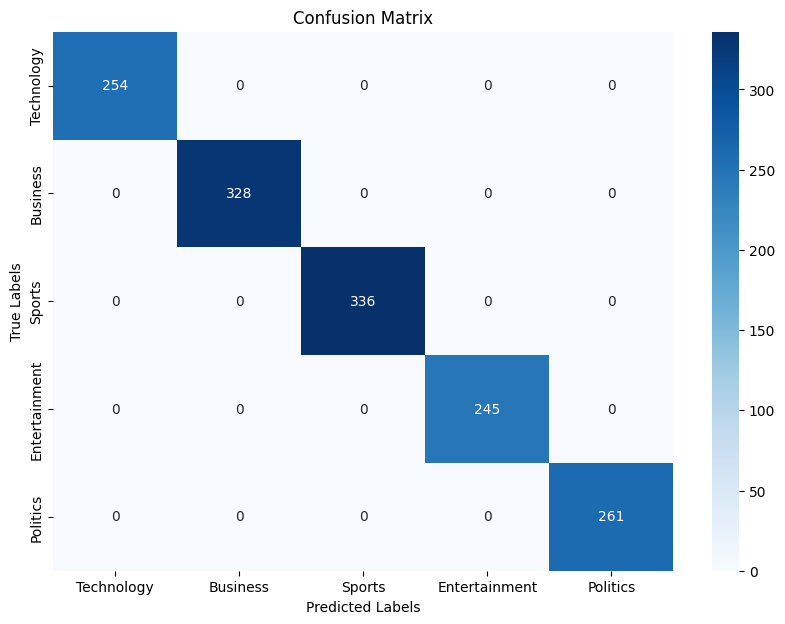

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       254
     Business       1.00      1.00      1.00       328
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       245
     Politics       1.00      1.00      1.00       261

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


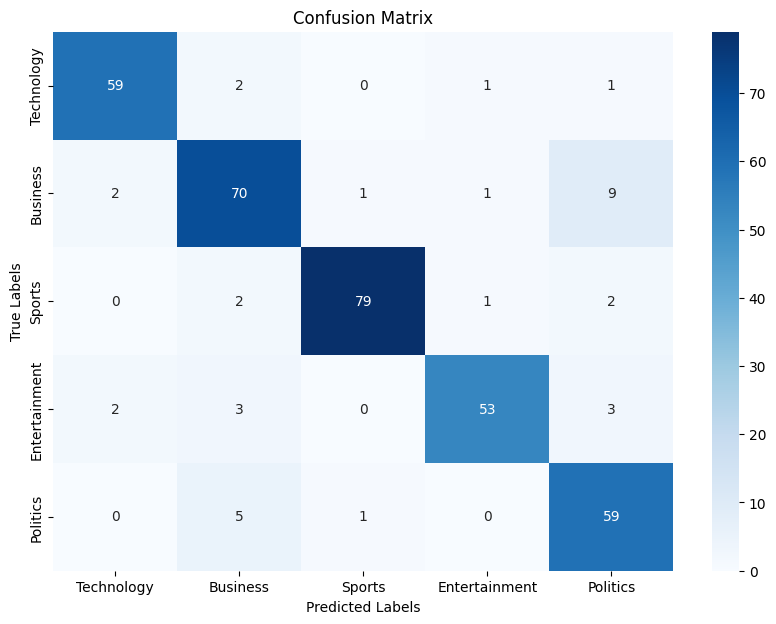

Classification Report:
               precision    recall  f1-score   support

   Technology       0.94      0.94      0.94        63
     Business       0.85      0.84      0.85        83
       Sports       0.98      0.94      0.96        84
Entertainment       0.95      0.87      0.91        61
     Politics       0.80      0.91      0.85        65

     accuracy                           0.90       356
    macro avg       0.90      0.90      0.90       356
 weighted avg       0.90      0.90      0.90       356

Accuracy: 0.898876404494382
NDCG score with 1st 2 relevant ranks: 0.939638720034111
==========================End of Folds================================
time taken(mins):  0.12658948103586834
param_dict[best_estimator]:  XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1.0,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='mlogloss', gamma=0, 

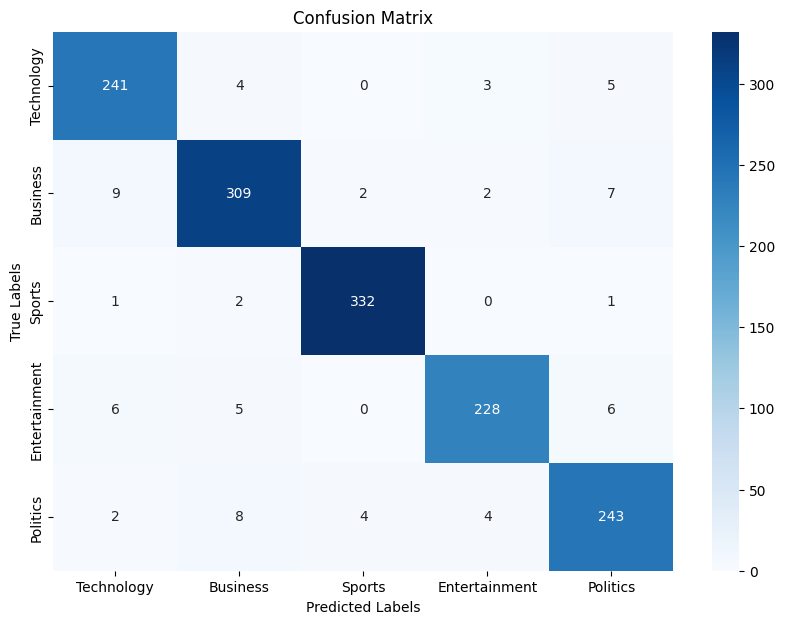

Classification Report:
               precision    recall  f1-score   support

   Technology       0.93      0.95      0.94       253
     Business       0.94      0.94      0.94       329
       Sports       0.98      0.99      0.99       336
Entertainment       0.96      0.93      0.95       245
     Politics       0.93      0.93      0.93       261

     accuracy                           0.95      1424
    macro avg       0.95      0.95      0.95      1424
 weighted avg       0.95      0.95      0.95      1424

Accuracy: 0.9501404494382022
NDCG score with 1st 2 relevant ranks: 0.9737316894010847
==========================Val metrics================================


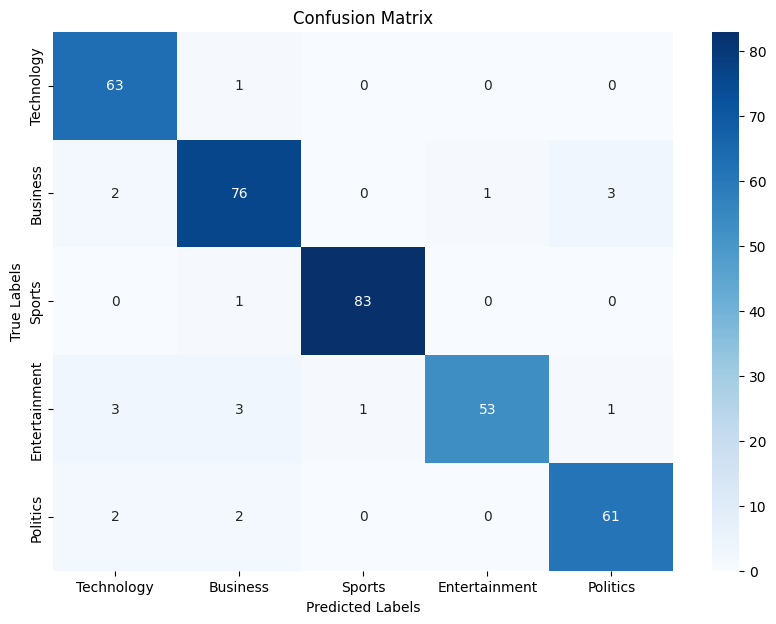

Classification Report:
               precision    recall  f1-score   support

   Technology       0.90      0.98      0.94        64
     Business       0.92      0.93      0.92        82
       Sports       0.99      0.99      0.99        84
Entertainment       0.98      0.87      0.92        61
     Politics       0.94      0.94      0.94        65

     accuracy                           0.94       356
    macro avg       0.94      0.94      0.94       356
 weighted avg       0.95      0.94      0.94       356

Accuracy: 0.9438202247191011
NDCG score with 1st 2 relevant ranks: 0.9675953547853143
============Fold 2=============
==========================Train metrics================================


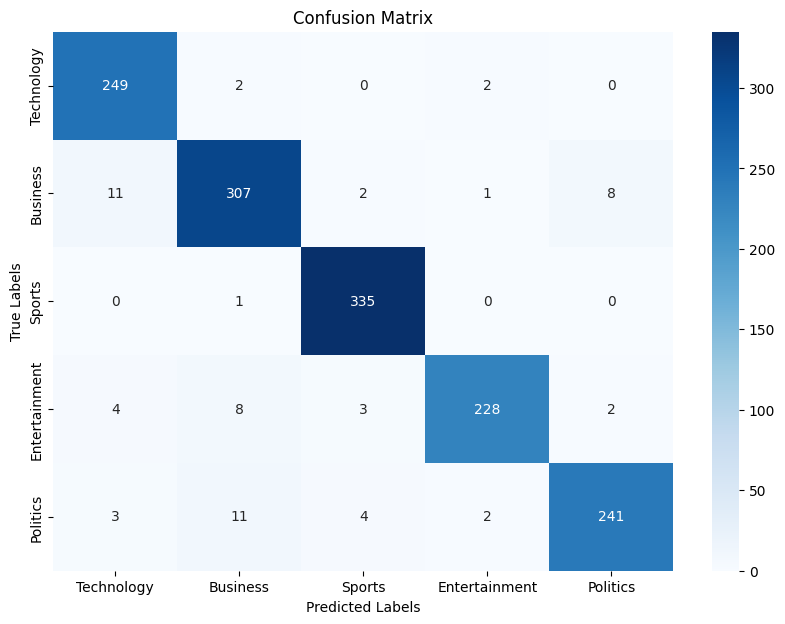

Classification Report:
               precision    recall  f1-score   support

   Technology       0.93      0.98      0.96       253
     Business       0.93      0.93      0.93       329
       Sports       0.97      1.00      0.99       336
Entertainment       0.98      0.93      0.95       245
     Politics       0.96      0.92      0.94       261

     accuracy                           0.96      1424
    macro avg       0.96      0.95      0.95      1424
 weighted avg       0.96      0.96      0.95      1424

Accuracy: 0.9550561797752809
NDCG score with 1st 2 relevant ranks: 0.9795755322507033
==========================Val metrics================================


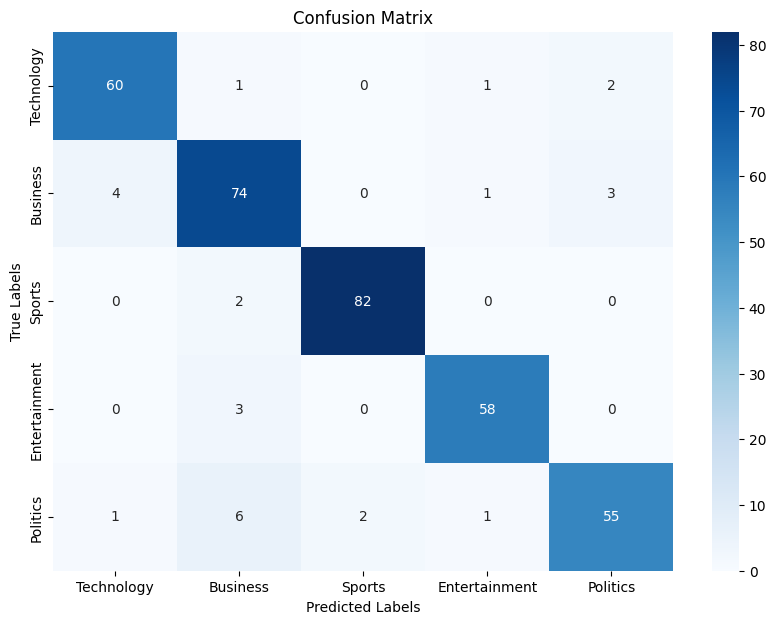

Classification Report:
               precision    recall  f1-score   support

   Technology       0.92      0.94      0.93        64
     Business       0.86      0.90      0.88        82
       Sports       0.98      0.98      0.98        84
Entertainment       0.95      0.95      0.95        61
     Politics       0.92      0.85      0.88        65

     accuracy                           0.92       356
    macro avg       0.93      0.92      0.92       356
 weighted avg       0.92      0.92      0.92       356

Accuracy: 0.9241573033707865
NDCG score with 1st 2 relevant ranks: 0.9594695422552176
============Fold 3=============
==========================Train metrics================================


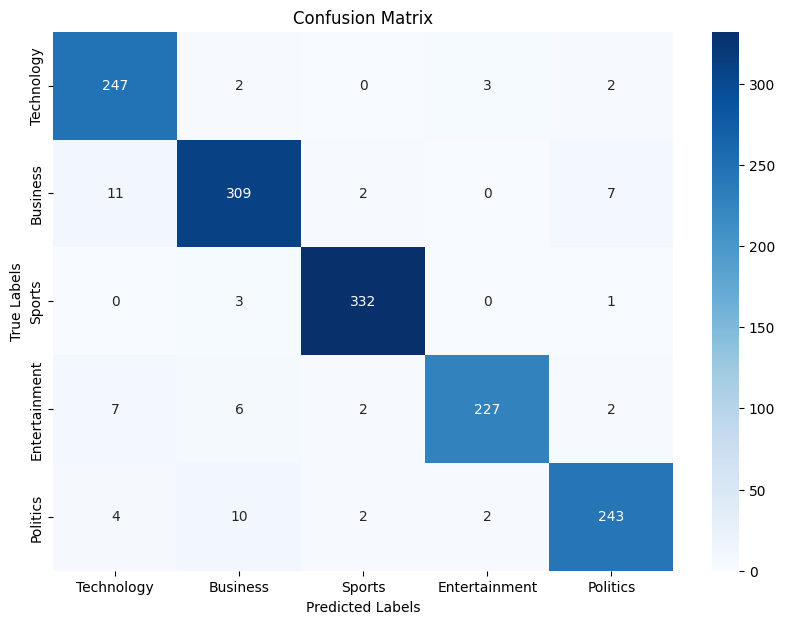

Classification Report:
               precision    recall  f1-score   support

   Technology       0.92      0.97      0.94       254
     Business       0.94      0.94      0.94       329
       Sports       0.98      0.99      0.99       336
Entertainment       0.98      0.93      0.95       244
     Politics       0.95      0.93      0.94       261

     accuracy                           0.95      1424
    macro avg       0.95      0.95      0.95      1424
 weighted avg       0.95      0.95      0.95      1424

Accuracy: 0.9536516853932584
NDCG score with 1st 2 relevant ranks: 0.9794582685919956
==========================Val metrics================================


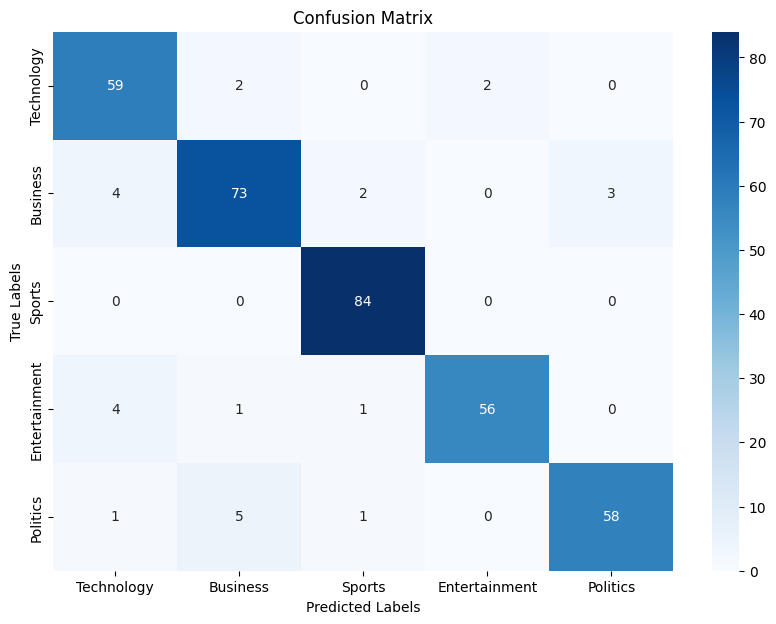

Classification Report:
               precision    recall  f1-score   support

   Technology       0.87      0.94      0.90        63
     Business       0.90      0.89      0.90        82
       Sports       0.95      1.00      0.98        84
Entertainment       0.97      0.90      0.93        62
     Politics       0.95      0.89      0.92        65

     accuracy                           0.93       356
    macro avg       0.93      0.92      0.93       356
 weighted avg       0.93      0.93      0.93       356

Accuracy: 0.9269662921348315
NDCG score with 1st 2 relevant ranks: 0.9542859713784124
============Fold 4=============
==========================Train metrics================================


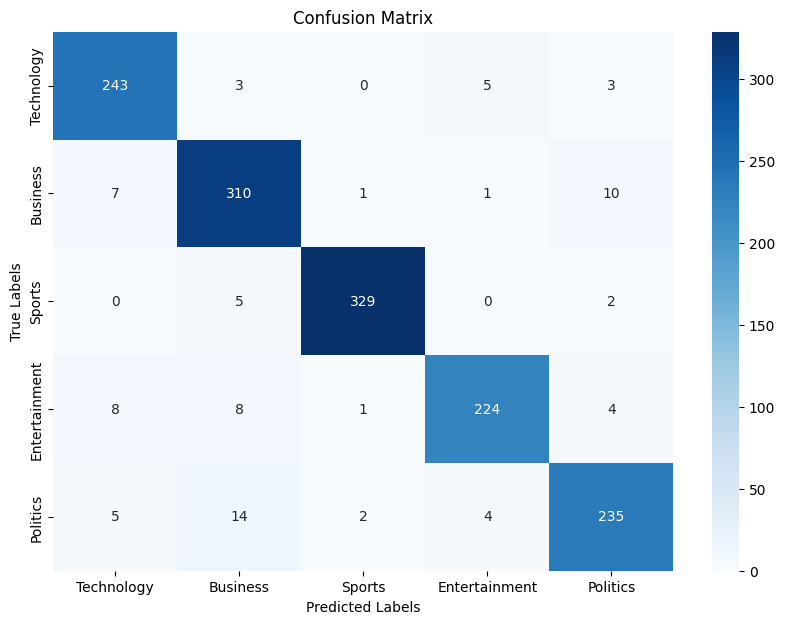

Classification Report:
               precision    recall  f1-score   support

   Technology       0.92      0.96      0.94       254
     Business       0.91      0.94      0.93       329
       Sports       0.99      0.98      0.98       336
Entertainment       0.96      0.91      0.94       245
     Politics       0.93      0.90      0.91       260

     accuracy                           0.94      1424
    macro avg       0.94      0.94      0.94      1424
 weighted avg       0.94      0.94      0.94      1424

Accuracy: 0.9417134831460674
NDCG score with 1st 2 relevant ranks: 0.9740661563854346
==========================Val metrics================================


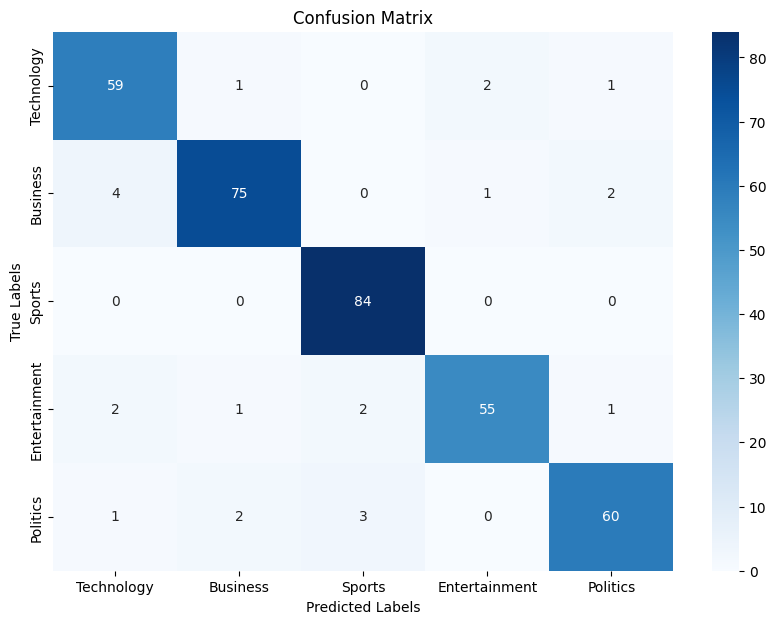

Classification Report:
               precision    recall  f1-score   support

   Technology       0.89      0.94      0.91        63
     Business       0.95      0.91      0.93        82
       Sports       0.94      1.00      0.97        84
Entertainment       0.95      0.90      0.92        61
     Politics       0.94      0.91      0.92        66

     accuracy                           0.94       356
    macro avg       0.93      0.93      0.93       356
 weighted avg       0.94      0.94      0.94       356

Accuracy: 0.9353932584269663
NDCG score with 1st 2 relevant ranks: 0.960639509319825
============Fold 5=============
==========================Train metrics================================


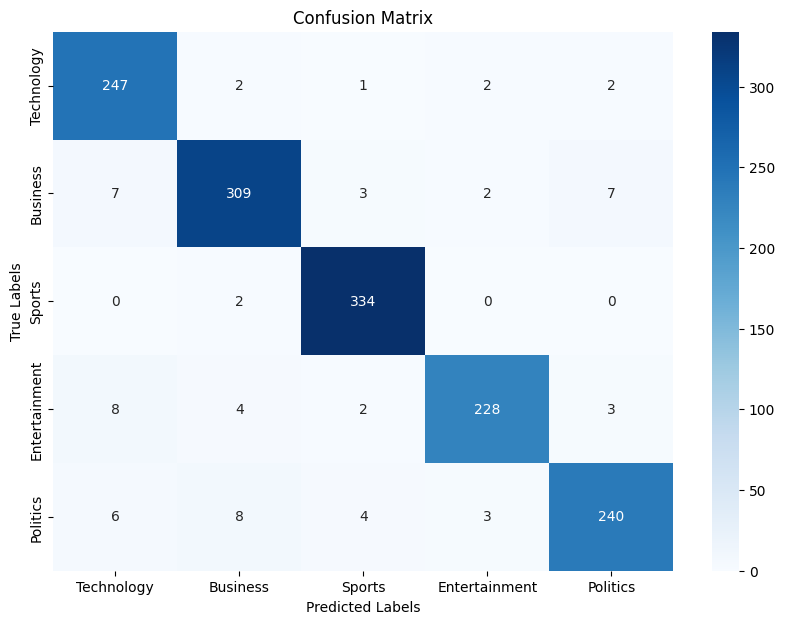

Classification Report:
               precision    recall  f1-score   support

   Technology       0.92      0.97      0.95       254
     Business       0.95      0.94      0.95       328
       Sports       0.97      0.99      0.98       336
Entertainment       0.97      0.93      0.95       245
     Politics       0.95      0.92      0.94       261

     accuracy                           0.95      1424
    macro avg       0.95      0.95      0.95      1424
 weighted avg       0.95      0.95      0.95      1424

Accuracy: 0.9536516853932584
NDCG score with 1st 2 relevant ranks: 0.9793163537068629
==========================Val metrics================================


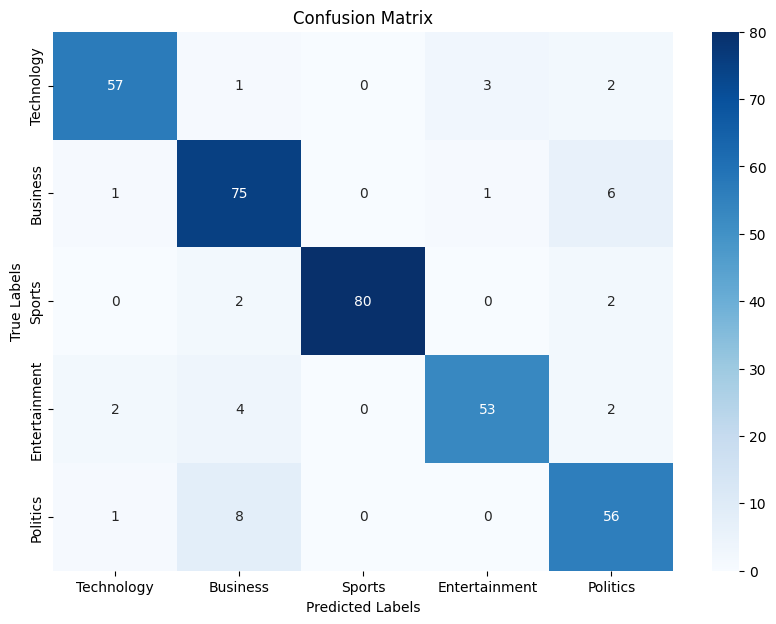

Classification Report:
               precision    recall  f1-score   support

   Technology       0.93      0.90      0.92        63
     Business       0.83      0.90      0.87        83
       Sports       1.00      0.95      0.98        84
Entertainment       0.93      0.87      0.90        61
     Politics       0.82      0.86      0.84        65

     accuracy                           0.90       356
    macro avg       0.90      0.90      0.90       356
 weighted avg       0.91      0.90      0.90       356

Accuracy: 0.901685393258427
NDCG score with 1st 2 relevant ranks: 0.9446543900381243
==========================End of Folds================================
time taken(mins):  0.10058753490447998
param_dict[best_estimator]:  XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1.0,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='mlogloss', gamma=0,

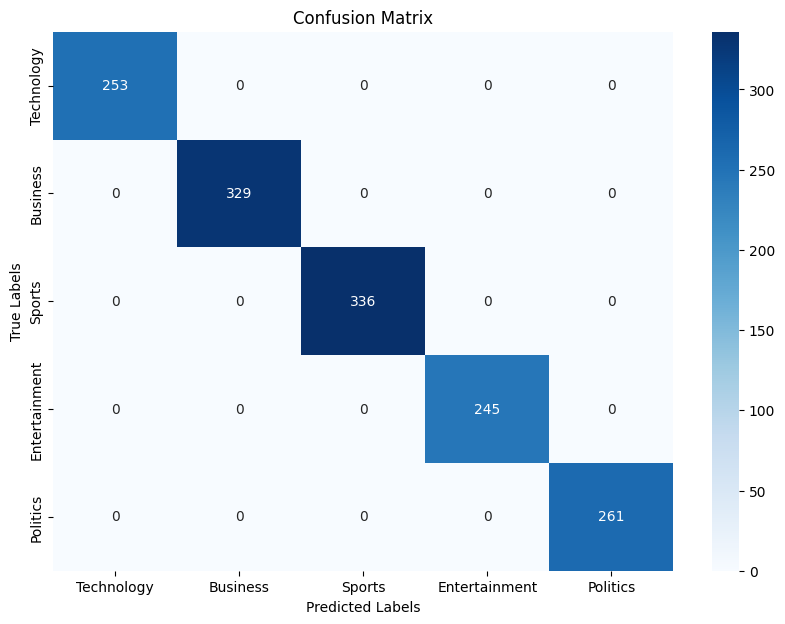

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       253
     Business       1.00      1.00      1.00       329
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       245
     Politics       1.00      1.00      1.00       261

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


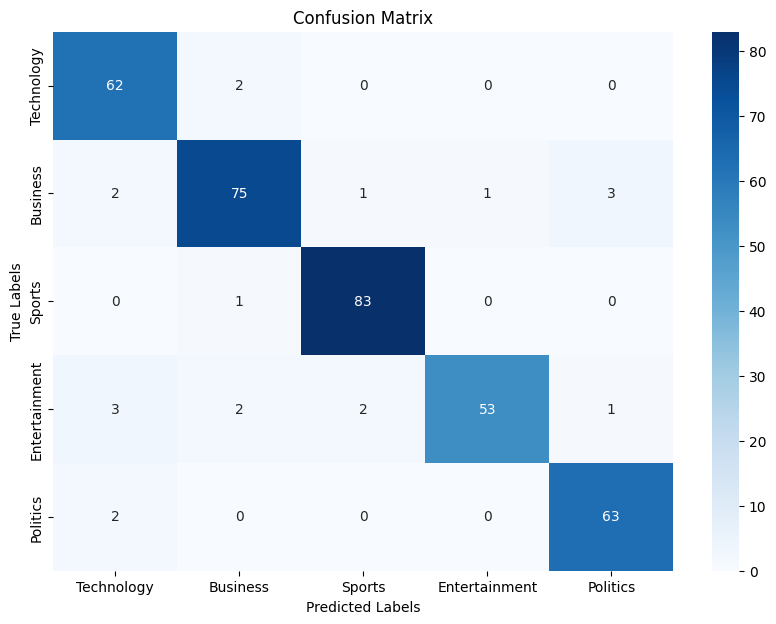

Classification Report:
               precision    recall  f1-score   support

   Technology       0.90      0.97      0.93        64
     Business       0.94      0.91      0.93        82
       Sports       0.97      0.99      0.98        84
Entertainment       0.98      0.87      0.92        61
     Politics       0.94      0.97      0.95        65

     accuracy                           0.94       356
    macro avg       0.94      0.94      0.94       356
 weighted avg       0.95      0.94      0.94       356

Accuracy: 0.9438202247191011
NDCG score with 1st 2 relevant ranks: 0.9686320689606752
============Fold 2=============
==========================Train metrics================================


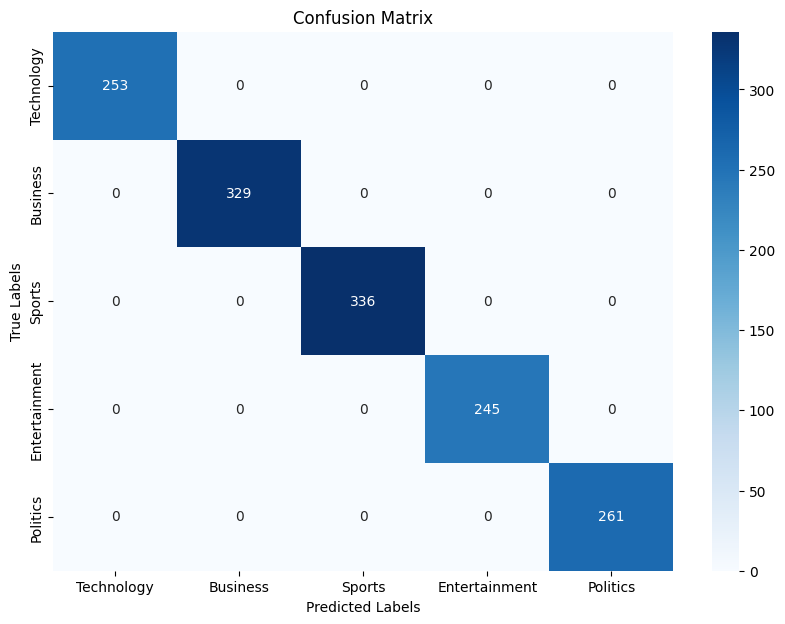

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       253
     Business       1.00      1.00      1.00       329
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       245
     Politics       1.00      1.00      1.00       261

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


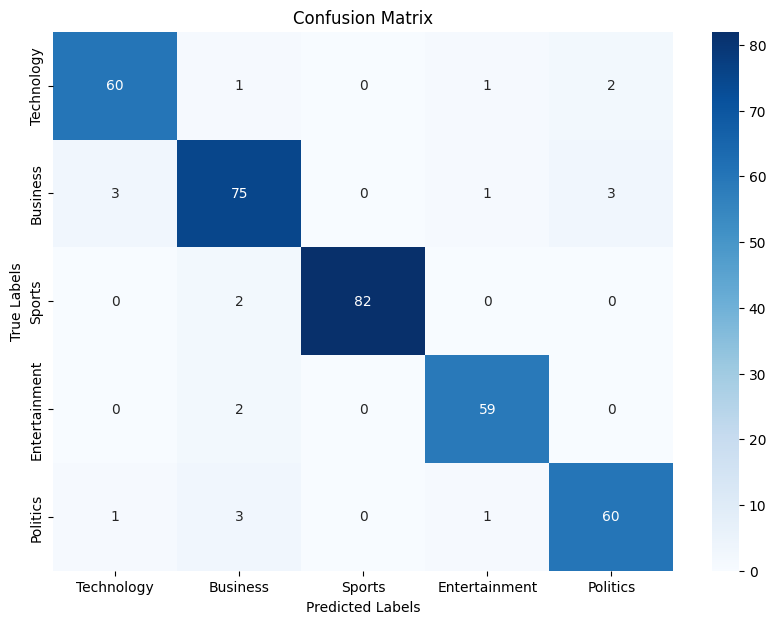

Classification Report:
               precision    recall  f1-score   support

   Technology       0.94      0.94      0.94        64
     Business       0.90      0.91      0.91        82
       Sports       1.00      0.98      0.99        84
Entertainment       0.95      0.97      0.96        61
     Politics       0.92      0.92      0.92        65

     accuracy                           0.94       356
    macro avg       0.94      0.94      0.94       356
 weighted avg       0.94      0.94      0.94       356

Accuracy: 0.9438202247191011
NDCG score with 1st 2 relevant ranks: 0.9668597943719914
============Fold 3=============
==========================Train metrics================================


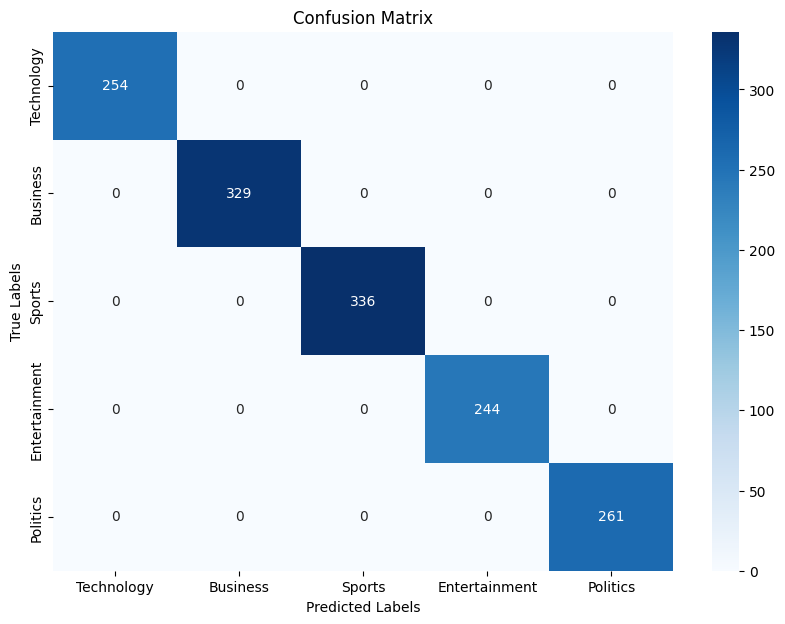

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       254
     Business       1.00      1.00      1.00       329
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       244
     Politics       1.00      1.00      1.00       261

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


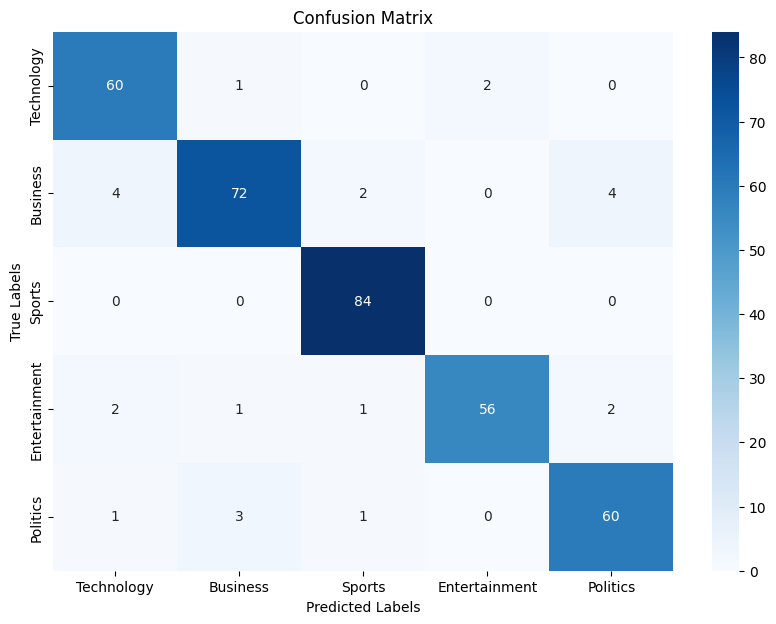

Classification Report:
               precision    recall  f1-score   support

   Technology       0.90      0.95      0.92        63
     Business       0.94      0.88      0.91        82
       Sports       0.95      1.00      0.98        84
Entertainment       0.97      0.90      0.93        62
     Politics       0.91      0.92      0.92        65

     accuracy                           0.93       356
    macro avg       0.93      0.93      0.93       356
 weighted avg       0.93      0.93      0.93       356

Accuracy: 0.9325842696629213
NDCG score with 1st 2 relevant ranks: 0.9609406630818633
============Fold 4=============
==========================Train metrics================================


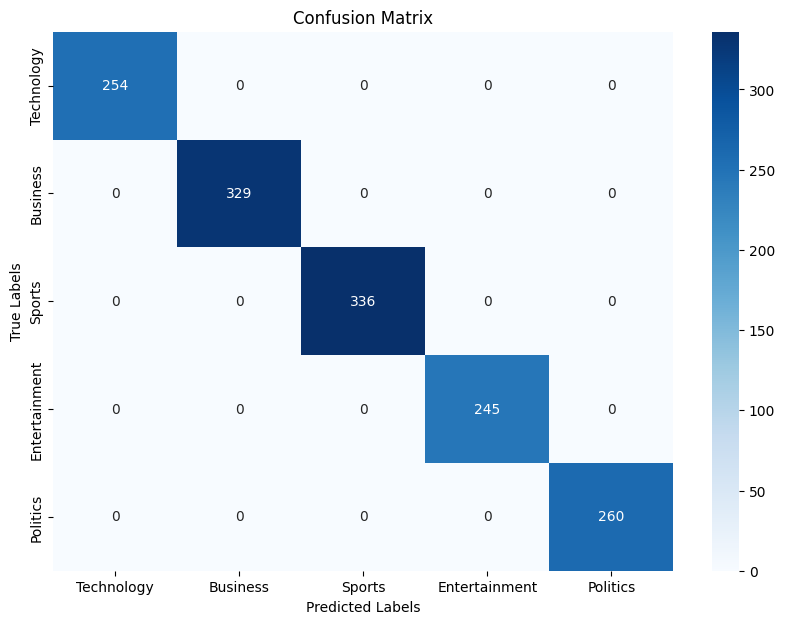

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       254
     Business       1.00      1.00      1.00       329
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       245
     Politics       1.00      1.00      1.00       260

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


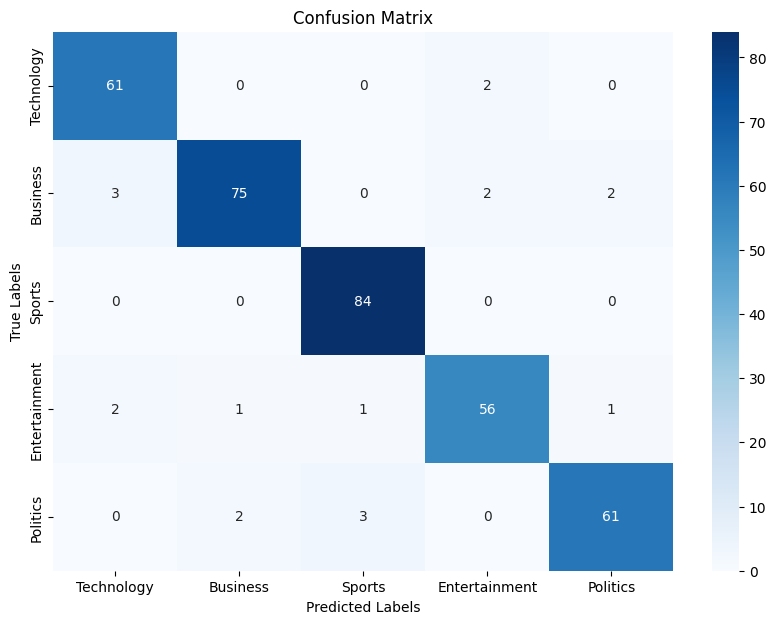

Classification Report:
               precision    recall  f1-score   support

   Technology       0.92      0.97      0.95        63
     Business       0.96      0.91      0.94        82
       Sports       0.95      1.00      0.98        84
Entertainment       0.93      0.92      0.93        61
     Politics       0.95      0.92      0.94        66

     accuracy                           0.95       356
    macro avg       0.95      0.95      0.94       356
 weighted avg       0.95      0.95      0.95       356

Accuracy: 0.9466292134831461
NDCG score with 1st 2 relevant ranks: 0.9714410577247203
============Fold 5=============
==========================Train metrics================================


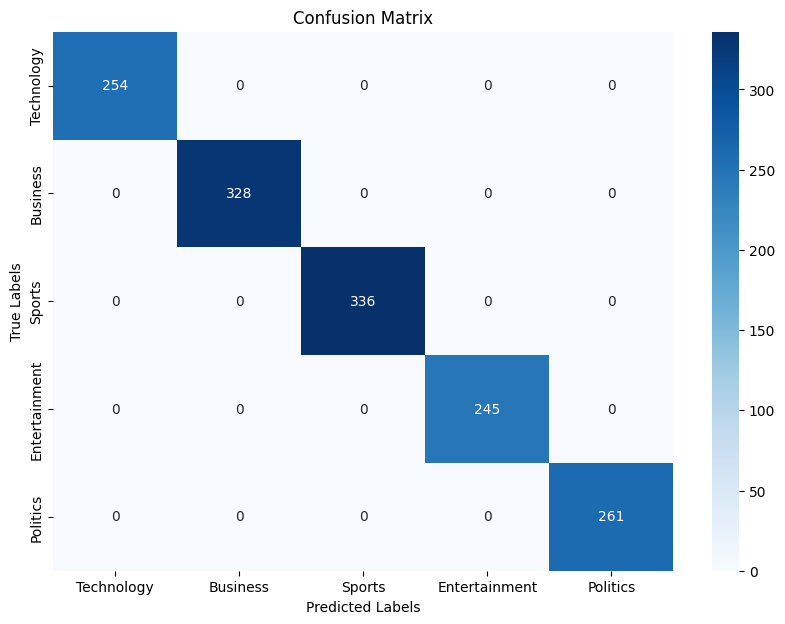

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       254
     Business       1.00      1.00      1.00       328
       Sports       1.00      1.00      1.00       336
Entertainment       1.00      1.00      1.00       245
     Politics       1.00      1.00      1.00       261

     accuracy                           1.00      1424
    macro avg       1.00      1.00      1.00      1424
 weighted avg       1.00      1.00      1.00      1424

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


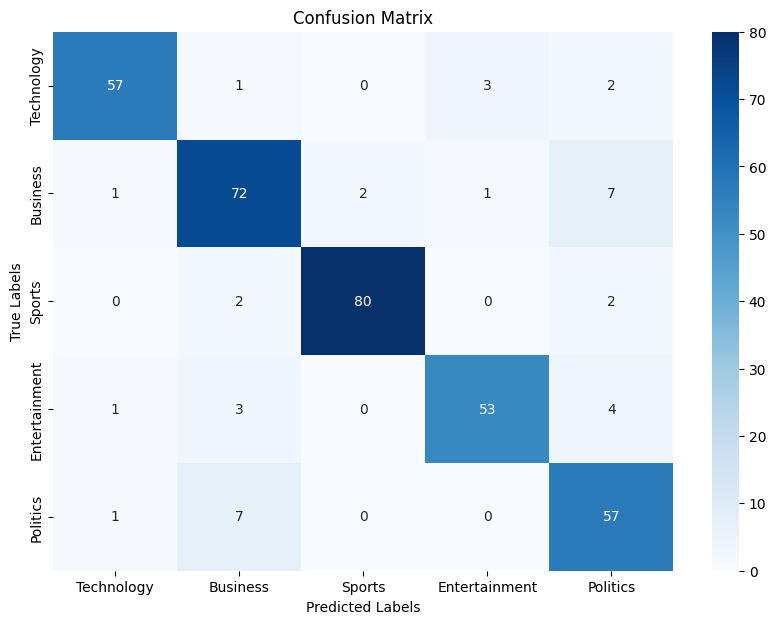

Classification Report:
               precision    recall  f1-score   support

   Technology       0.95      0.90      0.93        63
     Business       0.85      0.87      0.86        83
       Sports       0.98      0.95      0.96        84
Entertainment       0.93      0.87      0.90        61
     Politics       0.79      0.88      0.83        65

     accuracy                           0.90       356
    macro avg       0.90      0.89      0.90       356
 weighted avg       0.90      0.90      0.90       356

Accuracy: 0.8960674157303371
NDCG score with 1st 2 relevant ranks: 0.9439188296248014
==========================End of Folds================================
time taken(mins):  0.105380117893219
param_dict[best_estimator]:  XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1.0,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='mlogloss', gamma=0, 

In [40]:


param=[
        
    {
    'classifier':[RandomForestClassifier()],
        'classifier__n_estimators':[200],
        'classifier__max_depth':[3,5],
        #'classifier__min_samples_split':[2,5,10],
        #'classifier__min_samples_leaf':[1,2,4],
        'classifier__bootstrap':[True],
        'classifier__oob_score':[True]

    }

    ,
    {
    'classifier':[xgb.XGBClassifier(use_label_encoder=False)],
    'classifier__n_estimators':[200],
    'classifier__learning_rate':[0.1,0.2],
    'classifier__max_depth':[3],
    'classifier__subsample':[0.8],
    'classifier__colsample_bytree':[1.0],
    'classifier__eval_metric':['mlogloss']

    }
    ,

    # Decision Tree
    {
        'classifier': [DecisionTreeClassifier()],
        'classifier__max_depth': [5, 7]
    },

    # Naïve Bayes (No hyperparameters to tune)
    {
        'classifier': [GaussianNB()]
    },

    # K-Nearest Neighbors
    {
        'classifier': [KNeighborsClassifier()],
        'classifier__n_neighbors': [5, 7],  # Number of neighbors
        'classifier__weights': ['uniform', 'distance'],  # Weighting method
        'classifier__metric': ['cosine']  # Distance metric
    }

    ]

estimator_pkl='best_estimator.pkl'

find_best_model(estimator_pkl,xtrain,ytrain,xtest,ytest,5,True)

#### Test Data Evaluation

['only_model.joblib']

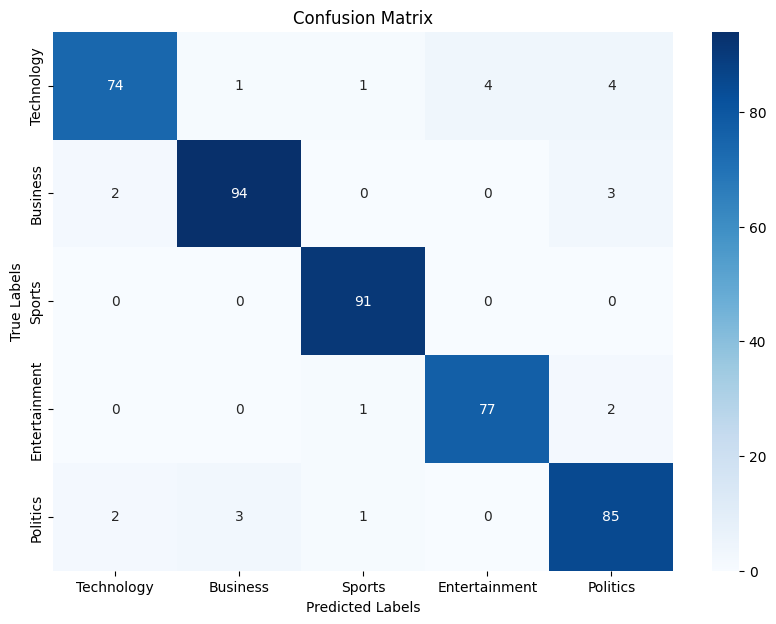

Classification Report:
               precision    recall  f1-score   support

   Technology       0.95      0.88      0.91        84
     Business       0.96      0.95      0.95        99
       Sports       0.97      1.00      0.98        91
Entertainment       0.95      0.96      0.96        80
     Politics       0.90      0.93      0.92        91

     accuracy                           0.95       445
    macro avg       0.95      0.95      0.95       445
 weighted avg       0.95      0.95      0.95       445

Accuracy: 0.946067415730337
NDCG score with 1st 2 relevant ranks: 0.9687525304654906


(0.946067415730337, 0.9687525304654906)

In [ ]:
param_dict=pickle.load(open(estimator_pkl,'rb'))
estimator=param_dict['best_estimator']

import joblib
joblib.dump(estimator, "only_model.joblib")

y_pred_probs=pd.DataFrame(estimator.predict_proba(xtest),columns=estimator.classes_)

ytest=pd.get_dummies(ytest).astype(int)

accuracy_checks(ytest,y_pred_probs)

Feature importances:


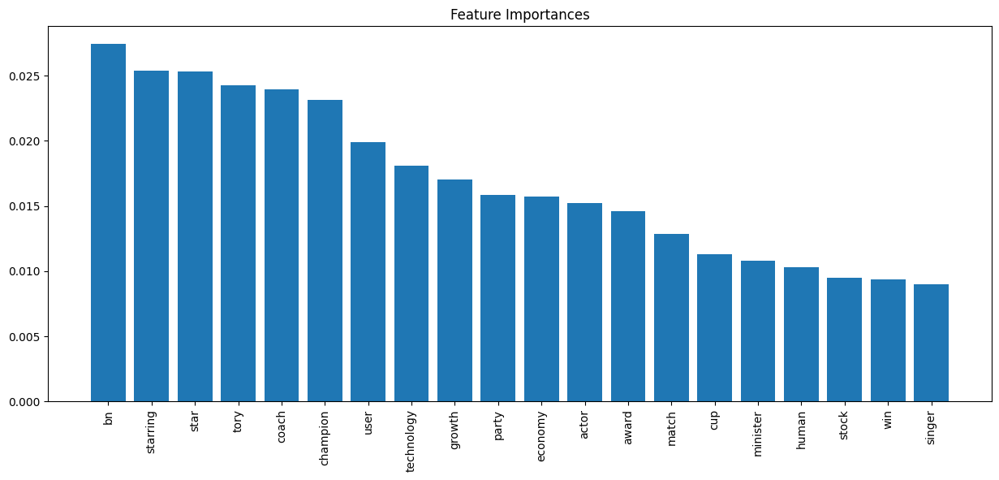

In [42]:
th=20

# Retrieve feature importances or equivalent
if hasattr(estimator, 'feature_importances_'):
    importances = estimator.feature_importances_
    print("Feature importances:")
    #print(importances)
elif hasattr(estimator, 'coef_'):
    importances = best_classifier.coef_
    print("Model coefficients:")
    print(importances)
else:
    print("The best classifier does not provide feature importances or coefficients.")

# Optional: visualize feature importances if available
if 'importances' in locals():

    feature_names = xtrain.columns if hasattr(xtrain, 'columns') else np.arange(xtrain.shape[1])
    sorted_indices = np.argsort(importances)[::-1][:th]
    plt.figure(figsize=(15, 6))
    plt.bar(range(len(sorted_indices)), importances[sorted_indices], align='center')
    plt.xticks(range(len(sorted_indices)), feature_names[sorted_indices], rotation=90)
    plt.title('Feature Importances')
    plt.show()

In [50]:

param_dict['numeric_cols']=numeric_cols
param_dict['scalar']=scalar
param_dict['target_encode']=target_encode
param_dict['rev_target_encode']=rev_target_encode

param_dict['vectorizer']=vectorizer
param_dict['param_grid']=None
param_dict['best_estimator']=None
param_dict['xtrain_np']=np.array(xtrain)
param_dict['feature_set']=xtrain.columns.tolist()

pickle.dump(param_dict,open(estimator_pkl,'wb'))

#### Model Interpretability

In [44]:
def feature_revtransform(feature,scaler,numeric_cols,val):
    try:
        feature_index=numeric_cols.index(feature)
        feature_mean = scaler.mean_[feature_index]
        feature_std = scaler.scale_[feature_index]
        val=feature_mean+(val*feature_std)
        return val
    except:
        return val

def extract_values_and_operators(st):
    # Match standalone numbers (including decimals and negatives) and comparison operators
    pattern = r"(?<!\w)-?\d+\.\d+|[<>=]+"
    matches = re.findall(pattern, st)
    # Convert numbers to float where applicable
    result = [float(m) if re.match(r"-?\d+\.\d+", m) else m for m in matches]
    return result

def update_lime_explanation(lime_exp, scaler, numeric_cols):
    """
    Update LIME explanation to use reverse-transformed values.
    """
    updated_explanation = []
    for condition, contrib in lime_exp.as_list():
        feature_name = re.search(r'([a-zA-Z_][a-zA-Z0-9_\.]*)\s*[<>=]', condition).group(1)  # Extract the feature name
        if feature_name in numeric_cols:
            # Extract numeric bounds and reverse-transform them

            bounds = extract_values_and_operators(condition)
            if len(bounds)==2:
                bounds[1]=feature_revtransform(feature_name,scaler,numeric_cols,bounds[1])
                updated_condition=feature_name+' '+str(bounds[0])+' '+str(bounds[1])
                updated_explanation.append((updated_condition, contrib))
            elif len(bounds)==4:
                bounds[0]=feature_revtransform(feature_name,scaler,numeric_cols,bounds[0])
                bounds[3]=feature_revtransform(feature_name,scaler,numeric_cols,bounds[3])
                updated_condition=str(bounds[0])+' '+str(bounds[1])+' '+feature_name+' '+str(bounds[2])+' '+str(bounds[3])
                updated_explanation.append((updated_condition, contrib))
            else:
                updated_explanation.append((condition, contrib))
        else:
            # Non-numeric features remain unchanged
            updated_explanation.append((condition, contrib))
    return updated_explanation

def show_lime_with_original_values(lime_exp, scaler, numeric_cols):

    updated_explanation = update_lime_explanation(lime_exp, scaler, numeric_cols)

    df_explanation = pd.DataFrame(updated_explanation, columns=["Feature Condition", "Contribution"])

    df_explanation["Absolute Contribution"] = df_explanation["Contribution"].abs()
    df_explanation = df_explanation.sort_values(by="Absolute Contribution", ascending=False)

    df_explanation = df_explanation.drop(columns=["Absolute Contribution"])
    display(df_explanation)

In [ ]:


# Convert xtest to a numpy array (if not already)
xtrain_np = np.array(xtrain)
xtest_np = np.array(xtest[xtrain.columns])

# Initialize the LIME explainer
lime_explainer = LimeTabularExplainer(
    training_data=xtrain_np,  # Training data
    mode='classification',      
    feature_names=xtrain.columns.tolist(),  # Feature names
    verbose=True,            # More detailed explanations
    random_state=42
)

# Explain the first 5 rows in xtest
for i in range(5):
    print(f"LIME Explanation for row {i+1}:")
    lime_exp = lime_explainer.explain_instance(
        data_row=xtest_np[i],  # Row to explain
        predict_fn=estimator.predict_proba  # Prediction function
    )


    #original_feature_values=revtransform_standardize_data(xtest_ML.iloc[[i]],numeric_cols_ML,scalar_ML).iloc[0]
    display(data.loc[[xtest_index_dict[i]]])

    show_lime_with_original_values(lime_exp, scalar, numeric_cols)
    lime_exp.show_in_notebook(show_table=True)

LIME Explanation for row 1:
Intercept 0.22958547027121684
Prediction_local [0.10662215]
Right: 0.9984225


,Category,Article,tokens,noun_phrases,noun_phrase_dependency,noun_phrase_siblings
1978,Business,venezuela reviews foreign deals venezuela is to review all foreign investment in its mining industries in an effort to strengthen its indigenous industrial output president hugo chavez has ordered all existing contracts with foreign firms to be examined to see if they provide maximum benefits to the country the review will cover production of gold aluminium and iron ore although it excludes the country s oil sector chavez has sought to extend the state s role in all sectors of the economy the left wing president is conducting a controversial review of land ownership in the country while also seeking to create a state run telecom s firm to compete with foreign owned businesses he has argued that major economic reforms are vital to improve the lives of venezuela s poorest citizens announcing the review of raw material production minister victor alvarez said the government would seek to transfer technology training capability and content from projects with foreign partners we are defending our national sovereignty over the use of our national resources which must serve the endogenous development of the nation mr alvarez said for this reason we are reviewing all memorandums of understanding all letters of intent all agreements that have been signed all contracts to check which of these comply with these directives everything absolutely everything has to be reviewed venezuela has previously assured foreign companies with operations in the mineral rich country that it respects existing contracts however the government insisted that it needed to develop its own industrial infrastructure in order to create new jobs and lessen its reliance on foreign partners if we don t do this we are just going to carry on being slaves suppliers of raw materials all our lives and we will never develop our own productive capacity mr alvarez added companies from the united states canada france and switzerland all have substantial investments in venezuela s mining sector,"[venezuela, review, foreign, deal, venezuela, review, foreign, investment, mining, industry, effort, strengthen, indigenous, industrial, output, president, hugo, chavez, ordered, existing, contract, foreign, examined, see, provide, maximum, benefit, country, review, cover, production, gold, aluminium, iron, ore, although, excludes, country, oil, sector, chavez, sought, extend, state, role, sector, economy, left, wing, president, conducting, controversial, review, land, ownership, country, seeking, create, state, run, telecom, compete, foreign, owned, business, argued, major, economic, reform, vital, improve, life, venezuela, poorest, citizen, announcing, review, raw, material, production, minister, victor, alvarez, seek, transfer, technology, training, capability, content, project, foreign, partner, defending, national, sovereignty, use, national, resource, must, serve, ...]","[venezuela reviews deals venezuela, investment, mining industries, effort, output president hugo chavez, contracts, firms, benefits, country, review, production, aluminium, iron ore, country oil sector chavez, state role, sectors, economy, wing president, review, land ownership, country, state run telecom firm, businesses, reforms, lives, venezuela citizens, review, material production minister victor alvarez, government, technology training capability, content, projects, partners, sovereignty, use, resources, development, nation, mr alvarez, reason, memorandums, letters, intent, agreements, contracts, comply, directives, venezuela, companies, operations, country, contracts, government, infrastructure, order, jobs, reliance, partners, t, slaves suppliers, materials, lives, capacity, mr alvarez companies, united states canada france, switzerland, investments, venezuela mining sector]","[venezuela reviews foreign deals venezuela -> nsubj, all foreign investment -> dobj, its mining industries -> pobj, an effort -> pobj, i

,Feature Condition,Contribution
0,pentagon <= 1.0497055606011377e-06,-0.091054
1,lira <= -6.960664932468305e-05,0.067348
2,etch <= -7.154405957422055e-05,-0.063622
3,nestle <= 7.164365913645405e-05,0.059337
4,huddle <= 5.319982056647835e-05,-0.048322
5,lit <= 2.0325979508027388e-05,-0.032153
6,carnival <= 6.274883714240125e-05,-0.014543
7,serena <= -1.550500370524723e-05,-0.011598
8,hendrix <= -9.06688057753526e-05,0.011064
9,pub <= -5.382951167383484e-05,0.000580


LIME Explanation for row 2:
Intercept -0.15778953959059344
Prediction_local [0.10796441]
Right: 0.014930218


,Category,Article,tokens,noun_phrases,noun_phrase_dependency,noun_phrase_siblings
1034,Entertainment,jackson film absolute disaster a pr expert has told the michael jackson child abuse trial that the tv documentary at the heart of the case was an absolute disaster ann kite told the court in the californian town of santa maria she was hired to crisis manage the fallout after the programme had aired in jurors saw the film in which the pop star held hands with the alleged victim on tuesday mr jackson denies charges of child abuse and false imprisonment if convicted he could face up to years in prison ms kite suggested jackson s associates had been intent on launching a smear campaign against the accuser s family after the airing of martin bashir s film living with michael jackson she told the court that in the aftermath of the broadcast a jackson lawyer had told her the boy s mother would be made to look like a crack whore jackson s defence questioned ms kite s credibility pointing that she worked for the singer s team for less than a week before being fired and had never met or spoken to the star ms kite said she received a phone call on february from a jackson associate marc s chaff el who said the boy and his family had left the neverland ranch where they had been staying ms kite told the court she had later asked jackson s lawyer david le grand what had happened i said don t make me believe that these people were hunted down like dogs and brought back to the ranch she said ms kite began to work for mr jackson in february after the controversial film was televised in the us and europe the documentary sparked a media storm and the subsequent investigation into mr jackson s relationship with the boy in the film the singer said he did not see anything wrong with sharing a bed with a child questioned by the prosecution ms kite said her plan had been to move media coverage of the star away from a focus on his human frailties to concentrate more on his musical genius ms kite said that an additional problem was the release of documents relating to a previous allegation of child abuse against mr jackson the smoking gun website publication was beyond disaster ms kite said correspondents say the reference is important because it was unclear whether the prosecution would be able to bring up the previous case in front of the jury the judge is studying whether the prosecution s first witness reporter martin bashir is in contempt of court the defence protested after mr bashir who interviewed jackson for the tv documentary refused to answer nearly all their questions citing a california shield law intended to allow journalists to protect their sources in the prosecution s opening statement on monday tom s ned don told the court that mr jackson had shown the boy porn and plied him with wine in order to molest him he said the singer had visited sexually explicit websites and showed the boy who was at the time and his younger brother pornography at his ranch,"[jackson, absolute, disaster, pr, expert, told, michael, jackson, child, abuse, trial, tv, documentary, heart, case, absolute, disaster, ann, kite, told, court, californian, town, santa, maria, hired, crisis, manage, fallout, programme, aired, juror, saw, pop, star, held, hand, alleged, victim, tuesday, jackson, denies, charge, child, abuse, false, imprisonment, convicted, face, prison, kite, suggested, jackson, associate, intent, launching, smear, campaign, accuser, family, airing, martin, bashir, living, michael, jackson, told, court, aftermath, broadcast, jackson, lawyer, told, boy, mother, made, look, like, crack, whore, jackson, defence, questioned, kite, credibility, pointing, worked, singer, team, le, week, fired, never, met, spoken, star, kite, received, phone, call, ...]","[jackson film, absolute disaster, pr expert, michael jackson child abuse trial, tv documentary, heart, case, disaster ann kite, court, town, santa maria, crisis, fallout, programme, jurors, film, pop star, hands

,Feature Condition,Contribution
0,carers <= -1.7302880496639593e-05,0.066132
1,mock <= 7.775112193239239e-05,0.053795
2,roundabout <= 2.9322359337089843e-05,0.047851
3,nap <= -1.585365340512192e-05,0.047607
4,huddle <= 5.319982056647835e-05,0.046546
5,sunderland <= -7.606305345138613e-05,-0.046229
6,northampton <= 3.0468118427027157e-05,0.034197
7,reggae <= -2.2218339390947593e-05,0.028530
8,makeup <= 1.166820979928737e-05,-0.008390
9,bettie <= -5.099818137210713e-05,-0.004284


LIME Explanation for row 3:
Intercept 0.07958106667116091
Prediction_local [0.10607032]
Right: 0.023495717


,Category,Article,tokens,noun_phrases,noun_phrase_dependency,noun_phrase_siblings
1897,Sports,henry tipped for fife award fife president sepp b latter hopes arsenal s thierry henry will be named world player of the year on monday henry is on the fife shortlist with barcelona s ronaldinho and newly crowned european footballer of the year ac milan s andriy shevchenko b latter said henry for me is the personality on the field he is the man who can run and organize the game the winner of the accolade will be named at a glittering ceremony at zurich s opera house the three shortlisted candidates for the women s award are mia hamm of the united states germany s bir g it prinz and brazilian youngster marta hamm who recently retired is looking to regain the women s award which she lost last year to striker prinz fife has changed the panel of voters for this year s awards male and female captains of every national team will be able to vote as well as their coaches and i pro the global organisation for professional players,"[henry, tipped, fife, award, fife, president, sepp, b, latter, hope, arsenal, thierry, henry, named, player, monday, henry, fife, shortlist, barcelona, ronaldinho, newly, crowned, european, footballer, ac, milan, andriy, shevchenko, b, latter, henry, personality, field, man, run, organize, winner, accolade, named, glittering, ceremony, zurich, opera, house, three, shortlisted, candidate, woman, award, mia, hamm, united, state, germany, bir, g, prinz, brazilian, youngster, marta, hamm, recently, retired, looking, regain, woman, award, lost, striker, prinz, fife, changed, panel, voter, award, male, female, captain, every, national, team, able, vote, well, coach, pro, global, organisation, professional, player]","[henry fife award fife president sepp latter hopes, arsenal s thierry henry, world player, year, monday henry, fife shortlist, barcelona s ronaldinho, footballer, year, ac milan s shevchenko b latter, henry, personality, field, man, game, winner, accolade, ceremony, zurich s opera house, candidates, women award, mia hamm, united states germany s bir g, prinz brazilian youngster marta hamm, women award, striker prinz fife, panel, voters, year awards captains, team, coaches, organisation, players]","[henry tipped for fife award fife president sepp b latter hopes -> ROOT, arsenal s thierry henry -> nsubjpass, world player -> oprd, the year -> pobj, monday henry -> pobj, the fife shortlist -> pobj, barcelona s ronaldinho -> pobj, newly crowned european footballer -> conj, the year -> pobj, ac milan s andriy shevchenko b latter -> nsubj, henry -> nsubj, me -> pobj, the personality -> attr, the field -> pobj, he -> nsubj, the man -> attr, who -> nsubj, the game -> dobj, the winner -> nsubjpass, the accolade -> pobj, a glittering ceremony -> pobj, zurich s opera house -> pobj, the three shortlisted candidates -> nsubj, the women s award -> pobj, mia hamm -> attr, the united states germany s bir g -> pobj, it -> nsubj, prinz and brazilian youngster marta hamm -> appos, who -> nsubj, the women s award -> dobj, she -> nsubj, striker prinz fife -> pobj, the panel -> dobj, voters -> pobj, this year s awards male and female captains -> pobj, every national team -> pobj, their coaches -> dobj, i -> nsubj, the global organisation -> dobj, professional players -> pobj]","[henry tipped for fife award fife president sepp b latter hopes, arsenal s thierry henry world player, arsenal s thierry henry world player, the year, monday henry, the fife shortlist, barcelona s ronaldinho, newly crowned european footballer, ac milan s andriy shevchenko b latter, henry the personality, me, henry the personality, the field, he the man, he the man, who, the game, the winner, the accolade, a glittering ceremony, zurich s opera house, mia hamm the three shortlisted candidates, the women s award, mia hamm the three shortlisted candidates, the united states germany s bir g, it, prinz and brazilian youngster marta hamm, she, striker prinz fife, the

,Feature Condition,Contribution
0,ontario <= -2.0682204223491636e-05,0.048146
1,viacom <= -4.388129871194771e-06,-0.042637
2,carpenter <= 5.706002212949599e-05,-0.038985
3,grave <= 7.935001422909355e-07,0.032810
4,quango <= -7.774891143379214e-05,0.022480
5,ballet <= -0.00012809357068294298,0.019791
6,nb <= -4.346168938118252e-05,0.017186
7,clause <= -4.08988672100196e-05,-0.016995
8,sm <= -1.3134565339800838e-05,-0.010406
9,unilever <= -5.129233952475389e-05,-0.004900


LIME Explanation for row 4:
Intercept 0.03555636030153739
Prediction_local [0.10847483]
Right: 0.0015344614


,Category,Article,tokens,noun_phrases,noun_phrase_dependency,noun_phrase_siblings
2218,Sports,davies favors gloucester future wales hooker me fin davies is likely to stay with english side gloucester despite reported interest from the neath swansea ospreys bic wales understands the ospreys are interested in the year old but that he would prefer to stay where he is davies one of the stars of saturday s rb s six nations win over england is only on a year contract at kings holm but the hooker has proved his worth to the zurich premiership side and is likely to get a new deal next season the summer demise of the celtic warriors region left davies in the cold and forced him to take a semiprofessional contract with neath rfc although he got match time with the ospreys at the request of the wales management he admitted before his move to gloucester that he was angry with the way he was treated the w ru didn t give me any help off the field it was very disappointing davies said at the time it was a hard time throughout the summer then deciding whether to accept an offer from stade francais which would have ended my wales career,"[davy, favor, gloucester, future, wale, hooker, fin, davy, likely, stay, english, side, gloucester, despite, reported, interest, neath, swansea, osprey, bic, wale, understands, osprey, interested, old, prefer, stay, davy, star, saturday, rb, six, nation, win, england, contract, king, holm, hooker, proved, worth, zurich, premiership, side, likely, get, deal, next, season, summer, demise, celtic, warrior, region, left, davy, cold, forced, take, semiprofessional, contract, neath, rfc, although, got, match, osprey, request, wale, management, admitted, move, gloucester, angry, way, treated, w, ru, give, help, field, disappointing, davy, hard, throughout, summer, deciding, whether, accept, offer, stade, francais, ended, wale, career]","[davies, fin davies, side gloucester, interest, neath swansea ospreys wales, ospreys, year, davies, stars, saturday, england, year contract, kings holm, hooker, worth, zurich premiership side, deal, summer demise, warriors region, davies, cold, contract, neath rfc, match time, ospreys, request, wales management, move, way, w ru didn t, help, field, davies, time, time, summer, offer, stade francais, wales career]","[davies -> nsubj, me -> dobj, fin davies -> nsubj, english side gloucester -> pobj, reported interest -> pobj, the neath swansea ospreys bic wales -> pobj, the ospreys -> nsubj, the year -> pobj, he -> nsubj, he -> nsubj, davies -> attr, the stars -> pobj, saturday -> pobj, england -> pobj, a year contract -> pobj, kings holm -> pobj, the hooker -> nsubj, his worth -> oprd, the zurich premiership side -> pobj, a new deal -> dobj, the summer demise -> nsubj, the celtic warriors region -> pobj, davies -> dobj, the cold -> pobj, him -> dobj, a semiprofessional contract -> dobj, neath rfc -> pobj, he -> nsubj, match time -> dobj, the ospreys -> pobj, the request -> pobj, the wales management -> pobj, he -> nsubj, his move -> pobj, he -> nsubj, the way -> pobj, he -> nsubjpass, the w ru didn t -> nsubj, me -> dative, any help -> dobj, the field -> pobj, it -> nsubj, very disappointing davies -> nsubj, the time -> pobj, it -> nsubj, a hard time -> attr, the summer -> pobj, an offer -> dobj, stade francais -> pobj, my wales career -> dobj]","[davies the summer demise, any help me the w ru didn t, fin davies, english side gloucester, reported interest, the neath swansea ospreys bic wales, the ospreys, the year, he, the stars, saturday, england, a year contract, kings holm, his worth the hooker, his worth the hooker, the zurich premiership side, a new deal, davies the summer demise, the celtic warriors region, the cold, him, a semiprofessional contract, neath rfc, match time, the request, the wales management, his move, the way, any help me the w ru didn t, any help me the w ru didn t, the field, a hard time it, very disappointing davies, the time, a hard time it, the summer, an offe

,Feature Condition,Contribution
0,virgin <= -3.0848331186167886e-05,-0.048711
1,ringtones <= 1.0693697510990251e-05,0.048524
2,oozy <= 5.626350411380043e-05,0.045541
3,feta <= 6.070496343082982e-05,0.044721
4,trek <= 2.032417404130443e-05,0.043094
5,mock <= 7.775112193239239e-05,-0.036675
6,renault <= 2.432768252557218e-05,-0.033160
7,podcast <= 5.785315929788431e-05,-0.030200
8,springbok <= 1.0668888883013229e-05,0.028314
9,neville <= 9.274049005858595e-06,0.011470


LIME Explanation for row 5:
Intercept 0.16610678149266905
Prediction_local [0.10712132]
Right: 0.00079869106


,Category,Article,tokens,noun_phrases,noun_phrase_dependency,noun_phrase_siblings
2149,Technology,wi fi web reaches farmers in peru a network of community computer centers linked by wireless technology is providing a helping hand for poor farmers in peru the pilot scheme in the he aral valley kilometres north of the capital lima aims to offer the strong community up to date information on agricultural market prices and trends the agricultural information project for farmers of the chan cay he aral valley also provides vital links between local organisations in charge of water irrigation enabling them to coordinate their actions more than rural inhabitants as well as students in the region will also benefit from the telecom s infrastructure the tele centers uses only free open source software and affordable computer equipment the network has been three years in the making and was officially inaugurated in september the non government organisation ce pes peruvian centre for social studies led the project also backed by local institutions the education and agriculture ministries and european development organisations the plan includes training on computers and internet skills for both operators and users of the system said carlos sal d marriage technical coordinator at ce pes farmers are also taking extra lessons on how to apply the new information to make the most of their plots of land the board of irrigation users which runs the computer centers aims to make the network self sustainable within three years through the cash generated by using the tele centers as internet cares one of the key elements of the project is the agricultural information system with its flagship he aral org website there farmers can find the prices for local produce as well as information on topics ranging from plague prevention to the latest farming techniques the system also helps the inhabitants of the chan cay he aral valley to organize their vital irrigation systems water is the main element that unites them all it is a precious element in peru s coastal areas because it is so scarce and therefore it is necessary to have proper irrigation systems to make the most of it mr sal d marriage told the bic news website the information network also allows farmers to look beyond their own region and share experiences with other colleagues from the rest of peru and even around the world ce pes says the involvement of the farmers has been key in the project s success throughout the last three years the people have provided a vital thrust to the project they feel it belongs to them said mr sal d marriage the community training sessions attended by an equal number of men and women have been the perfect showcase for their enthusiasm we have had an excellent response mainly from young people but we have also had a great feedback when we trained or year old women who were seeing a computer for the first time in their lives so far the he aral programme promoters say the experience has been very positive and are already planning on spreading the model among other farmers organisations in peru this is a pilot project and we have been very keen on its cloning potential in other places underlined mr sal d marriage the ce pes researcher recalls what happened in cuyo a family community with no electricity during the construction of the local tele centre site there it was necessary to build a mini hydraulic dam in order to generate kw worth of power for the computers the communications equipment and the cabin lights it was already dark when the technicians realized they did t have any light bulbs to test the generator so they turned up to the local store to buy light bulbs recalls carlos sal d marriage the logical answer was we don t sell any so they had to wait until the next morning to do the testing now with the wireless network cuyo as well as the other communities is no longer isolated,"[wi, fi, web, reach, farmer, peru, network, community, computer, center, linked, 

,Feature Condition,Contribution
0,busted <= 5.6864538542187465e-05,-0.109832
1,macro <= -2.37449696783924e-05,0.073521
2,juninho <= -1.4041807215134372e-05,-0.061577
3,registration <= -3.716120687550985e-05,-0.051391
4,huddle <= 5.319982056647835e-05,0.043101
5,argonaut <= 7.613754182965882e-05,0.037929
6,oriente <= 6.000779989252141e-05,-0.024593
7,feta <= 6.070496343082982e-05,0.021042
8,schroeder <= 1.2976885532898683e-05,0.008889
9,mut <= 7.667995865874187e-06,0.003927


SHAP Explanation for row 1, predicted class Business:


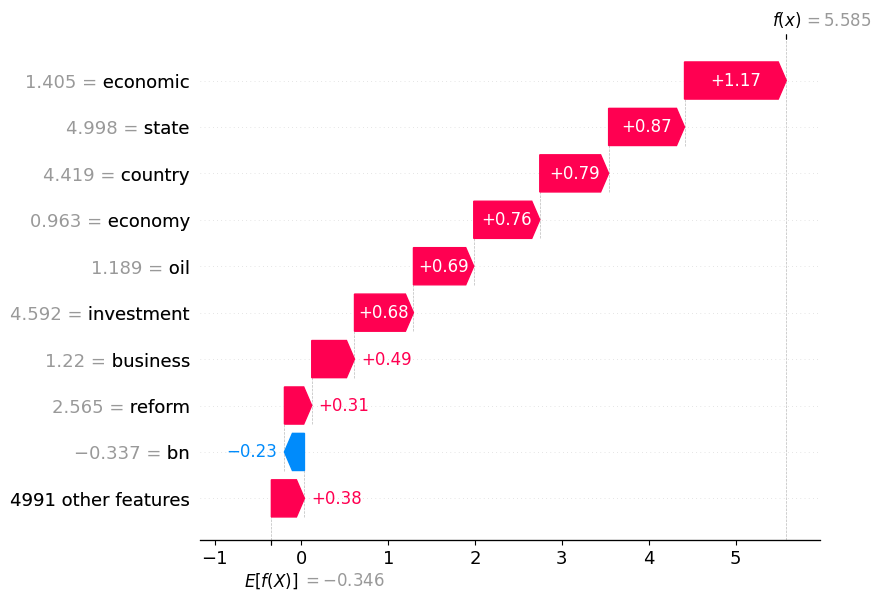

SHAP Explanation for row 2, predicted class Entertainment:


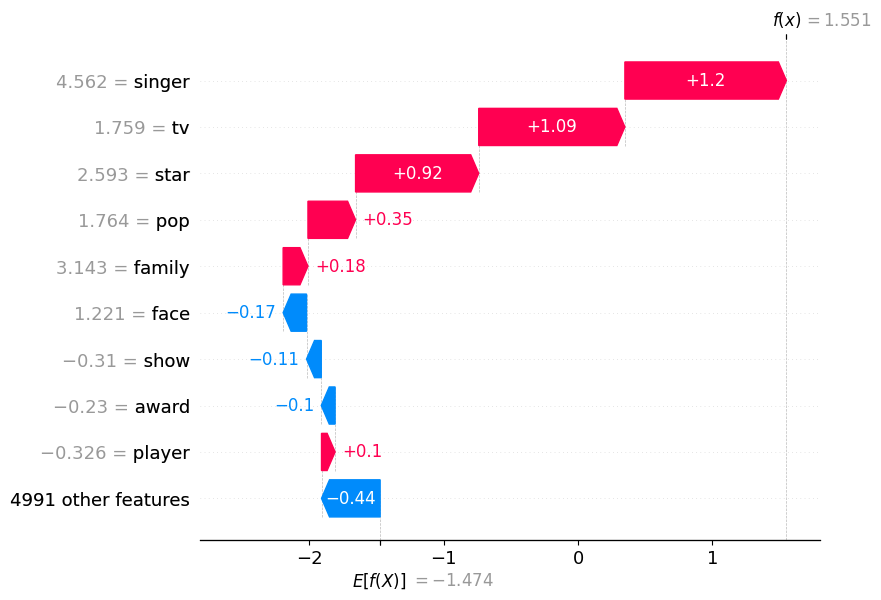

SHAP Explanation for row 3, predicted class Sports:


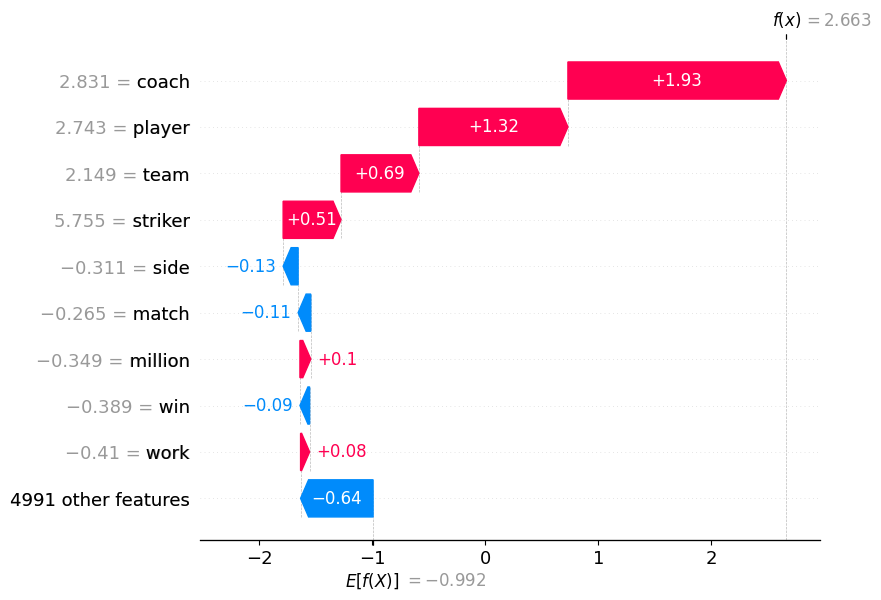

SHAP Explanation for row 4, predicted class Sports:


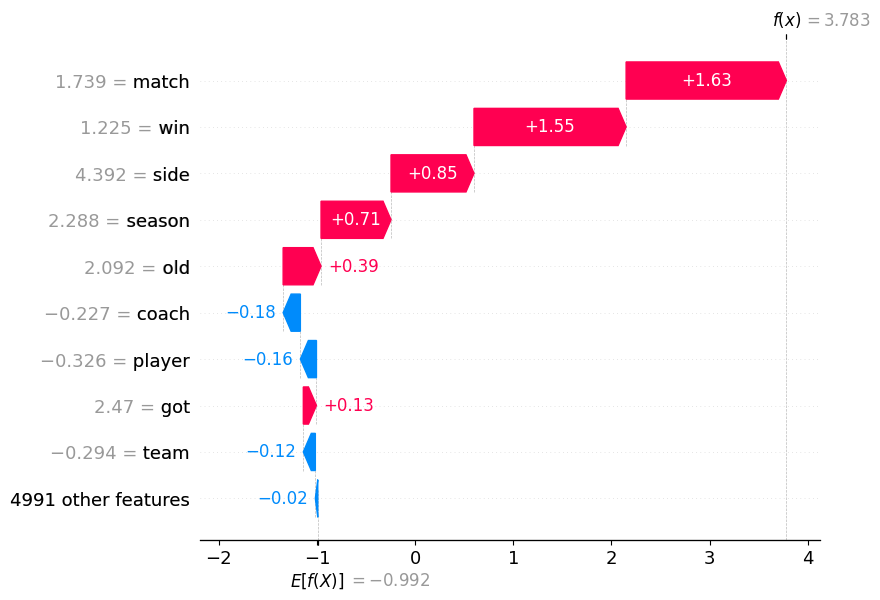

SHAP Explanation for row 5, predicted class Technology:


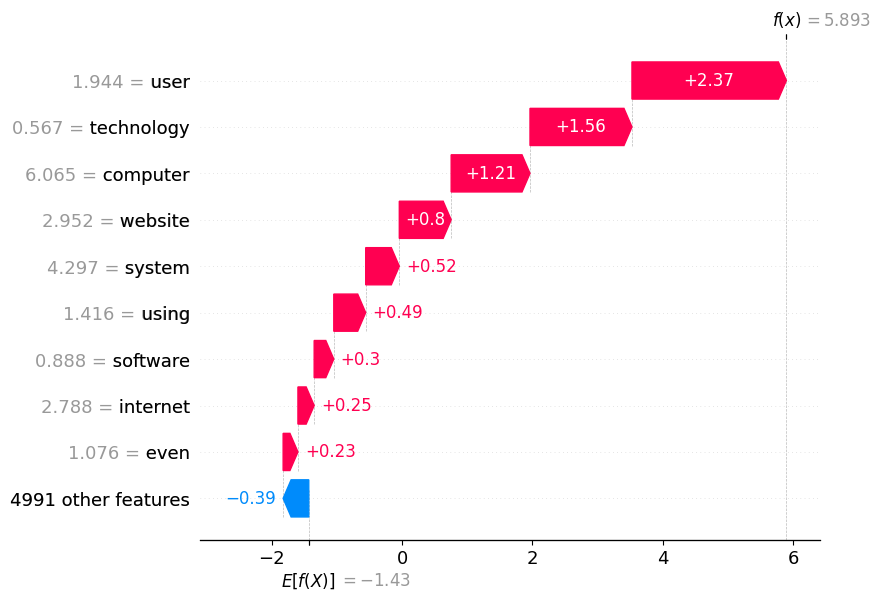

In [46]:


# Initialize SHAP explainer for the XGBoost model
shap_explainer = shap.Explainer(estimator, xtrain)

# Explain the first 5 rows
shap_values = shap_explainer(xtest[xtrain.columns].iloc[:5])  # Explain first 5 rows

xtest_reverse=revtransform_standardize_data(xtest[xtrain.columns].iloc[:5],numeric_cols,scalar)
predicted_classes = np.argmax(estimator.predict_proba(xtest[xtrain.columns].iloc[:5]), axis=1)

# Visualize the SHAP explanations for each row
for i in range(5):
    predicted_class = predicted_classes[i] 
    print(f"SHAP Explanation for row {i+1}, predicted class {rev_target_encode[predicted_class]}:")

    shap.waterfall_plot(shap.Explanation(
        values=shap_values[i, :, predicted_class],  # Use the predicted class
        base_values=shap_values.base_values[i, predicted_class],  # Base value for predicted class
        feature_names=xtrain.columns.tolist(),
        data=xtest_reverse.iloc[i]  # Reverse-transformed values
    ))